In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when ONI is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df) 
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-23 17:51:49,346] A new study created in memory with name: no-name-baf0eeb4-1e45-46a9-a8c8-86933ac946b0
[I 2025-05-23 17:59:39,460] Trial 0 finished with value: 12.859641361236573 and parameters: {'lr': 0.13948871140330307, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.41745451087388685}. Best is trial 0 with value: 12.859641361236573.


Cross Validation Accuracies:
[15.108000755310059, 12.29184341430664, 7.402313709259033, 14.433740615844727, 15.062308311462402]
Mean Cross Validation Accuracy:
12.859641361236573
Standard Deviation of Cross Validation Accuracy:
2.9151147398162607


[I 2025-05-23 18:04:54,482] Trial 1 finished with value: 0.06029335781931877 and parameters: {'lr': 0.0032250930010397755, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.24875909185301515}. Best is trial 1 with value: 0.06029335781931877.


Cross Validation Accuracies:
[0.041305046528577805, 0.05437028780579567, 0.06744019687175751, 0.07791190594434738, 0.060439351946115494]
Mean Cross Validation Accuracy:
0.06029335781931877
Standard Deviation of Cross Validation Accuracy:
0.01230569449336078


[I 2025-05-23 18:13:09,158] Trial 2 finished with value: 2.867919683456421 and parameters: {'lr': 0.2685484207135184, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2649665878921119}. Best is trial 1 with value: 0.06029335781931877.


Cross Validation Accuracies:
[2.915355682373047, 2.257133722305298, 3.571462869644165, 2.520220994949341, 3.075425148010254]
Mean Cross Validation Accuracy:
2.867919683456421
Standard Deviation of Cross Validation Accuracy:
0.45480447996319645


[I 2025-05-23 18:17:06,643] Trial 3 finished with value: 0.06931698247790337 and parameters: {'lr': 0.7705441487256748, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1688077266251985}. Best is trial 1 with value: 0.06029335781931877.


Cross Validation Accuracies:
[0.053890861570835114, 0.05280696973204613, 0.06506732106208801, 0.10199785232543945, 0.07282190769910812]
Mean Cross Validation Accuracy:
0.06931698247790337
Standard Deviation of Cross Validation Accuracy:
0.017938389582427723


[I 2025-05-23 18:24:51,594] Trial 4 finished with value: 1.2215411424636842 and parameters: {'lr': 0.0177069363128185, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.2720214879846481}. Best is trial 1 with value: 0.06029335781931877.


Cross Validation Accuracies:
[1.1131932735443115, 1.2541179656982422, 1.2223117351531982, 1.2624646425247192, 1.2556180953979492]
Mean Cross Validation Accuracy:
1.2215411424636842
Standard Deviation of Cross Validation Accuracy:
0.055923296582100705


[I 2025-05-23 18:29:16,546] Trial 5 finished with value: 9.57319164276123 and parameters: {'lr': 0.11628140386849357, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.2772316354521416}. Best is trial 1 with value: 0.06029335781931877.


Cross Validation Accuracies:
[12.336751937866211, 12.446648597717285, 12.751191139221191, 5.865354537963867, 4.466012001037598]
Mean Cross Validation Accuracy:
9.57319164276123
Standard Deviation of Cross Validation Accuracy:
3.6283616430756798


[I 2025-05-23 18:34:59,955] Trial 6 finished with value: 0.1728207588195801 and parameters: {'lr': 0.05919299425041771, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1631569384118926}. Best is trial 1 with value: 0.06029335781931877.


Cross Validation Accuracies:
[0.10441374033689499, 0.12469980865716934, 0.1627914011478424, 0.22591692209243774, 0.2462819218635559]
Mean Cross Validation Accuracy:
0.1728207588195801
Standard Deviation of Cross Validation Accuracy:
0.05533801418121695


[I 2025-05-23 18:42:08,213] Trial 7 finished with value: 0.08691810667514802 and parameters: {'lr': 0.007548737428772597, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.46665019545706765}. Best is trial 1 with value: 0.06029335781931877.


Cross Validation Accuracies:
[0.06710656732320786, 0.09047198295593262, 0.08497659116983414, 0.10183338820934296, 0.09020200371742249]
Mean Cross Validation Accuracy:
0.08691810667514802
Standard Deviation of Cross Validation Accuracy:
0.01133266264916173


[I 2025-05-23 18:48:10,820] Trial 8 finished with value: 0.059079404920339584 and parameters: {'lr': 0.11365076642037013, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.4339212546918696}. Best is trial 8 with value: 0.059079404920339584.


Cross Validation Accuracies:
[0.04817161709070206, 0.06198415532708168, 0.0611184686422348, 0.07404603809118271, 0.050076745450496674]
Mean Cross Validation Accuracy:
0.059079404920339584
Standard Deviation of Cross Validation Accuracy:
0.00934476513481575


[I 2025-05-23 18:53:18,515] Trial 9 finished with value: 0.07387124076485634 and parameters: {'lr': 0.0014828474705271845, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.10309729184562877}. Best is trial 8 with value: 0.059079404920339584.


Cross Validation Accuracies:
[0.06071127951145172, 0.05829349532723427, 0.08082761615514755, 0.0920170247554779, 0.07750678807497025]
Mean Cross Validation Accuracy:
0.07387124076485634
Standard Deviation of Cross Validation Accuracy:
0.01270219329532888


[I 2025-05-23 18:58:00,628] Trial 10 finished with value: 0.059743257611989974 and parameters: {'lr': 0.023972410466588785, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.38217413366311404}. Best is trial 8 with value: 0.059079404920339584.


Cross Validation Accuracies:
[0.050204917788505554, 0.04913739860057831, 0.06837980449199677, 0.07684707641601562, 0.05414709076285362]
Mean Cross Validation Accuracy:
0.059743257611989974
Standard Deviation of Cross Validation Accuracy:
0.010971889673644007


[I 2025-05-23 19:02:24,301] Trial 11 finished with value: 0.059480836242437364 and parameters: {'lr': 0.02574423685304344, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3779719701665852}. Best is trial 8 with value: 0.059079404920339584.


Cross Validation Accuracies:
[0.04851335659623146, 0.04796307161450386, 0.0687309205532074, 0.07769684493541718, 0.05449998751282692]
Mean Cross Validation Accuracy:
0.059480836242437364
Standard Deviation of Cross Validation Accuracy:
0.011791016905600204


[I 2025-05-23 19:06:06,193] Trial 12 finished with value: 0.05906529426574707 and parameters: {'lr': 0.03564664303269137, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.36020216354130463}. Best is trial 12 with value: 0.05906529426574707.


Cross Validation Accuracies:
[0.05021488294005394, 0.05046454444527626, 0.06558064371347427, 0.07584306597709656, 0.05322333425283432]
Mean Cross Validation Accuracy:
0.05906529426574707
Standard Deviation of Cross Validation Accuracy:
0.010103213121823332


[I 2025-05-23 19:10:41,350] Trial 13 finished with value: 0.0712557427585125 and parameters: {'lr': 0.6703466093083739, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.48922054969938444}. Best is trial 12 with value: 0.05906529426574707.


Cross Validation Accuracies:
[0.06681135296821594, 0.05897354707121849, 0.07171627879142761, 0.08985797315835953, 0.06891956180334091]
Mean Cross Validation Accuracy:
0.0712557427585125
Standard Deviation of Cross Validation Accuracy:
0.010220741091046074


[I 2025-05-23 19:14:55,298] Trial 14 finished with value: 0.05770769938826561 and parameters: {'lr': 0.06723063734171143, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.34174731864223107}. Best is trial 14 with value: 0.05770769938826561.


Cross Validation Accuracies:
[0.046551648527383804, 0.04706629738211632, 0.06824661791324615, 0.07392507791519165, 0.05274885520339012]
Mean Cross Validation Accuracy:
0.05770769938826561
Standard Deviation of Cross Validation Accuracy:
0.011281482288056949


[I 2025-05-23 19:18:44,108] Trial 15 finished with value: 0.06057253405451775 and parameters: {'lr': 0.010664103283270793, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3401335729075691}. Best is trial 14 with value: 0.05770769938826561.


Cross Validation Accuracies:
[0.04973854869604111, 0.04879385605454445, 0.06985566020011902, 0.07888393104076385, 0.0555906742811203]
Mean Cross Validation Accuracy:
0.06057253405451775
Standard Deviation of Cross Validation Accuracy:
0.011852553409283468


[I 2025-05-23 19:22:13,615] Trial 16 finished with value: 0.057325754314661026 and parameters: {'lr': 0.0520950599304521, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3368959139805569}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.05018894374370575, 0.048863086849451065, 0.06280741840600967, 0.0738067552447319, 0.05096256732940674]
Mean Cross Validation Accuracy:
0.057325754314661026
Standard Deviation of Cross Validation Accuracy:
0.009640674117810537


[I 2025-05-23 19:26:38,841] Trial 17 finished with value: 0.07734348550438881 and parameters: {'lr': 0.28151432342304494, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3172459885587601}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.07866113632917404, 0.04940391704440117, 0.08562657982110977, 0.09091608226299286, 0.0821097120642662]
Mean Cross Validation Accuracy:
0.07734348550438881
Standard Deviation of Cross Validation Accuracy:
0.014545773539264511


[I 2025-05-23 19:30:58,380] Trial 18 finished with value: 0.059377316385507584 and parameters: {'lr': 0.05594060375410646, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.21301560139616119}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.04905663803219795, 0.04799163341522217, 0.06635209172964096, 0.07820004969835281, 0.05528616905212402]
Mean Cross Validation Accuracy:
0.059377316385507584
Standard Deviation of Cross Validation Accuracy:
0.011452776478595897


[I 2025-05-23 19:34:31,289] Trial 19 finished with value: 0.06047085151076317 and parameters: {'lr': 0.004819356206916203, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3070570706126405}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.04961472749710083, 0.05000294744968414, 0.06973705440759659, 0.07779629528522491, 0.055203232914209366]
Mean Cross Validation Accuracy:
0.06047085151076317
Standard Deviation of Cross Validation Accuracy:
0.011324431710404276


[I 2025-05-23 19:38:16,360] Trial 20 finished with value: 0.48340842723846433 and parameters: {'lr': 0.06859720712592052, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.41553243278186636}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.4858090281486511, 0.25514164566993713, 0.4774926006793976, 0.5370426774024963, 0.6615561842918396]
Mean Cross Validation Accuracy:
0.48340842723846433
Standard Deviation of Cross Validation Accuracy:
0.1317267927113289


[I 2025-05-23 19:41:49,176] Trial 21 finished with value: 0.05812337100505829 and parameters: {'lr': 0.041060134982850494, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.3636799296319895}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.048248231410980225, 0.04833584651350975, 0.06607911735773087, 0.07611873000860214, 0.05183492973446846]
Mean Cross Validation Accuracy:
0.05812337100505829
Standard Deviation of Cross Validation Accuracy:
0.011135397226712104


[I 2025-05-23 19:45:22,247] Trial 22 finished with value: 0.05941114500164986 and parameters: {'lr': 0.01514984032950058, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.33277391795434813}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.04898805916309357, 0.04877852275967598, 0.06723546236753464, 0.07720165699720383, 0.05485202372074127]
Mean Cross Validation Accuracy:
0.05941114500164986
Standard Deviation of Cross Validation Accuracy:
0.011137335590692233


[I 2025-05-23 19:48:49,115] Trial 23 finished with value: 0.05773613005876541 and parameters: {'lr': 0.0384329839426758, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.387585660802661}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.04763488844037056, 0.04862546920776367, 0.06615868955850601, 0.07463972270488739, 0.05162188038229942]
Mean Cross Validation Accuracy:
0.05773613005876541
Standard Deviation of Cross Validation Accuracy:
0.010761916421846362


[I 2025-05-23 19:52:14,758] Trial 24 finished with value: 0.06471559181809425 and parameters: {'lr': 0.20080794791505627, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.39581463360860847}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.0513714998960495, 0.05014587566256523, 0.07678518444299698, 0.08079640567302704, 0.06447899341583252]
Mean Cross Validation Accuracy:
0.06471559181809425
Standard Deviation of Cross Validation Accuracy:
0.01260686350563629


[I 2025-05-23 19:55:42,440] Trial 25 finished with value: 0.05782171115279198 and parameters: {'lr': 0.08160188757024299, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.449150176693623}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.04631226137280464, 0.0434192456305027, 0.06642749905586243, 0.08011727035045624, 0.05283227935433388]
Mean Cross Validation Accuracy:
0.05782171115279198
Standard Deviation of Cross Validation Accuracy:
0.013681698888657298


[I 2025-05-23 19:59:13,093] Trial 26 finished with value: 0.08065074533224106 and parameters: {'lr': 0.44108135629379475, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.29614601075992053}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.0788462907075882, 0.07961232960224152, 0.08149997889995575, 0.09087185561656952, 0.07242327183485031]
Mean Cross Validation Accuracy:
0.08065074533224106
Standard Deviation of Cross Validation Accuracy:
0.00595345239282128


[I 2025-05-23 20:03:19,622] Trial 27 finished with value: 0.05843159556388855 and parameters: {'lr': 0.03581058530414032, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3449379356467748}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.04804578050971031, 0.047710005193948746, 0.06709206104278564, 0.07541368156671524, 0.053896449506282806]
Mean Cross Validation Accuracy:
0.05843159556388855
Standard Deviation of Cross Validation Accuracy:
0.01101617094532187


[I 2025-05-23 20:08:06,967] Trial 28 finished with value: 0.06245474293828011 and parameters: {'lr': 0.01282766199426984, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.22987040757244978}. Best is trial 16 with value: 0.057325754314661026.


Cross Validation Accuracies:
[0.05667397007346153, 0.0518667958676815, 0.07005638629198074, 0.07864586263895035, 0.0550306998193264]
Mean Cross Validation Accuracy:
0.06245474293828011
Standard Deviation of Cross Validation Accuracy:
0.010203682797449137


[I 2025-05-23 20:11:48,463] Trial 29 finished with value: 0.05698540732264519 and parameters: {'lr': 0.1783518173341032, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.39745848352671415}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.04539211839437485, 0.046448078006505966, 0.0680505558848381, 0.07369514554738998, 0.051341138780117035]
Mean Cross Validation Accuracy:
0.05698540732264519
Standard Deviation of Cross Validation Accuracy:
0.011652899114934386


[I 2025-05-23 20:15:43,918] Trial 30 finished with value: 0.1041417270898819 and parameters: {'lr': 0.15794510859290248, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.41232264214619035}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.08622431010007858, 0.10416741669178009, 0.11510360240936279, 0.11335060745477676, 0.10186269879341125]
Mean Cross Validation Accuracy:
0.1041417270898819
Standard Deviation of Cross Validation Accuracy:
0.010307227072428768


[I 2025-05-23 20:19:02,253] Trial 31 finished with value: 0.05973623916506767 and parameters: {'lr': 0.08897046324269708, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3991912631662602}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.04970866069197655, 0.04871401935815811, 0.06959225237369537, 0.0757390558719635, 0.05492720752954483]
Mean Cross Validation Accuracy:
0.05973623916506767
Standard Deviation of Cross Validation Accuracy:
0.010939831659586334


[I 2025-05-23 20:23:22,238] Trial 32 finished with value: 0.05989284366369248 and parameters: {'lr': 0.048677317782642705, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.44577565346437076}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.04949742555618286, 0.04919151961803436, 0.0675286278128624, 0.07707974314689636, 0.05616690218448639]
Mean Cross Validation Accuracy:
0.05989284366369248
Standard Deviation of Cross Validation Accuracy:
0.01086425705959737


[I 2025-05-23 20:27:47,603] Trial 33 finished with value: 0.05873744934797287 and parameters: {'lr': 0.2195359980976554, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.36607308972221503}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.05563948303461075, 0.04527422413229942, 0.06786958873271942, 0.0724002942442894, 0.05250365659594536]
Mean Cross Validation Accuracy:
0.05873744934797287
Standard Deviation of Cross Validation Accuracy:
0.009997852779123568


[I 2025-05-23 20:31:27,686] Trial 34 finished with value: 0.063820631057024 and parameters: {'lr': 0.37959126294037904, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3271359409094166}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.046975817531347275, 0.05794403702020645, 0.06682637333869934, 0.07974375784397125, 0.06761316955089569]
Mean Cross Validation Accuracy:
0.063820631057024
Standard Deviation of Cross Validation Accuracy:
0.010910966059455301


[I 2025-05-23 20:35:28,869] Trial 35 finished with value: 0.05774433463811875 and parameters: {'lr': 0.1466240250009456, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.297997034515491}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.0471709705889225, 0.048637405037879944, 0.06419890373945236, 0.07470256835222244, 0.05401182547211647]
Mean Cross Validation Accuracy:
0.05774433463811875
Standard Deviation of Cross Validation Accuracy:
0.010372145117774685


[I 2025-05-23 20:39:35,828] Trial 36 finished with value: 1.4901174783706665 and parameters: {'lr': 0.02051080429789523, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.39364571963850276}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[1.5165019035339355, 1.4163984060287476, 1.4942282438278198, 1.5443190336227417, 1.479139804840088]
Mean Cross Validation Accuracy:
1.4901174783706665
Standard Deviation of Cross Validation Accuracy:
0.04290887045514173


[I 2025-05-23 20:45:07,975] Trial 37 finished with value: 0.4954480826854706 and parameters: {'lr': 0.07950956940193091, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.25394746633867205}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.5155829787254333, 0.5056023001670837, 0.507515013217926, 0.4694555103778839, 0.4790846109390259]
Mean Cross Validation Accuracy:
0.4954480826854706
Standard Deviation of Cross Validation Accuracy:
0.01787461891308974


[I 2025-05-23 20:49:25,787] Trial 38 finished with value: 0.08846374750137329 and parameters: {'lr': 0.11682553134101428, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4295259580530414}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.09640871733427048, 0.07746822386980057, 0.07833512872457504, 0.10827705264091492, 0.08182961493730545]
Mean Cross Validation Accuracy:
0.08846374750137329
Standard Deviation of Cross Validation Accuracy:
0.012026568748683414


[I 2025-05-23 20:56:19,472] Trial 39 finished with value: 0.0632500521838665 and parameters: {'lr': 0.029700477680722287, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3502006971781342}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.05067587271332741, 0.05529961735010147, 0.06866630166769028, 0.08177278190851212, 0.05983568727970123]
Mean Cross Validation Accuracy:
0.0632500521838665
Standard Deviation of Cross Validation Accuracy:
0.011003677258311044


[I 2025-05-23 20:59:42,387] Trial 40 finished with value: 0.06710043177008629 and parameters: {'lr': 0.348807154776145, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.2826856372203831}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.06454318016767502, 0.05520563945174217, 0.07351233065128326, 0.08030886203050613, 0.061932146549224854]
Mean Cross Validation Accuracy:
0.06710043177008629
Standard Deviation of Cross Validation Accuracy:
0.00883529138609268


[I 2025-05-23 21:03:05,939] Trial 41 finished with value: 0.057682929933071135 and parameters: {'lr': 0.15473611037849802, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2993812731875843}. Best is trial 29 with value: 0.05698540732264519.


Cross Validation Accuracies:
[0.050937142223119736, 0.04517718032002449, 0.061590973287820816, 0.07549074292182922, 0.05521861091256142]
Mean Cross Validation Accuracy:
0.057682929933071135
Standard Deviation of Cross Validation Accuracy:
0.010395800111121588


[I 2025-05-23 21:06:16,885] Trial 42 finished with value: 0.05608233883976936 and parameters: {'lr': 0.1576011124811936, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3131423515150056}. Best is trial 42 with value: 0.05608233883976936.


Cross Validation Accuracies:
[0.048202455043792725, 0.04328015446662903, 0.06458676606416702, 0.07419119775295258, 0.050151120871305466]
Mean Cross Validation Accuracy:
0.05608233883976936
Standard Deviation of Cross Validation Accuracy:
0.01150151201802662


[I 2025-05-23 21:09:34,035] Trial 43 finished with value: 0.05399184897542 and parameters: {'lr': 0.1730841742361347, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2788552405458167}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.0381958968937397, 0.043488938361406326, 0.062396690249443054, 0.07056102901697159, 0.05531669035553932]
Mean Cross Validation Accuracy:
0.05399184897542
Standard Deviation of Cross Validation Accuracy:
0.011889133881877609


[I 2025-05-23 21:13:07,845] Trial 44 finished with value: 0.07119284644722938 and parameters: {'lr': 0.5701576043853214, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.22885407700986235}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.06271343678236008, 0.05001800134778023, 0.08890866488218307, 0.07789932936429977, 0.07642479985952377]
Mean Cross Validation Accuracy:
0.07119284644722938
Standard Deviation of Cross Validation Accuracy:
0.01346458262031145


[I 2025-05-23 21:16:40,060] Trial 45 finished with value: 0.0632227823138237 and parameters: {'lr': 0.19113693166351473, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.26718171326898776}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.06034418195486069, 0.0504007562994957, 0.06906270235776901, 0.07843657582998276, 0.057869695127010345]
Mean Cross Validation Accuracy:
0.0632227823138237
Standard Deviation of Cross Validation Accuracy:
0.00966344051402345


[I 2025-05-23 21:21:52,155] Trial 46 finished with value: 0.05799734070897102 and parameters: {'lr': 0.8762875428371946, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.24124764800569787}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.043307654559612274, 0.04994049295783043, 0.06032368168234825, 0.08058051764965057, 0.05583435669541359]
Mean Cross Validation Accuracy:
0.05799734070897102
Standard Deviation of Cross Validation Accuracy:
0.012655353948057564


[I 2025-05-23 21:26:04,541] Trial 47 finished with value: 0.054874247312545775 and parameters: {'lr': 0.2636099868499778, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1874569936799962}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.043700721114873886, 0.042136404663324356, 0.06257133930921555, 0.06922508776187897, 0.05673768371343613]
Mean Cross Validation Accuracy:
0.054874247312545775
Standard Deviation of Cross Validation Accuracy:
0.010542908185827692


[I 2025-05-23 21:29:59,801] Trial 48 finished with value: 0.15832040309906006 and parameters: {'lr': 0.29498689607818096, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.17917382559344458}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.15756331384181976, 0.16274964809417725, 0.1633966714143753, 0.1646001785993576, 0.14329220354557037]
Mean Cross Validation Accuracy:
0.15832040309906006
Standard Deviation of Cross Validation Accuracy:
0.007889768786636497


[I 2025-05-23 21:33:42,767] Trial 49 finished with value: 0.0622239924967289 and parameters: {'lr': 0.5310565555497581, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1084778420386612}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.06508039683103561, 0.06107539311051369, 0.06017285957932472, 0.07199444621801376, 0.0527968667447567]
Mean Cross Validation Accuracy:
0.0622239924967289
Standard Deviation of Cross Validation Accuracy:
0.00629313814212251


[I 2025-05-23 21:38:18,585] Trial 50 finished with value: 0.06201795116066933 and parameters: {'lr': 0.24392044246515654, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.20138563632537432}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.0635373592376709, 0.044986266642808914, 0.06244628131389618, 0.07589851319789886, 0.06322133541107178]
Mean Cross Validation Accuracy:
0.06201795116066933
Standard Deviation of Cross Validation Accuracy:
0.009865986836237331


[I 2025-05-23 21:41:36,879] Trial 51 finished with value: 0.05834713280200958 and parameters: {'lr': 0.10775872923681853, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2823087081575806}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.0468512661755085, 0.04643446207046509, 0.06786566972732544, 0.07586108893156052, 0.05472317710518837]
Mean Cross Validation Accuracy:
0.05834713280200958
Standard Deviation of Cross Validation Accuracy:
0.0117007771780464


[I 2025-05-23 21:44:56,155] Trial 52 finished with value: 0.05884457379579544 and parameters: {'lr': 0.17792366666867282, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1314621675149218}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.07206784933805466, 0.042088523507118225, 0.054180022329092026, 0.06833333522081375, 0.057553138583898544]
Mean Cross Validation Accuracy:
0.05884457379579544
Standard Deviation of Cross Validation Accuracy:
0.010668483266295714


[I 2025-05-23 21:48:06,900] Trial 53 finished with value: 0.0586024671792984 and parameters: {'lr': 0.1167286363816397, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3062073571348825}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.04724517837166786, 0.04681772366166115, 0.06740925461053848, 0.07673223316669464, 0.05480794608592987]
Mean Cross Validation Accuracy:
0.0586024671792984
Standard Deviation of Cross Validation Accuracy:
0.01173468788490976


[I 2025-05-23 21:51:46,140] Trial 54 finished with value: 0.4584603786468506 and parameters: {'lr': 0.001305584286132047, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.32603693104015874}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.4674924612045288, 0.4529114067554474, 0.4584300220012665, 0.4407491683959961, 0.47271883487701416]
Mean Cross Validation Accuracy:
0.4584603786468506
Standard Deviation of Cross Validation Accuracy:
0.01121927866240689


[I 2025-05-23 21:55:16,465] Trial 55 finished with value: 0.05511515811085701 and parameters: {'lr': 0.2764149394102561, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1563310760092417}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.04123276099562645, 0.047618571668863297, 0.06777290999889374, 0.07222640514373779, 0.04672514274716377]
Mean Cross Validation Accuracy:
0.05511515811085701
Standard Deviation of Cross Validation Accuracy:
0.012428399523909932


[I 2025-05-23 21:59:12,699] Trial 56 finished with value: 0.06120422407984734 and parameters: {'lr': 0.28204981474571283, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.14875823870796956}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.056126490235328674, 0.06396953016519547, 0.05578736960887909, 0.07543166726827621, 0.054706063121557236]
Mean Cross Validation Accuracy:
0.06120422407984734
Standard Deviation of Cross Validation Accuracy:
0.007841158672299642


[I 2025-05-23 22:03:11,664] Trial 57 finished with value: 0.06863229125738143 and parameters: {'lr': 0.6766473432368046, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.18730373865479394}. Best is trial 43 with value: 0.05399184897542.


Cross Validation Accuracies:
[0.05858200788497925, 0.05679764971137047, 0.0791512131690979, 0.09011915326118469, 0.05851143226027489]
Mean Cross Validation Accuracy:
0.06863229125738143
Standard Deviation of Cross Validation Accuracy:
0.01353389581888924


[I 2025-05-23 22:06:58,209] Trial 58 finished with value: 0.05368162915110588 and parameters: {'lr': 0.44426829565229875, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.15483552452863591}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.03953138366341591, 0.04494486004114151, 0.06076287850737572, 0.0741473138332367, 0.04902170971035957]
Mean Cross Validation Accuracy:
0.05368162915110588
Standard Deviation of Cross Validation Accuracy:
0.012387604877384805


[I 2025-05-23 22:10:23,776] Trial 59 finished with value: 0.05988103374838829 and parameters: {'lr': 0.4425941103720206, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.15090914984084905}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.045838773250579834, 0.038358937948942184, 0.07766928523778915, 0.07240805774927139, 0.06513011455535889]
Mean Cross Validation Accuracy:
0.05988103374838829
Standard Deviation of Cross Validation Accuracy:
0.015239991851545249


[I 2025-05-23 22:14:01,001] Trial 60 finished with value: 0.06799251213669777 and parameters: {'lr': 0.32235028959679984, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.11992563502827627}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.054568883031606674, 0.07129349559545517, 0.05985243245959282, 0.09800998866558075, 0.05623776093125343]
Mean Cross Validation Accuracy:
0.06799251213669777
Standard Deviation of Cross Validation Accuracy:
0.01610325607049451


[I 2025-05-23 22:17:43,101] Trial 61 finished with value: 0.059199420362710954 and parameters: {'lr': 0.23061861229432576, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.16471547429138467}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.05268935114145279, 0.053215011954307556, 0.0568452924489975, 0.08070195466279984, 0.052545491605997086]
Mean Cross Validation Accuracy:
0.059199420362710954
Standard Deviation of Cross Validation Accuracy:
0.010866184359969139


[I 2025-05-23 22:21:25,441] Trial 62 finished with value: 0.06195363253355026 and parameters: {'lr': 0.40088550188685895, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.14429946009830272}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.055806633085012436, 0.06170020252466202, 0.06372520327568054, 0.07627524435520172, 0.052260879427194595]
Mean Cross Validation Accuracy:
0.06195363253355026
Standard Deviation of Cross Validation Accuracy:
0.008246772942611379


[I 2025-05-23 22:24:53,910] Trial 63 finished with value: 0.06223604157567024 and parameters: {'lr': 0.5280517720076944, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.18788427124119705}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.06646936386823654, 0.03828584775328636, 0.0664193332195282, 0.08576285094022751, 0.0542428120970726]
Mean Cross Validation Accuracy:
0.06223604157567024
Standard Deviation of Cross Validation Accuracy:
0.01566164236032612


[I 2025-05-23 22:28:22,671] Trial 64 finished with value: 0.06170553788542747 and parameters: {'lr': 0.9155215518340878, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.21450080319798112}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.04587685689330101, 0.060702260583639145, 0.06143618002533913, 0.08281747996807098, 0.05769491195678711]
Mean Cross Validation Accuracy:
0.06170553788542747
Standard Deviation of Cross Validation Accuracy:
0.011945086686934983


[I 2025-05-23 22:32:17,902] Trial 65 finished with value: 0.06036139726638794 and parameters: {'lr': 0.002952156099113724, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.13362890385901213}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.049836039543151855, 0.04981251806020737, 0.06969400495290756, 0.07712456583976746, 0.05533985793590546]
Mean Cross Validation Accuracy:
0.06036139726638794
Standard Deviation of Cross Validation Accuracy:
0.011093955577757471


[I 2025-05-23 22:36:06,808] Trial 66 finished with value: 0.05962790250778198 and parameters: {'lr': 0.13501942457939606, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.37607218703327544}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.046357933431863785, 0.04986937344074249, 0.07315230369567871, 0.0751941055059433, 0.053565796464681625]
Mean Cross Validation Accuracy:
0.05962790250778198
Standard Deviation of Cross Validation Accuracy:
0.012110212234118959


[I 2025-05-23 22:39:58,869] Trial 67 finished with value: 0.05759684666991234 and parameters: {'lr': 0.10105978439295871, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.17457135996273832}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.0467524379491806, 0.05221821367740631, 0.062390659004449844, 0.07452286034822464, 0.05210006237030029]
Mean Cross Validation Accuracy:
0.05759684666991234
Standard Deviation of Cross Validation Accuracy:
0.00986119776440973


[I 2025-05-23 22:43:57,030] Trial 68 finished with value: 0.06585246920585633 and parameters: {'lr': 0.05253516694337884, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.20738802688159752}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.06569846719503403, 0.05519653856754303, 0.06871230900287628, 0.07596413791179657, 0.06369089335203171]
Mean Cross Validation Accuracy:
0.06585246920585633
Standard Deviation of Cross Validation Accuracy:
0.00676268455930083


[I 2025-05-23 22:47:31,870] Trial 69 finished with value: 0.05917273685336113 and parameters: {'lr': 0.2533988844438774, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.48220276537373813}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.05193781852722168, 0.05379979684948921, 0.061513129621744156, 0.07185349613428116, 0.05675944313406944]
Mean Cross Validation Accuracy:
0.05917273685336113
Standard Deviation of Cross Validation Accuracy:
0.007117803148410714


[I 2025-05-23 22:50:52,552] Trial 70 finished with value: 0.1878802239894867 and parameters: {'lr': 0.06794271590681718, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.31893791986829334}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.16418224573135376, 0.2649554908275604, 0.154652938246727, 0.16237527132034302, 0.19323517382144928]
Mean Cross Validation Accuracy:
0.1878802239894867
Standard Deviation of Cross Validation Accuracy:
0.04070730044567512


[I 2025-05-23 22:54:19,683] Trial 71 finished with value: 0.057864845544099805 and parameters: {'lr': 0.08791349668453272, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1724052797128021}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.04629765450954437, 0.04706207662820816, 0.0674407109618187, 0.07545918971300125, 0.05306459590792656]
Mean Cross Validation Accuracy:
0.057864845544099805
Standard Deviation of Cross Validation Accuracy:
0.011617230879014642


[I 2025-05-23 22:57:55,840] Trial 72 finished with value: 0.05972438156604767 and parameters: {'lr': 0.10650730449477505, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1596426829462413}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.04750485345721245, 0.05345895513892174, 0.06649435311555862, 0.07653854787349701, 0.05462519824504852]
Mean Cross Validation Accuracy:
0.05972438156604767
Standard Deviation of Cross Validation Accuracy:
0.01042231077499851


[I 2025-05-23 23:01:23,324] Trial 73 finished with value: 0.06040857434272766 and parameters: {'lr': 0.18254730982857825, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.19830219431015958}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.06325371563434601, 0.042713966220617294, 0.06182973086833954, 0.07799647003412247, 0.056248988956213]
Mean Cross Validation Accuracy:
0.06040857434272766
Standard Deviation of Cross Validation Accuracy:
0.011400437683472556


[I 2025-05-23 23:04:59,813] Trial 74 finished with value: 0.05692480131983757 and parameters: {'lr': 0.14200553105478267, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3532115716784155}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.051323261111974716, 0.04479721933603287, 0.062135111540555954, 0.076847143471241, 0.049521271139383316]
Mean Cross Validation Accuracy:
0.05692480131983757
Standard Deviation of Cross Validation Accuracy:
0.011465729859026103


[I 2025-05-23 23:08:48,474] Trial 75 finished with value: 0.057147151231765746 and parameters: {'lr': 0.1318104590102401, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3577458927586173}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.044326893985271454, 0.047763481736183167, 0.0652865320444107, 0.07794198393821716, 0.050416864454746246]
Mean Cross Validation Accuracy:
0.057147151231765746
Standard Deviation of Cross Validation Accuracy:
0.012620488076711569


[I 2025-05-23 23:12:58,991] Trial 76 finished with value: 0.05993554294109345 and parameters: {'lr': 0.13541740810897998, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.35453408126077096}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.05133824422955513, 0.04971323907375336, 0.06683412194252014, 0.07525119185447693, 0.05654091760516167]
Mean Cross Validation Accuracy:
0.05993554294109345
Standard Deviation of Cross Validation Accuracy:
0.009716913260289551


[I 2025-05-23 23:16:47,164] Trial 77 finished with value: 0.06049879938364029 and parameters: {'lr': 0.226755947696422, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3718286644504768}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.056886039674282074, 0.05013413354754448, 0.07020235061645508, 0.07044947147369385, 0.05482200160622597]
Mean Cross Validation Accuracy:
0.06049879938364029
Standard Deviation of Cross Validation Accuracy:
0.008317200793401373


[I 2025-05-23 23:20:02,063] Trial 78 finished with value: 0.06508572921156883 and parameters: {'lr': 0.3367741920770421, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.40648871718197815}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.0469236820936203, 0.054132040590047836, 0.08474468439817429, 0.0852448046207428, 0.05438343435525894]
Mean Cross Validation Accuracy:
0.06508572921156883
Standard Deviation of Cross Validation Accuracy:
0.016475710640242152


[I 2025-05-23 23:23:41,021] Trial 79 finished with value: 0.059404687583446504 and parameters: {'lr': 0.17449801370458065, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3549737544336803}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.044695958495140076, 0.0459512434899807, 0.071327343583107, 0.07412412017583847, 0.060924772173166275]
Mean Cross Validation Accuracy:
0.059404687583446504
Standard Deviation of Cross Validation Accuracy:
0.012316362681062265


[I 2025-05-23 23:27:41,483] Trial 80 finished with value: 0.2405066728591919 and parameters: {'lr': 0.48259201913929883, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3844264086021962}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.23387651145458221, 0.2443927824497223, 0.22751504182815552, 0.25598016381263733, 0.24076886475086212]
Mean Cross Validation Accuracy:
0.2405066728591919
Standard Deviation of Cross Validation Accuracy:
0.009667895652330871


[I 2025-05-23 23:32:06,158] Trial 81 finished with value: 0.05780227705836296 and parameters: {'lr': 0.1408087945814134, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.3384153239358143}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.049300312995910645, 0.044106051325798035, 0.0667405053973198, 0.07226254791021347, 0.05660196766257286]
Mean Cross Validation Accuracy:
0.05780227705836296
Standard Deviation of Cross Validation Accuracy:
0.01049096843795114


[I 2025-05-23 23:36:10,346] Trial 82 finished with value: 0.05799010694026947 and parameters: {'lr': 0.20203819380310767, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.31611323064396346}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.05084808170795441, 0.0520821176469326, 0.06201585382223129, 0.0752679705619812, 0.04973651096224785]
Mean Cross Validation Accuracy:
0.05799010694026947
Standard Deviation of Cross Validation Accuracy:
0.009682622762100336


[I 2025-05-23 23:41:50,980] Trial 83 finished with value: 0.07073718458414077 and parameters: {'lr': 0.2756762558801022, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.28857007558591563}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.08663282543420792, 0.06298037618398666, 0.06004899740219116, 0.08055667579174042, 0.06346704810857773]
Mean Cross Validation Accuracy:
0.07073718458414077
Standard Deviation of Cross Validation Accuracy:
0.010736425026766179


[I 2025-05-23 23:45:33,071] Trial 84 finished with value: 0.06477758139371873 and parameters: {'lr': 0.6280892955104698, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.3652784329365928}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.057663772255182266, 0.057329487055540085, 0.06835217773914337, 0.0839405506849289, 0.05660191923379898]
Mean Cross Validation Accuracy:
0.06477758139371873
Standard Deviation of Cross Validation Accuracy:
0.010515882964084988


[I 2025-05-23 23:50:05,045] Trial 85 finished with value: 0.06345028206706047 and parameters: {'lr': 0.3984156125025866, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3372522672912863}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.0568455345928669, 0.052851464599370956, 0.07381194084882736, 0.07156192511320114, 0.062180545181035995]
Mean Cross Validation Accuracy:
0.06345028206706047
Standard Deviation of Cross Validation Accuracy:
0.008133050821048237


[I 2025-05-23 23:54:33,588] Trial 86 finished with value: 0.07433099895715714 and parameters: {'lr': 0.1637207909917104, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.31031669831486475}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.06910493224859238, 0.0766562893986702, 0.06947796791791916, 0.08582238852977753, 0.07059341669082642]
Mean Cross Validation Accuracy:
0.07433099895715714
Standard Deviation of Cross Validation Accuracy:
0.006360695160984948


[I 2025-05-23 23:59:29,563] Trial 87 finished with value: 0.060609842836856845 and parameters: {'lr': 0.12858434590720885, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.4243659767220052}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.05049896240234375, 0.05190333351492882, 0.07285118848085403, 0.06831840425729752, 0.05947732552886009]
Mean Cross Validation Accuracy:
0.060609842836856845
Standard Deviation of Cross Validation Accuracy:
0.00881576162943698


[I 2025-05-24 00:05:37,412] Trial 88 finished with value: 0.06100407764315605 and parameters: {'lr': 0.07404141341199716, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.26058534486545915}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.05086258426308632, 0.0502128005027771, 0.06913335621356964, 0.07718207687139511, 0.05762957036495209]
Mean Cross Validation Accuracy:
0.06100407764315605
Standard Deviation of Cross Validation Accuracy:
0.010568837956685723


[I 2025-05-24 00:09:47,320] Trial 89 finished with value: 0.060296278446912766 and parameters: {'lr': 0.04357732858764372, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.3506931144086096}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.04974919185042381, 0.05082029104232788, 0.06939549744129181, 0.07720977067947388, 0.05430664122104645]
Mean Cross Validation Accuracy:
0.060296278446912766
Standard Deviation of Cross Validation Accuracy:
0.011007026236652163


[I 2025-05-24 00:13:58,335] Trial 90 finished with value: 0.06013183370232582 and parameters: {'lr': 0.21376944158978806, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.3224421817357735}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.048410240560770035, 0.051756445318460464, 0.07203268259763718, 0.07390212267637253, 0.0545576773583889]
Mean Cross Validation Accuracy:
0.06013183370232582
Standard Deviation of Cross Validation Accuracy:
0.010675815267802197


[I 2025-05-24 00:17:47,699] Trial 91 finished with value: 0.05867172703146935 and parameters: {'lr': 0.10734872041960969, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.18247166852334842}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.044850315898656845, 0.05104471743106842, 0.0680459663271904, 0.07548718899488449, 0.05393044650554657]
Mean Cross Validation Accuracy:
0.05867172703146935
Standard Deviation of Cross Validation Accuracy:
0.011334183213525693


[I 2025-05-24 00:22:09,884] Trial 92 finished with value: 0.0606752447783947 and parameters: {'lr': 0.1616253515975937, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.1565345115415196}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.04926139488816261, 0.043902140110731125, 0.08009950071573257, 0.07258108258247375, 0.05753210559487343]
Mean Cross Validation Accuracy:
0.0606752447783947
Standard Deviation of Cross Validation Accuracy:
0.01371526905293789


[I 2025-05-24 00:26:43,553] Trial 93 finished with value: 0.056943084299564364 and parameters: {'lr': 0.10314811255494837, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13569701602694434}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.04628170654177666, 0.04647186025977135, 0.06460154056549072, 0.07462780922651291, 0.05273250490427017]
Mean Cross Validation Accuracy:
0.056943084299564364
Standard Deviation of Cross Validation Accuracy:
0.011067447181250134


[I 2025-05-24 00:32:11,156] Trial 94 finished with value: 0.06013556867837906 and parameters: {'lr': 0.060973023105945344, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.13755657322587328}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.049969397485256195, 0.048837944865226746, 0.06901338696479797, 0.07703278958797455, 0.05582432448863983]
Mean Cross Validation Accuracy:
0.06013556867837906
Standard Deviation of Cross Validation Accuracy:
0.011080666938495107


[I 2025-05-24 00:37:42,107] Trial 95 finished with value: 0.05842134729027748 and parameters: {'lr': 0.09247860397407162, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.11983308690651318}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.04818441718816757, 0.048158612102270126, 0.06825615465641022, 0.07616705447435379, 0.0513404980301857]
Mean Cross Validation Accuracy:
0.05842134729027748
Standard Deviation of Cross Validation Accuracy:
0.011592156461079249


[I 2025-05-24 00:42:05,250] Trial 96 finished with value: 0.07402883470058441 and parameters: {'lr': 0.3380519548510234, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.11476034786429094}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.072609543800354, 0.07305025309324265, 0.06860422343015671, 0.08328358083963394, 0.07259657233953476]
Mean Cross Validation Accuracy:
0.07402883470058441
Standard Deviation of Cross Validation Accuracy:
0.0049010227019692


[I 2025-05-24 00:46:40,836] Trial 97 finished with value: 0.05933657884597778 and parameters: {'lr': 0.12515630727946614, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.1417300581700053}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.055772677063941956, 0.044607095420360565, 0.06711580604314804, 0.07743947952985764, 0.05174783617258072]
Mean Cross Validation Accuracy:
0.05933657884597778
Standard Deviation of Cross Validation Accuracy:
0.011623076031896024


[I 2025-05-24 00:51:53,136] Trial 98 finished with value: 0.14857357740402222 and parameters: {'lr': 0.26320725772350934, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.4453969329132739}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.14764827489852905, 0.15219154953956604, 0.1669689118862152, 0.13292677700519562, 0.14313237369060516]
Mean Cross Validation Accuracy:
0.14857357740402222
Standard Deviation of Cross Validation Accuracy:
0.011196100199476831


[I 2025-05-24 00:56:04,904] Trial 99 finished with value: 0.05911912322044373 and parameters: {'lr': 0.08003711618785664, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.13089918597076974}. Best is trial 58 with value: 0.05368162915110588.


Cross Validation Accuracies:
[0.04676252603530884, 0.050154224038124084, 0.06808788329362869, 0.07526152580976486, 0.05532945692539215]
Mean Cross Validation Accuracy:
0.05911912322044373
Standard Deviation of Cross Validation Accuracy:
0.010848339048709413
Number of finished trials: 100
Best trial: {'lr': 0.44426829565229875, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.15483552452863591}
Best hyperparameters:  {'lr': 0.44426829565229875, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.15483552452863591}
Fold 1:
Epoch 1/100
84/84 [==============================] - 20s 86ms/step - loss: 0.1166 - val_loss: 0.0967
Epoch 2/100
84/84 [==============================] - 4s 45ms/step - loss: 0.0802 - val_loss: 0.0671
Epoch 3/100
84/84 [==============================] - 4s 50ms/step - loss: 0.0751 - val_loss: 0.0921
Epoch 4/100
84/84 [==============================] - 4s 53ms/st

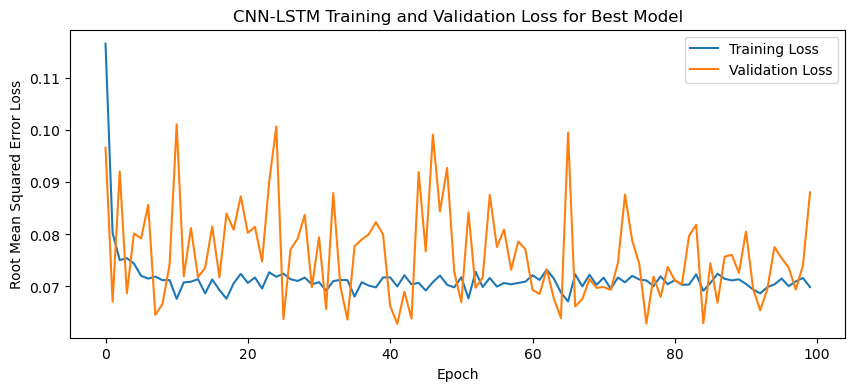

1/1 - 2s - loss: 0.0855 - 2s/epoch - 2s/step
Test Loss: 0.0854649767279625
1/1 [==============================] - 0s 32ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

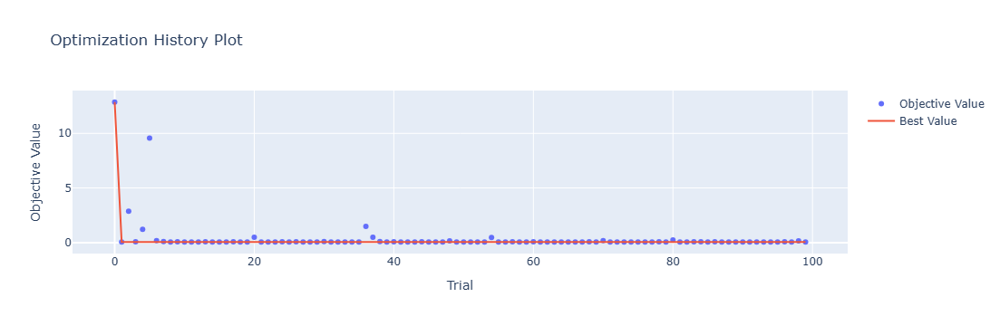

In [4]:
optuna.visualization.plot_optimization_history(study)

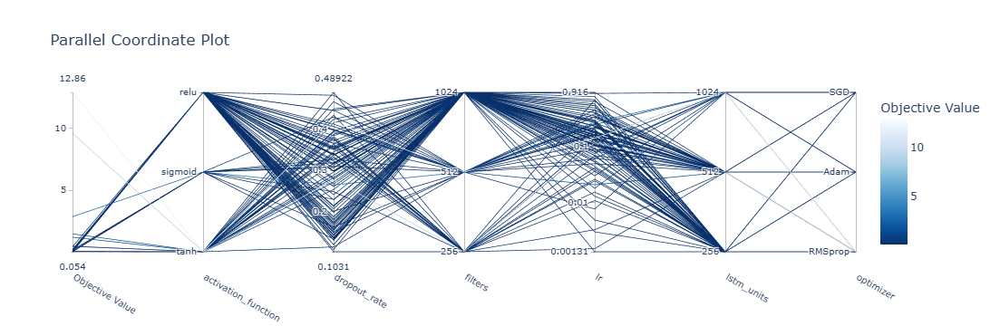

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

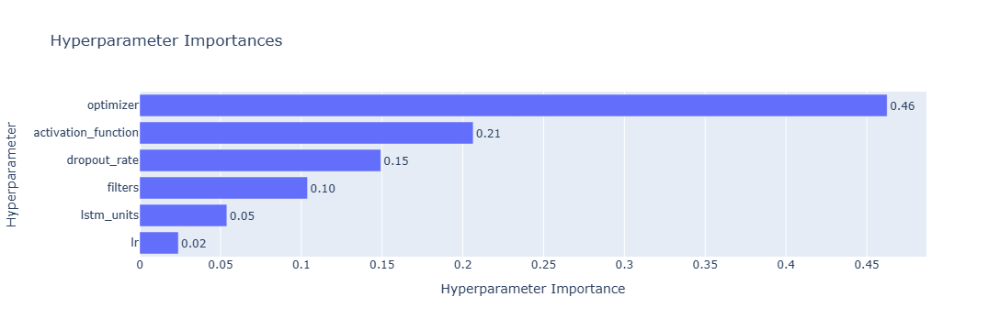

In [6]:
optuna.visualization.plot_param_importances(study)

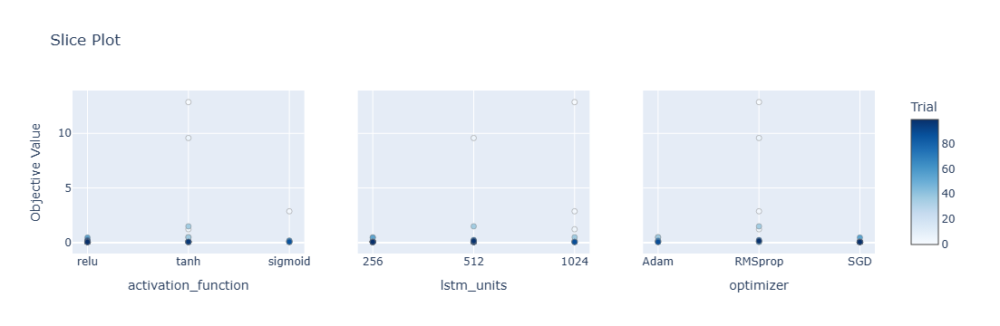

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

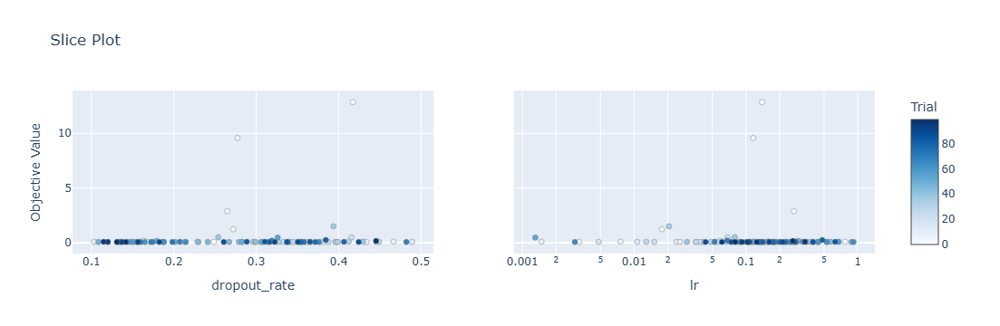

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 8s 41ms/step - loss: 0.1123 - accuracy: 0.5714 - mae: 0.0937 - rmse: 0.1123 - mape: 19.7856 - pearson: 0.7238 - val_loss: 0.0990 - val_accuracy: 0.6000 - val_mae: 0.0794 - val_rmse: 0.0990 - val_mape: 17.7893 - val_pearson: 0.6611
Epoch 2/100
84/84 [==============================] - 2s 26ms/step - loss: 0.0754 - accuracy: 0.6905 - mae: 0.0585 - rmse: 0.0754 - mape: 13.1248 - pearson: 0.7905 - val_loss: 0.0859 - val_accuracy: 0.6000 - val_mae: 0.0688 - val_rmse: 0.0859 - val_mape: 16.0384 - val_pearson: 0.7144
Epoch 3/100
84/84 [==============================] - 2s 23ms/step - loss: 0.0746 - accuracy: 0.7143 - mae: 0.0581 - rmse: 0.0746 - mape: 12.9476 - pearson: 0.7879 - val

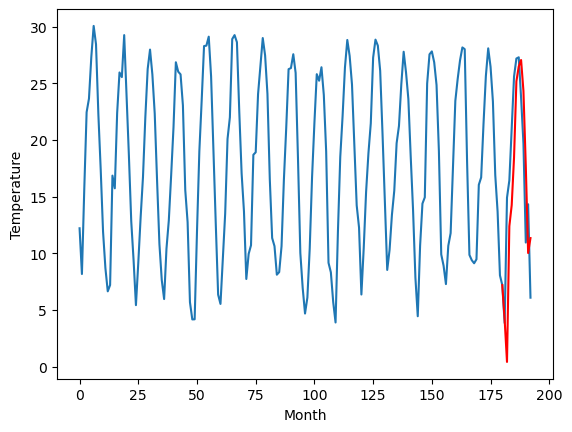

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		11.06		-1.81
12.78		7.33		-5.45
17.84		19.31		1.47
19.24		21.17		1.93
23.26		25.39		2.13
26.74		32.10		5.36
27.96		33.42		5.46
28.30		33.99		5.69
26.17		31.26		5.09
23.54		24.65		1.11
18.03		16.94		-1.09
17.79		18.26		0.47
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[13.23, 11.056783876419068, 7.326822481155396, 19.31311532020569, 21.167354664802552, 25.38673695087433, 32.102006516456605, 33.41782434940338, 33.99088051080704, 31.261052629947663, 24.64929296731949, 16.94464733362198, 18.261783740520478]


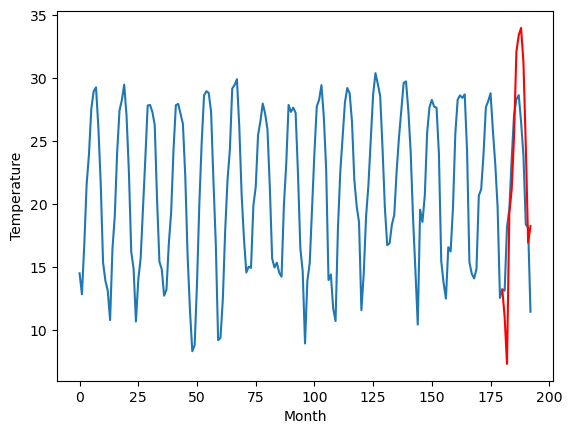

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		13.37		-1.97
16.20		9.64		-6.56
22.18		21.62		-0.56
23.82		23.48		-0.34
27.80		27.70		-0.10
31.94		34.41		2.47
33.70		35.73		2.03
33.98		36.30		2.32
30.41		33.57		3.16
26.53		26.96		0.43
18.17		19.25		1.08
20.35		20.57		0.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.18, 13.366783876419067, 9.636822481155395, 21.623115320205688, 23.47735466480255, 27.696736950874328, 34.4120065164566, 35.72782434940338, 36.30088051080703, 33.57105262994766, 26.959292967319485, 19.254647333621975, 20.571783740520473]


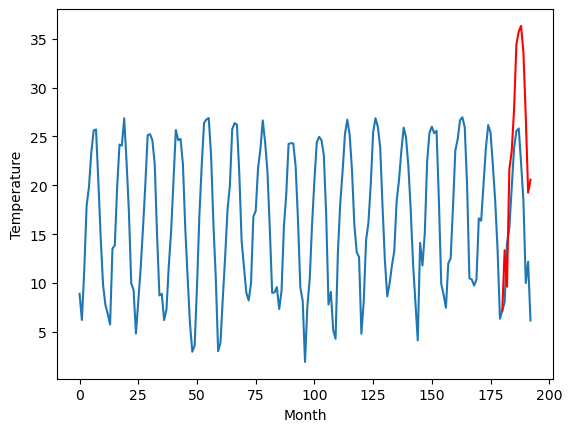

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		7.76		-1.24
7.43		4.03		-3.40
15.34		16.01		0.67
17.13		17.87		0.74
21.10		22.09		0.99
24.38		28.80		4.42
25.01		30.12		5.11
25.06		30.69		5.63
22.55		27.96		5.41
20.24		21.35		1.11
12.15		13.64		1.49
14.92		14.96		0.04
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.46, 7.7567838764190675, 4.026822481155396, 16.01311532020569, 17.86735466480255, 22.08673695087433, 28.802006516456604, 30.11782434940338, 30.690880510807037, 27.961052629947662, 21.34929296731949, 13.644647333621979, 14.961783740520477]


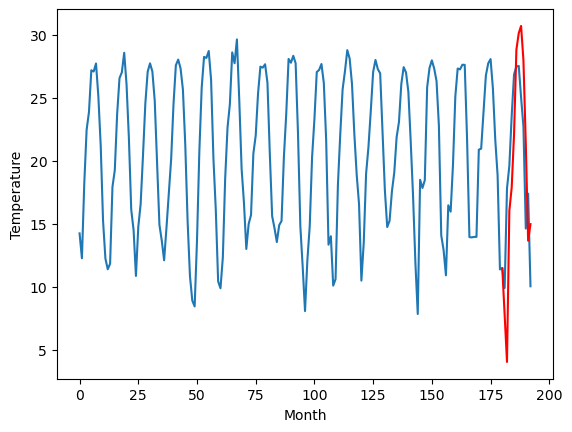

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.08		-0.27
10.26		9.35		-0.91
20.16		21.33		1.17
22.09		23.19		1.10
25.95		27.41		1.46
31.15		34.12		2.97
31.58		35.44		3.86
32.34		36.01		3.67
30.33		33.28		2.95
25.98		26.67		0.69
18.41		18.96		0.55
20.74		20.28		-0.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.27, 13.076783876419068, 9.346822481155396, 21.33311532020569, 23.18735466480255, 27.40673695087433, 34.12200651645661, 35.437824349403385, 36.01088051080704, 33.281052629947666, 26.669292967319493, 18.964647333621983, 20.28178374052048]


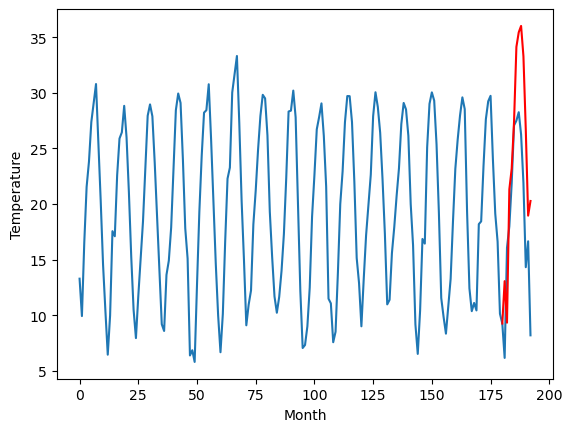

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		12.15		0.63
12.17		8.42		-3.75
17.07		20.40		3.33
20.44		22.26		1.82
23.95		26.48		2.53
28.52		33.19		4.67
30.51		34.51		4.00
30.99		35.08		4.09
27.98		32.35		4.37
24.38		25.74		1.36
16.21		18.03		1.82
17.26		19.35		2.09
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.77, 12.146783876419068, 8.416822481155396, 20.40311532020569, 22.257354664802552, 26.47673695087433, 33.1920065164566, 34.50782434940338, 35.080880510807035, 32.35105262994766, 25.739292967319486, 18.034647333621976, 19.351783740520474]


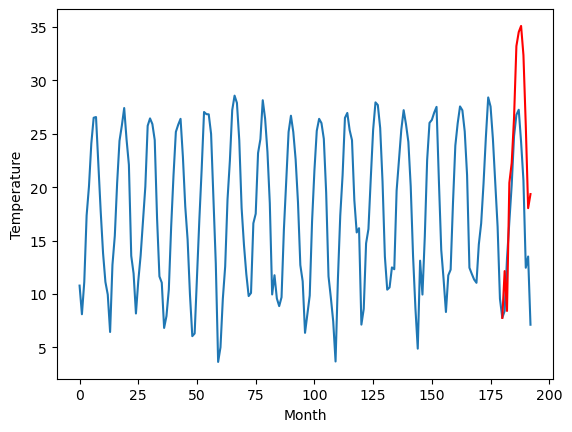

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		9.64		-0.57
10.85		5.91		-4.94
17.83		17.89		0.06
18.86		19.75		0.89
22.57		23.97		1.40
26.90		30.68		3.78
28.52		32.00		3.48
28.46		32.57		4.11
24.41		29.84		5.43
21.18		23.23		2.05
12.53		15.52		2.99
14.47		16.84		2.37
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 9.636783876419067, 5.906822481155395, 17.893115320205688, 19.74735466480255, 23.966736950874328, 30.682006516456603, 31.99782434940338, 32.57088051080704, 29.84105262994766, 23.229292967319488, 15.524647333621978, 16.841783740520476]


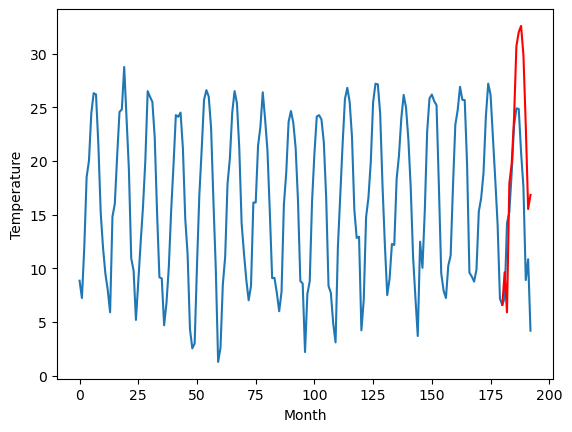

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		7.70		-0.21
8.53		3.97		-4.56
15.05		15.95		0.90
18.68		17.81		-0.87
21.70		22.03		0.33
26.49		28.74		2.25
28.61		30.06		1.45
28.56		30.63		2.07
24.05		27.90		3.85
20.20		21.29		1.09
10.70		13.58		2.88
12.76		14.90		2.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.3, 7.696783876419067, 3.966822481155395, 15.953115320205688, 17.807354664802553, 22.02673695087433, 28.742006516456605, 30.057824349403383, 30.63088051080704, 27.901052629947664, 21.28929296731949, 13.58464733362198, 14.901783740520479]


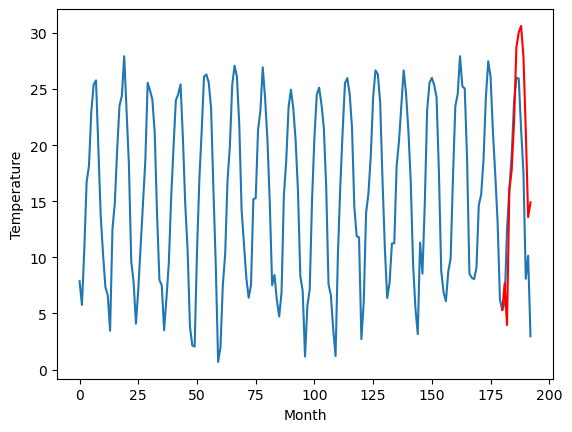

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		6.72		-0.36
2.81		2.99		0.18
15.28		14.97		-0.31
17.88		16.83		-1.05
22.57		21.05		-1.52
28.76		27.76		-1.00
29.33		29.08		-0.25
29.27		29.65		0.38
25.53		26.92		1.39
21.57		20.31		-1.26
11.53		12.60		1.07
13.33		13.92		0.59
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.1, 6.7167838764190675, 2.9868224811553956, 14.97311532020569, 16.827354664802552, 21.04673695087433, 27.762006516456605, 29.077824349403382, 29.65088051080704, 26.921052629947663, 20.30929296731949, 12.60464733362198, 13.921783740520478]


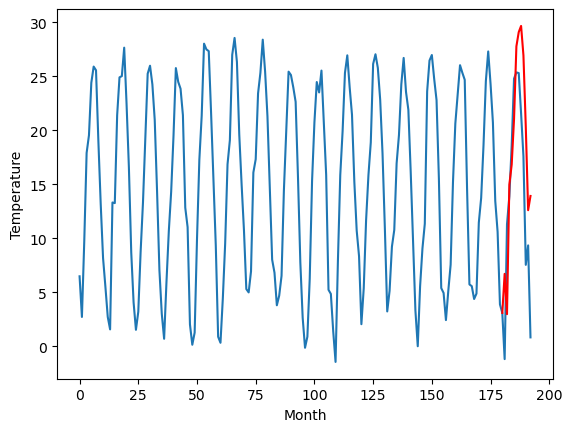

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		5.34		0.44
2.73		1.61		-1.12
13.48		13.59		0.11
16.54		15.45		-1.09
21.01		19.67		-1.34
27.49		26.38		-1.11
28.50		27.70		-0.80
29.10		28.27		-0.83
25.24		25.54		0.30
20.77		18.93		-1.84
10.11		11.22		1.11
11.34		12.54		1.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.6, 5.336783876419068, 1.6068224811553957, 13.593115320205689, 15.447354664802551, 19.66673695087433, 26.382006516456606, 27.697824349403383, 28.27088051080704, 25.541052629947664, 18.92929296731949, 11.22464733362198, 12.54178374052048]


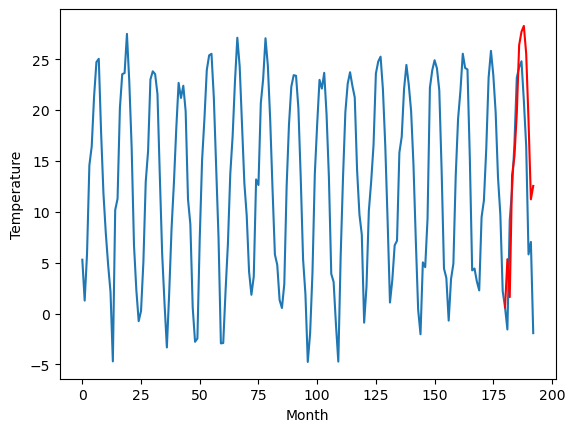

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		4.14		0.46
-0.63		0.41		1.04
11.10		12.39		1.29
15.07		14.25		-0.82
20.22		18.47		-1.75
27.53		25.18		-2.35
28.12		26.50		-1.62
28.83		27.07		-1.76
24.78		24.34		-0.44
20.43		17.73		-2.70
9.57		10.02		0.45
8.67		11.34		2.67
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.75, 4.136783876419067, 0.40682248115539554, 12.393115320205688, 14.24735466480255, 18.466736950874328, 25.182006516456603, 26.49782434940338, 27.070880510807037, 24.34105262994766, 17.729292967319488, 10.024647333621978, 11.341783740520476]


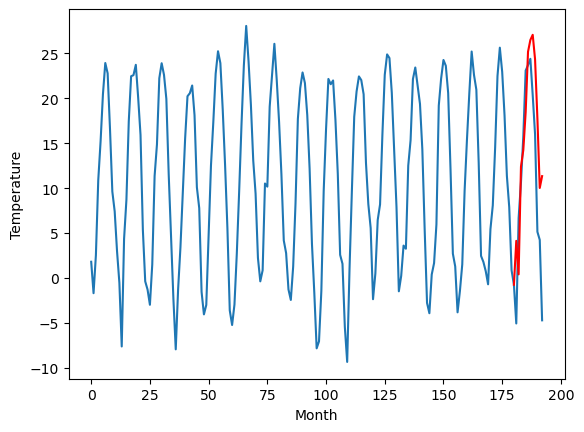

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   4.136784
1                 1   12.87  11.056784
2                 2   15.34  13.366784
3                 3    9.00   7.756784
4                 4   13.35  13.076784
5                 5   11.52  12.146784
6                 6   10.21   9.636784
7                 7    7.91   7.696784
8                 8    7.08   6.716784
9                 9    4.90   5.336784
10               10    3.68   4.136784


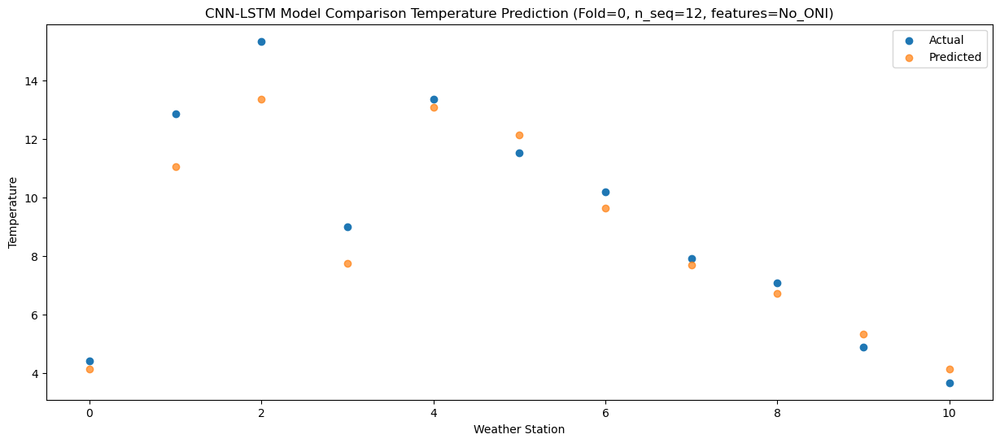

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   0.406822
1                 1   12.78   7.326822
2                 2   16.20   9.636822
3                 3    7.43   4.026822
4                 4   10.26   9.346822
5                 5   12.17   8.416822
6                 6   10.85   5.906822
7                 7    8.53   3.966822
8                 8    2.81   2.986822
9                 9    2.73   1.606822
10               10   -0.63   0.406822


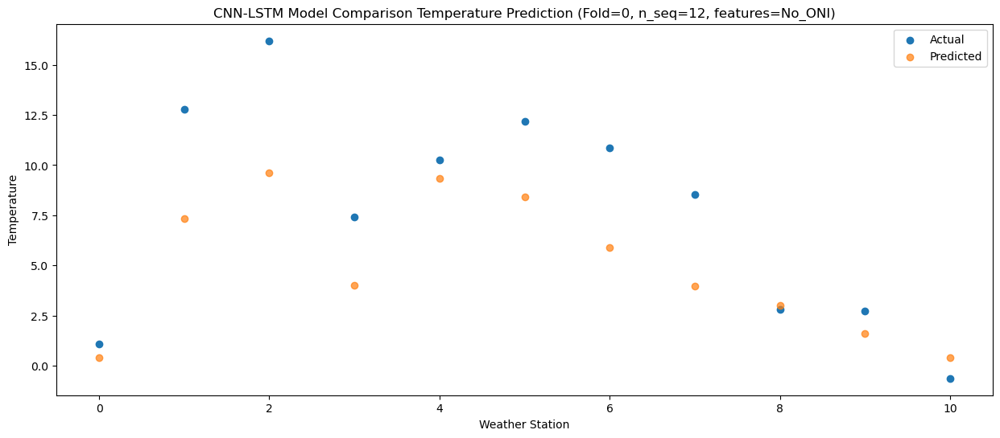

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  12.393115
1                 1   17.84  19.313115
2                 2   22.18  21.623115
3                 3   15.34  16.013115
4                 4   20.16  21.333115
5                 5   17.07  20.403115
6                 6   17.83  17.893115
7                 7   15.05  15.953115
8                 8   15.28  14.973115
9                 9   13.48  13.593115
10               10   11.10  12.393115


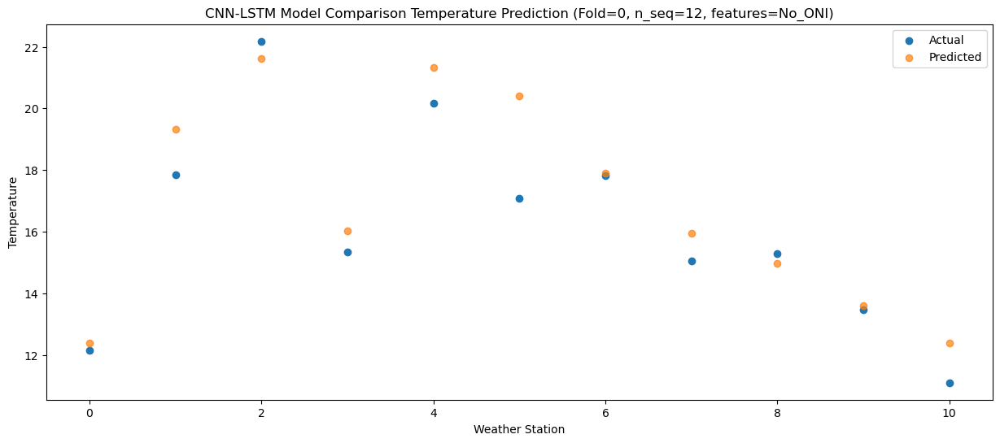

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  14.247355
1                 1   19.24  21.167355
2                 2   23.82  23.477355
3                 3   17.13  17.867355
4                 4   22.09  23.187355
5                 5   20.44  22.257355
6                 6   18.86  19.747355
7                 7   18.68  17.807355
8                 8   17.88  16.827355
9                 9   16.54  15.447355
10               10   15.07  14.247355


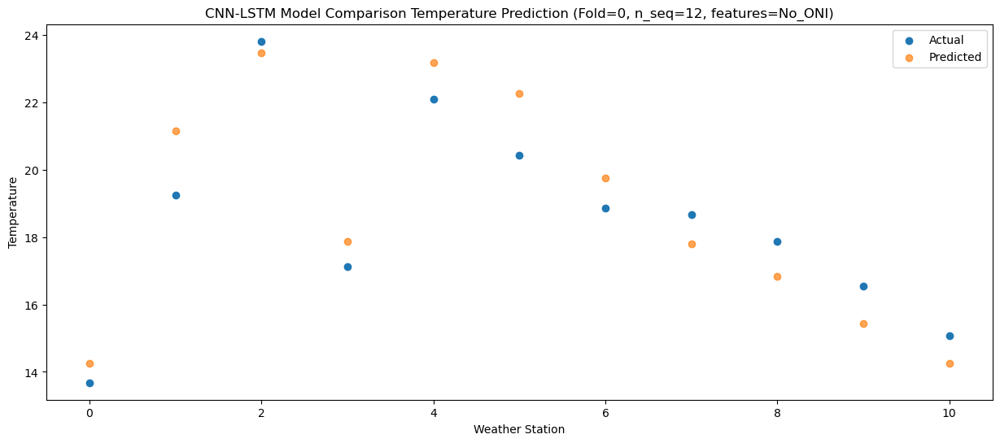

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18  18.466737
1                 1   23.26  25.386737
2                 2   27.80  27.696737
3                 3   21.10  22.086737
4                 4   25.95  27.406737
5                 5   23.95  26.476737
6                 6   22.57  23.966737
7                 7   21.70  22.026737
8                 8   22.57  21.046737
9                 9   21.01  19.666737
10               10   20.22  18.466737


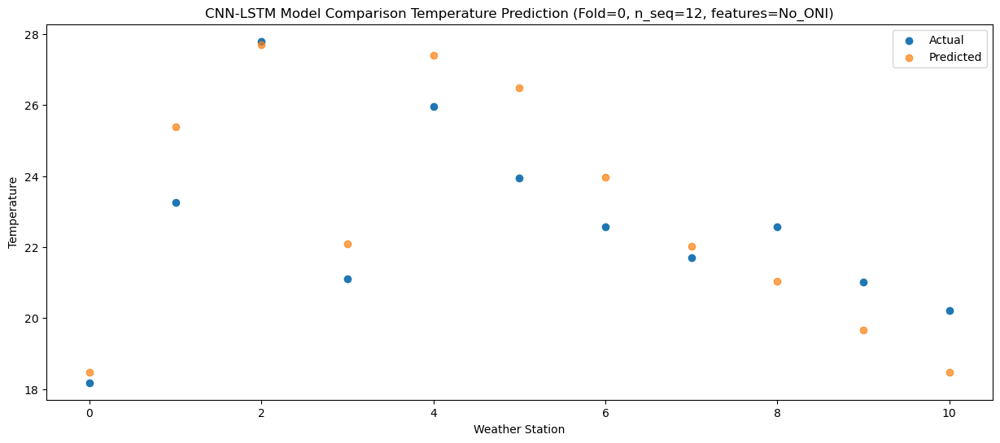

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  25.182007
1                 1   26.74  32.102007
2                 2   31.94  34.412007
3                 3   24.38  28.802007
4                 4   31.15  34.122007
5                 5   28.52  33.192007
6                 6   26.90  30.682007
7                 7   26.49  28.742007
8                 8   28.76  27.762007
9                 9   27.49  26.382007
10               10   27.53  25.182007


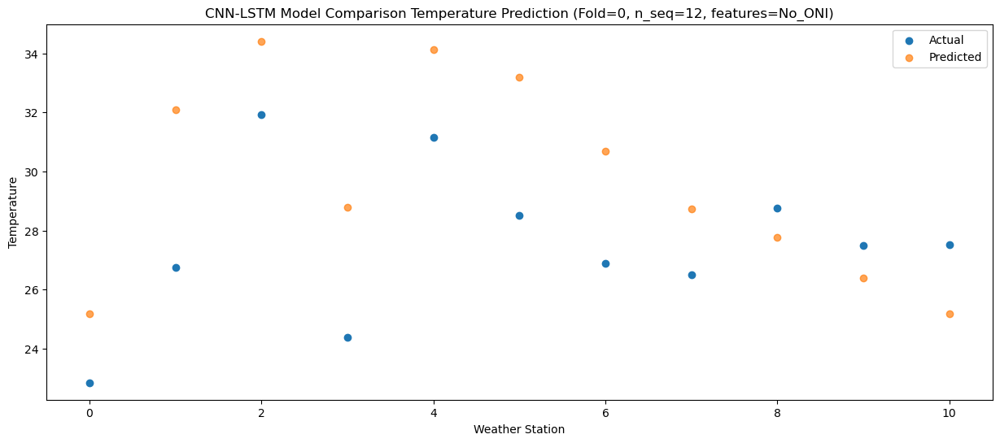

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.44  26.497824
1                 1   27.96  33.417824
2                 2   33.70  35.727824
3                 3   25.01  30.117824
4                 4   31.58  35.437824
5                 5   30.51  34.507824
6                 6   28.52  31.997824
7                 7   28.61  30.057824
8                 8   29.33  29.077824
9                 9   28.50  27.697824
10               10   28.12  26.497824


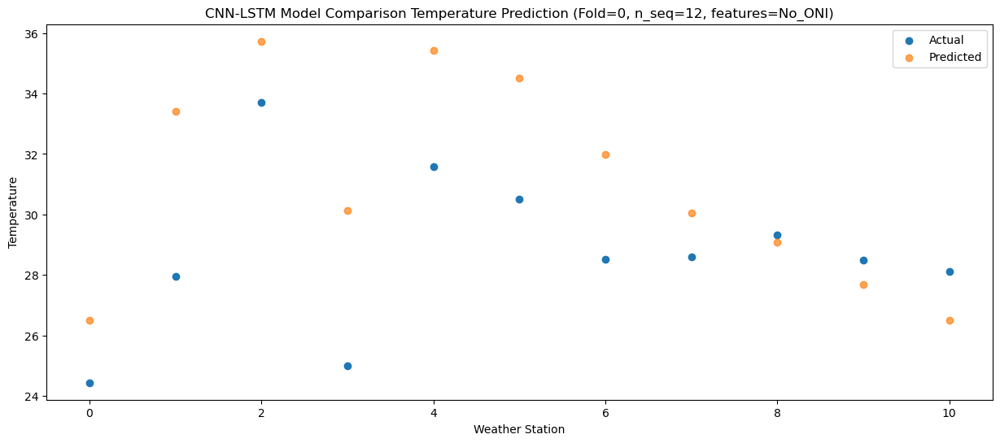

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.55  27.070881
1                 1   28.30  33.990881
2                 2   33.98  36.300881
3                 3   25.06  30.690881
4                 4   32.34  36.010881
5                 5   30.99  35.080881
6                 6   28.46  32.570881
7                 7   28.56  30.630881
8                 8   29.27  29.650881
9                 9   29.10  28.270881
10               10   28.83  27.070881


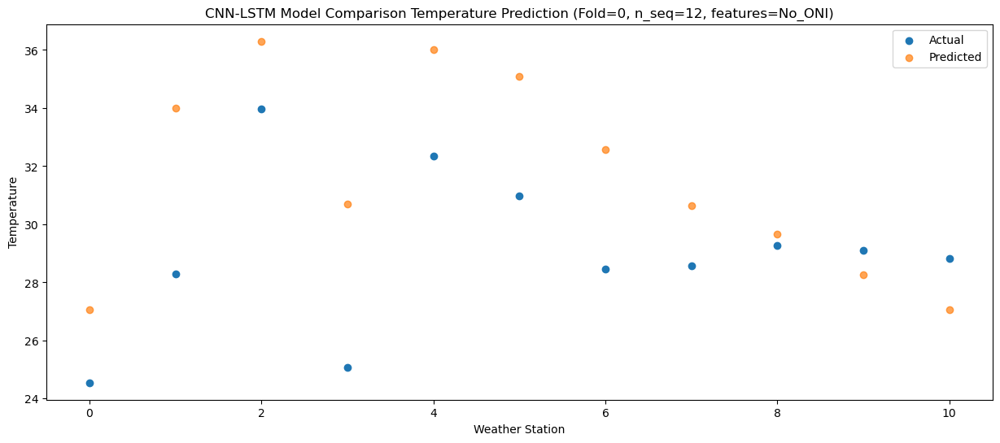

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   20.97  24.341053
1                 1   26.17  31.261053
2                 2   30.41  33.571053
3                 3   22.55  27.961053
4                 4   30.33  33.281053
5                 5   27.98  32.351053
6                 6   24.41  29.841053
7                 7   24.05  27.901053
8                 8   25.53  26.921053
9                 9   25.24  25.541053
10               10   24.78  24.341053


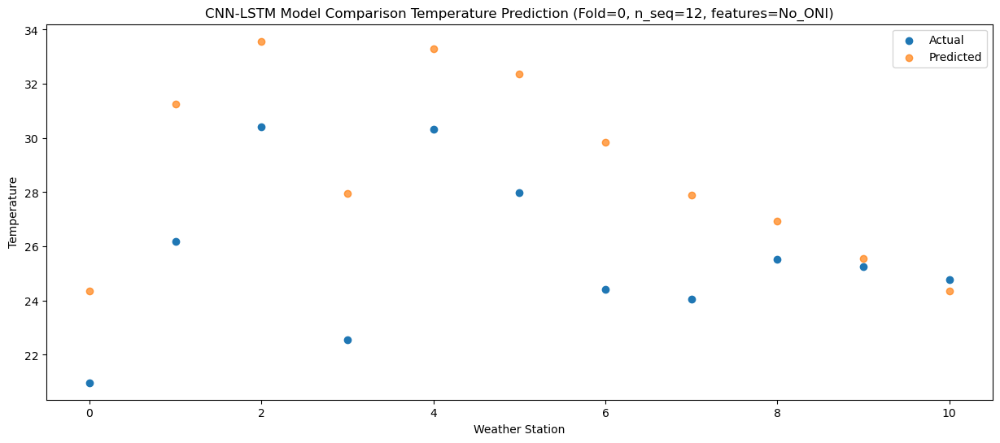

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.95  17.729293
1                 1   23.54  24.649293
2                 2   26.53  26.959293
3                 3   20.24  21.349293
4                 4   25.98  26.669293
5                 5   24.38  25.739293
6                 6   21.18  23.229293
7                 7   20.20  21.289293
8                 8   21.57  20.309293
9                 9   20.77  18.929293
10               10   20.43  17.729293


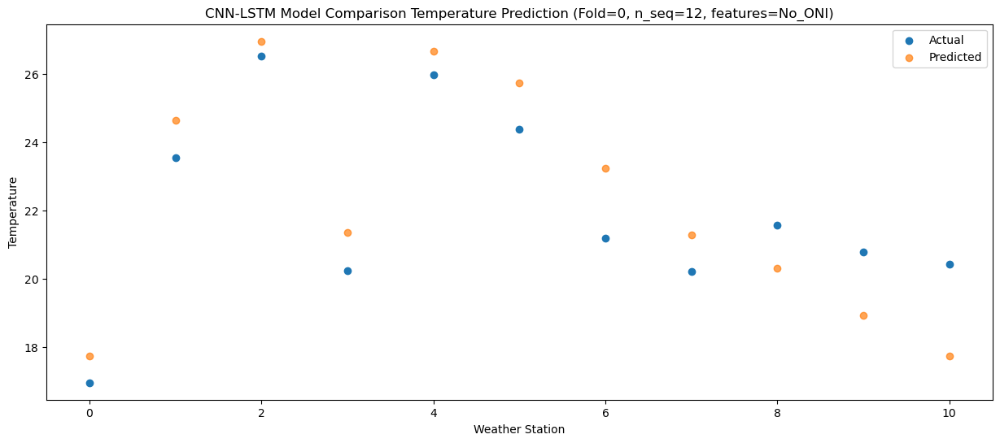

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    8.19  10.024647
1                 1   18.03  16.944647
2                 2   18.17  19.254647
3                 3   12.15  13.644647
4                 4   18.41  18.964647
5                 5   16.21  18.034647
6                 6   12.53  15.524647
7                 7   10.70  13.584647
8                 8   11.53  12.604647
9                 9   10.11  11.224647
10               10    9.57  10.024647


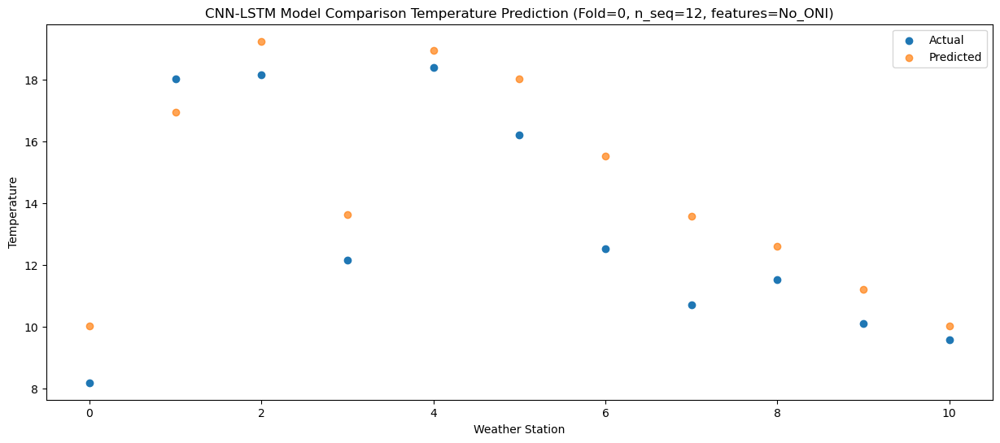

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   11.57  11.341784
1                 1   17.79  18.261784
2                 2   20.35  20.571784
3                 3   14.92  14.961784
4                 4   20.74  20.281784
5                 5   17.26  19.351784
6                 6   14.47  16.841784
7                 7   12.76  14.901784
8                 8   13.33  13.921784
9                 9   11.34  12.541784
10               10    8.67  11.341784


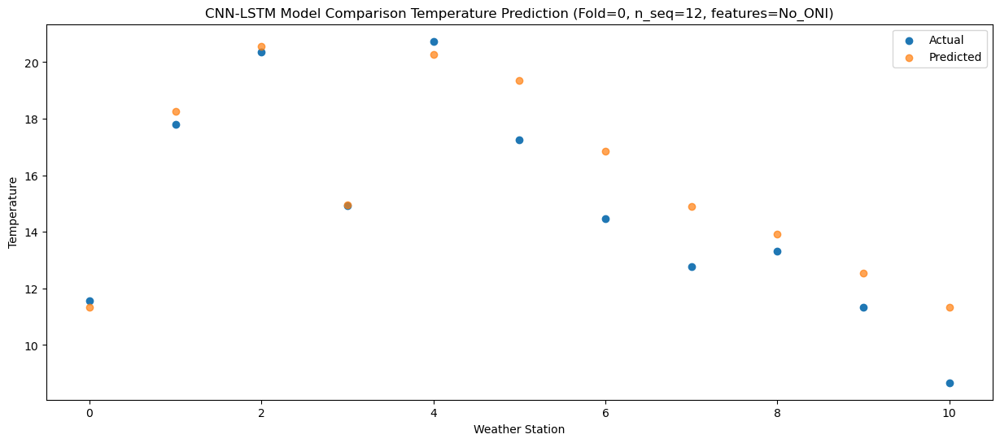

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]
 [24.44 27.96 33.7  25.01 31.58 30.51 28.52 28.61 29.33 28.5  28.12]
 [24.55 28.3  33.98 25.06 32.34 30.99 28.46 28.56 29.27 29.1  28.83]
 [20.97 26.17 30.41 22.55 30.33 27.98 24.41 24.05 25.53 25.24 24.78]
 [16.95 23.54 26.53 20.24 25.98 24.38 21.18 20.2  21.57 20.77 20.43]
 [ 8.19 18.03 18.17 12.15 18.41 16.21 12.53 10.7  11.53 10.11  9.57]
 [11.57 17.79 20.35 14.92 20.74 17.26 14.47 12.76 13.33 11.34  8.67]]
[[ 4.13678388 11.05678388 13.36678388  7.75678388 13.07678388 12.14678388
   9.63678388  7.69678388  6.71678388  5.33678388  4.13678388]
 [ 0.40682248  7.32682248  9

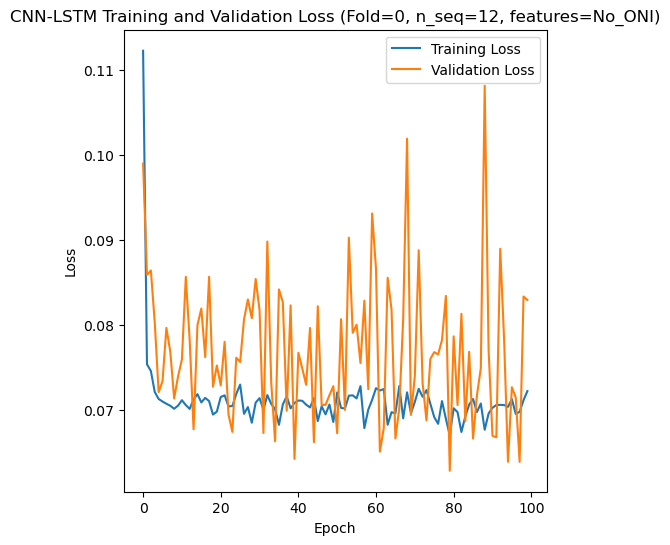

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 45s 314ms/step - loss: 0.1163 - accuracy: 0.5595 - mae: 0.0954 - rmse: 0.1163 - mape: 19.8860 - pearson: 0.6901 - val_loss: 0.0672 - val_accuracy: 0.8000 - val_mae: 0.0526 - val_rmse: 0.0672 - val_mape: 11.9816 - val_pearson: 0.8304
Epoch 2/100
84/84 [==============================] - 19s 228ms/step - loss: 0.0794 - accuracy: 0.6786 - mae: 0.0631 - rmse: 0.0794 - mape: 14.0067 - pearson: 0.7757 - val_loss: 0.0735 - val_accuracy: 0.8000 - val_mae: 0.0604 - val_rmse: 0.0735 - val_mape: 12.9828 - val_pearson: 0.8165
Epoch 3/100
84/84 [==============================] - 20s 237ms/step - loss: 0.0745 - accuracy: 0.6667 - mae: 0.0583 - rmse: 0.0745 - mape: 12.9432 - pearson: 0.7957

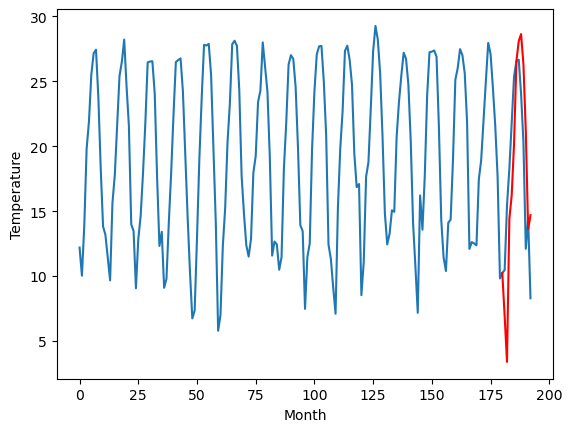

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		11.17		-0.83
12.66		7.63		-5.03
19.43		18.63		-0.80
21.57		20.46		-1.11
25.30		24.41		-0.89
29.44		30.79		1.35
30.82		32.33		1.51
31.09		32.87		1.78
27.35		30.54		3.19
23.57		25.42		1.85
15.91		17.85		1.94
17.54		18.93		1.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.41, 11.169599723815917, 7.632124853134155, 18.6303777217865, 20.461918425559997, 24.410564732551574, 30.785014462471008, 32.330446434021, 32.87465364933014, 30.536863398551944, 25.419160914421084, 17.853439879417422, 18.92819781303406]


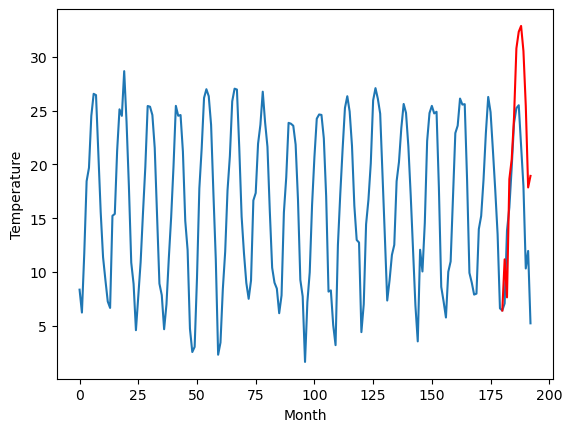

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		7.32		-1.45
9.26		3.78		-5.48
16.32		14.78		-1.54
17.72		16.61		-1.11
21.84		20.56		-1.28
25.72		26.94		1.22
26.49		28.48		1.99
27.15		29.02		1.87
24.13		26.69		2.56
20.35		21.57		1.22
12.61		14.00		1.39
15.21		15.08		-0.13
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.6, 7.319599723815918, 3.782124853134155, 14.780377721786499, 16.61191842556, 20.560564732551576, 26.93501446247101, 28.480446434020998, 29.02465364933014, 26.686863398551942, 21.569160914421083, 14.00343987941742, 15.078197813034059]


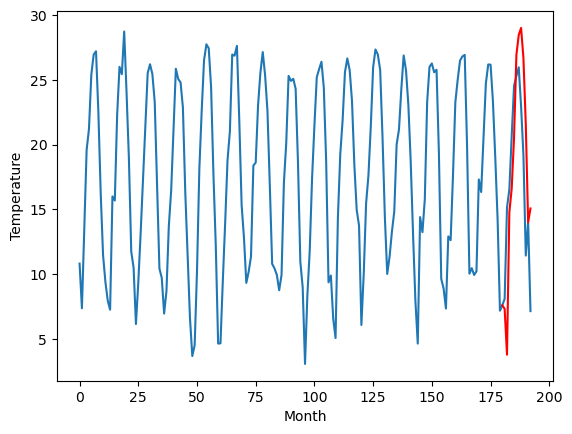

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		9.79		-0.93
9.13		6.25		-2.88
16.50		17.25		0.75
18.84		19.08		0.24
22.73		23.03		0.30
26.62		29.41		2.79
26.50		30.95		4.45
27.47		31.49		4.02
24.46		29.16		4.70
21.77		24.04		2.27
14.61		16.47		1.86
17.98		17.55		-0.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.89, 9.789599723815918, 6.252124853134156, 17.2503777217865, 19.081918425559998, 23.030564732551575, 29.40501446247101, 30.950446434020996, 31.49465364933014, 29.15686339855194, 24.039160914421082, 16.47343987941742, 17.548197813034058]


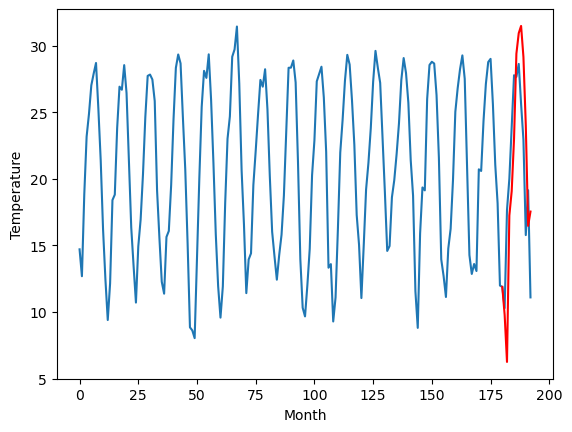

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		13.68		-1.02
13.00		10.14		-2.86
20.61		21.14		0.53
22.91		22.97		0.06
27.03		26.92		-0.11
30.50		33.30		2.80
30.59		34.84		4.25
31.56		35.38		3.82
27.98		33.05		5.07
24.94		27.93		2.99
17.39		20.36		2.97
21.27		21.44		0.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.96, 13.679599723815919, 10.142124853134156, 21.1403777217865, 22.97191842556, 26.920564732551576, 33.29501446247101, 34.840446434021, 35.38465364933014, 33.04686339855194, 27.929160914421082, 20.36343987941742, 21.43819781303406]


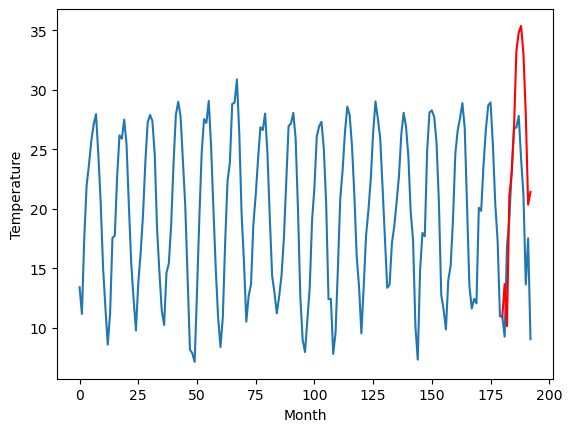

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		12.39		0.48
12.29		8.85		-3.44
19.63		19.85		0.22
21.90		21.68		-0.22
27.49		25.63		-1.86
31.76		32.01		0.25
31.10		33.55		2.45
30.51		34.09		3.58
30.15		31.76		1.61
25.83		26.64		0.81
19.36		19.07		-0.29
19.62		20.15		0.53
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 12.389599723815918, 8.852124853134155, 19.8503777217865, 21.68191842556, 25.630564732551576, 32.00501446247101, 33.550446434021, 34.09465364933014, 31.756863398551943, 26.639160914421083, 19.07343987941742, 20.14819781303406]


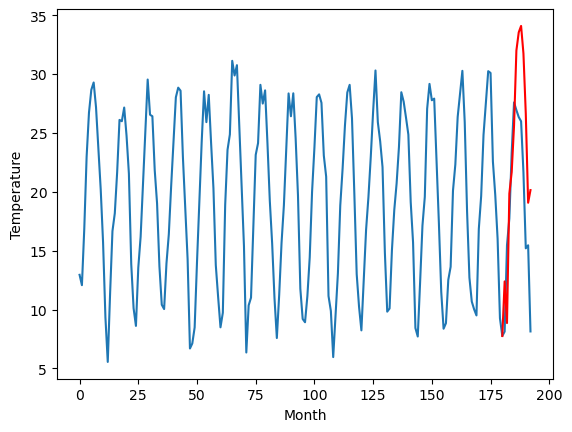

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		11.92		-0.83
13.53		8.38		-5.15
19.81		19.38		-0.43
22.38		21.21		-1.17
26.15		25.16		-0.99
30.16		31.54		1.38
31.52		33.08		1.56
31.78		33.62		1.84
28.45		31.29		2.84
24.50		26.17		1.67
16.90		18.60		1.70
18.42		19.68		1.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.17, 11.919599723815917, 8.382124853134155, 19.3803777217865, 21.211918425559997, 25.160564732551574, 31.535014462471008, 33.080446434021, 33.62465364933014, 31.286863398551944, 26.169160914421084, 18.603439879417422, 19.67819781303406]


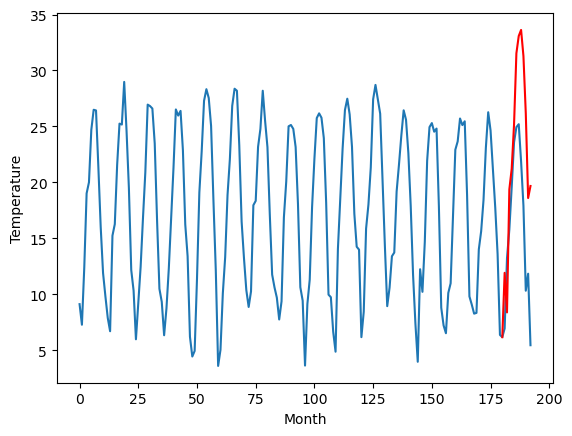

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		8.09		-0.72
5.81		4.55		-1.26
17.13		15.55		-1.58
18.84		17.38		-1.46
23.50		21.33		-2.17
29.58		27.71		-1.87
30.57		29.25		-1.32
31.79		29.79		-2.00
28.08		27.46		-0.62
22.88		22.34		-0.54
13.58		14.77		1.19
15.99		15.85		-0.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.57, 8.089599723815917, 4.5521248531341545, 15.550377721786498, 17.381918425559995, 21.330564732551572, 27.705014462471006, 29.250446434020994, 29.794653649330137, 27.45686339855194, 22.33916091442108, 14.773439879417417, 15.848197813034055]


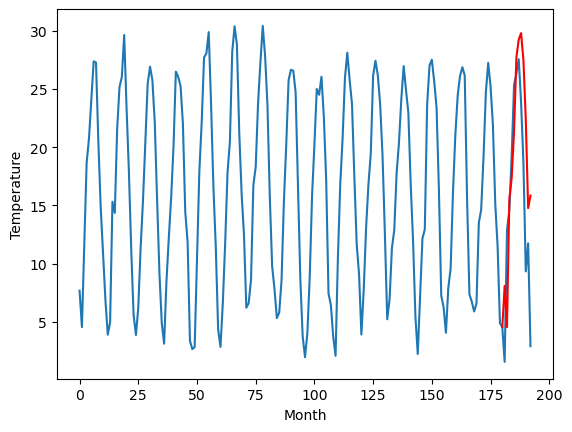

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		6.66		-0.68
2.56		3.12		0.56
15.12		14.12		-1.00
16.92		15.95		-0.97
21.73		19.90		-1.83
27.76		26.28		-1.48
29.27		27.82		-1.45
29.66		28.36		-1.30
27.15		26.03		-1.12
20.90		20.91		0.01
13.15		13.34		0.19
12.34		14.42		2.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.46, 6.659599723815918, 3.1221248531341557, 14.1203777217865, 15.951918425559999, 19.900564732551576, 26.27501446247101, 27.820446434020997, 28.36465364933014, 26.026863398551942, 20.909160914421083, 13.34343987941742, 14.418197813034059]


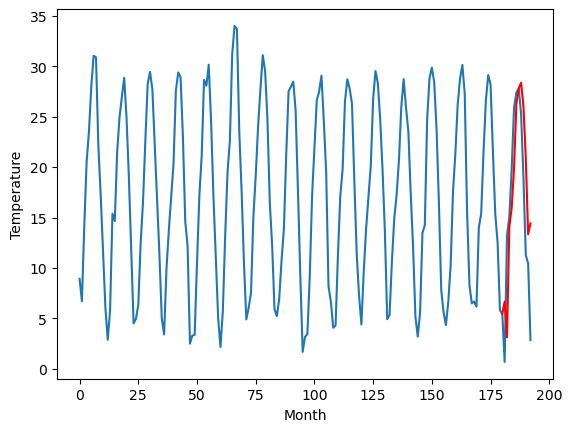

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		7.90		-1.14
4.67		4.36		-0.31
15.38		15.36		-0.02
19.14		17.19		-1.95
23.69		21.14		-2.55
30.80		27.52		-3.28
31.47		29.06		-2.41
31.32		29.60		-1.72
29.37		27.27		-2.10
21.93		22.15		0.22
15.68		14.58		-1.10
14.07		15.66		1.59
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.42, 7.899599723815918, 4.362124853134155, 15.360377721786499, 17.191918425559997, 21.140564732551574, 27.515014462471008, 29.060446434020996, 29.60465364933014, 27.26686339855194, 22.14916091442108, 14.58343987941742, 15.658197813034057]


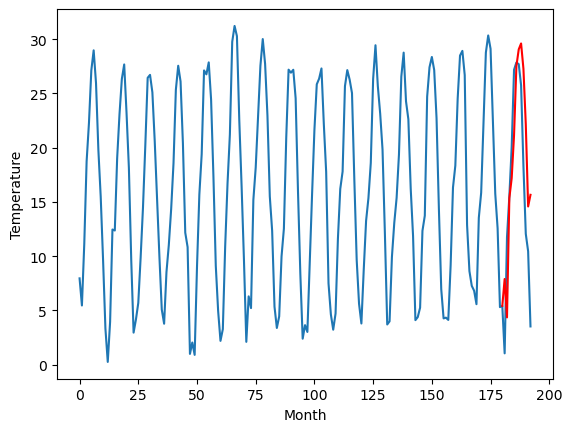

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		6.93		0.81
5.16		3.39		-1.77
12.38		14.39		2.01
17.03		16.22		-0.81
21.57		20.17		-1.40
27.66		26.55		-1.11
29.89		28.09		-1.80
29.67		28.63		-1.04
25.97		26.30		0.33
21.55		21.18		-0.37
12.23		13.61		1.38
11.46		14.69		3.23
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.17, 6.929599723815918, 3.3921248531341552, 14.3903777217865, 16.22191842556, 20.170564732551576, 26.54501446247101, 28.090446434020997, 28.63465364933014, 26.29686339855194, 21.179160914421082, 13.61343987941742, 14.688197813034058]


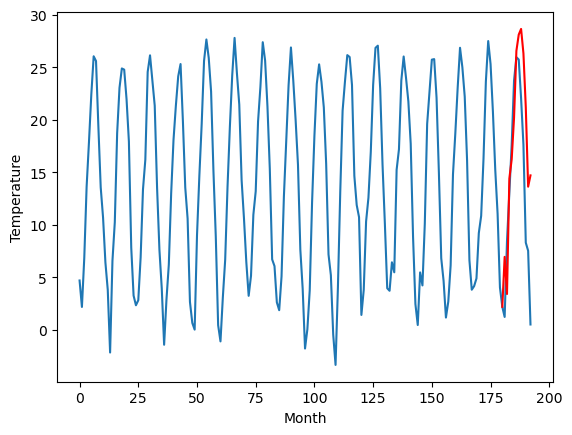

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38     6.9296
1                 1   12.00    11.1696
2                 2    8.77     7.3196
3                 3   10.72     9.7896
4                 4   14.70    13.6796
5                 5   11.91    12.3896
6                 6   12.75    11.9196
7                 7    8.81     8.0896
8                 8    7.34     6.6596
9                 9    9.04     7.8996
10               10    6.12     6.9296


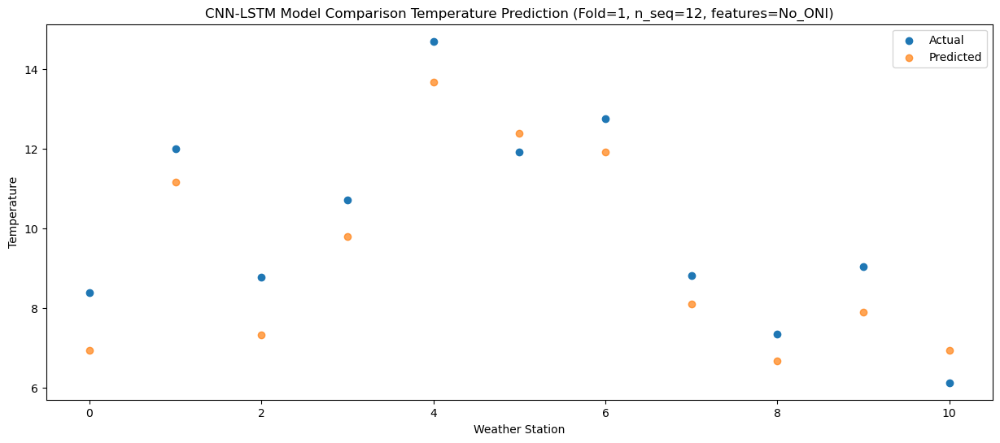

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60   3.392125
1                 1   12.66   7.632125
2                 2    9.26   3.782125
3                 3    9.13   6.252125
4                 4   13.00  10.142125
5                 5   12.29   8.852125
6                 6   13.53   8.382125
7                 7    5.81   4.552125
8                 8    2.56   3.122125
9                 9    4.67   4.362125
10               10    5.16   3.392125


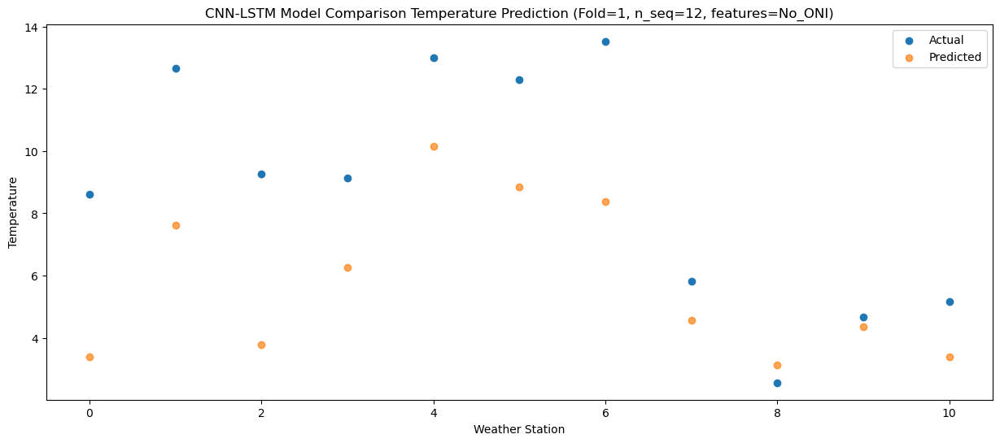

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  14.390378
1                 1   19.43  18.630378
2                 2   16.32  14.780378
3                 3   16.50  17.250378
4                 4   20.61  21.140378
5                 5   19.63  19.850378
6                 6   19.81  19.380378
7                 7   17.13  15.550378
8                 8   15.12  14.120378
9                 9   15.38  15.360378
10               10   12.38  14.390378


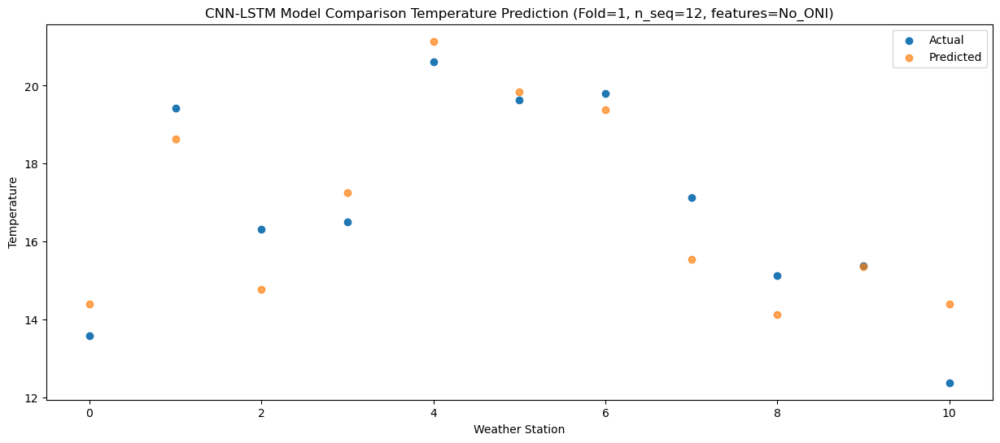

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  16.221918
1                 1   21.57  20.461918
2                 2   17.72  16.611918
3                 3   18.84  19.081918
4                 4   22.91  22.971918
5                 5   21.90  21.681918
6                 6   22.38  21.211918
7                 7   18.84  17.381918
8                 8   16.92  15.951918
9                 9   19.14  17.191918
10               10   17.03  16.221918


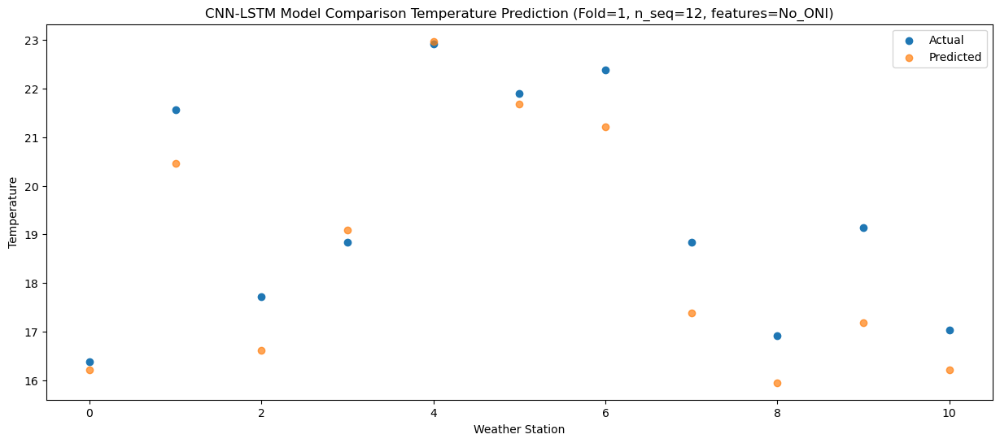

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  20.170565
1                 1   25.30  24.410565
2                 2   21.84  20.560565
3                 3   22.73  23.030565
4                 4   27.03  26.920565
5                 5   27.49  25.630565
6                 6   26.15  25.160565
7                 7   23.50  21.330565
8                 8   21.73  19.900565
9                 9   23.69  21.140565
10               10   21.57  20.170565


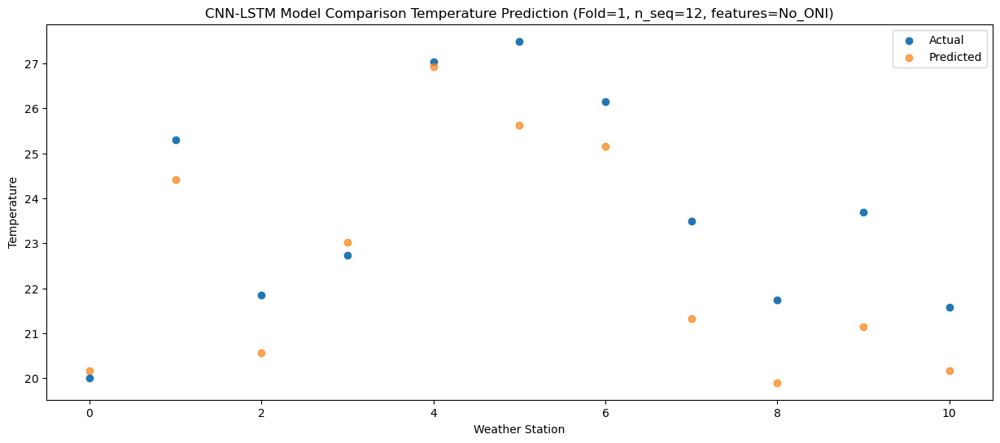

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  26.545014
1                 1   29.44  30.785014
2                 2   25.72  26.935014
3                 3   26.62  29.405014
4                 4   30.50  33.295014
5                 5   31.76  32.005014
6                 6   30.16  31.535014
7                 7   29.58  27.705014
8                 8   27.76  26.275014
9                 9   30.80  27.515014
10               10   27.66  26.545014


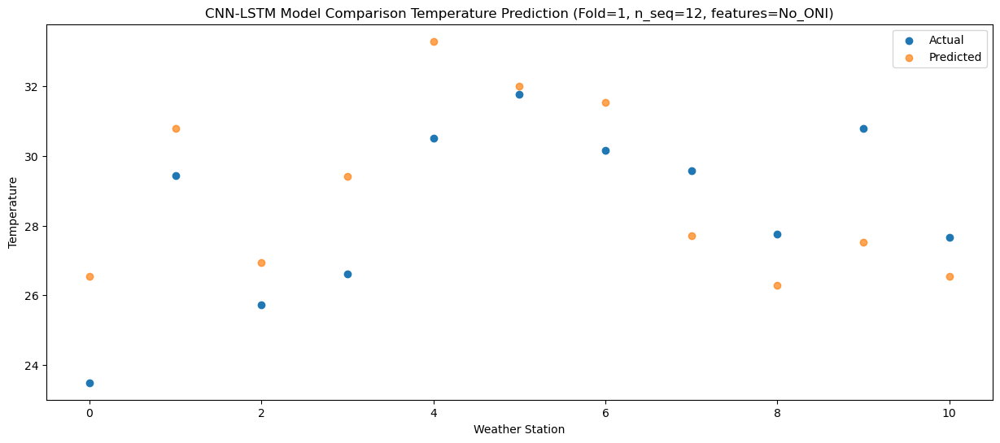

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.69  28.090446
1                 1   30.82  32.330446
2                 2   26.49  28.480446
3                 3   26.50  30.950446
4                 4   30.59  34.840446
5                 5   31.10  33.550446
6                 6   31.52  33.080446
7                 7   30.57  29.250446
8                 8   29.27  27.820446
9                 9   31.47  29.060446
10               10   29.89  28.090446


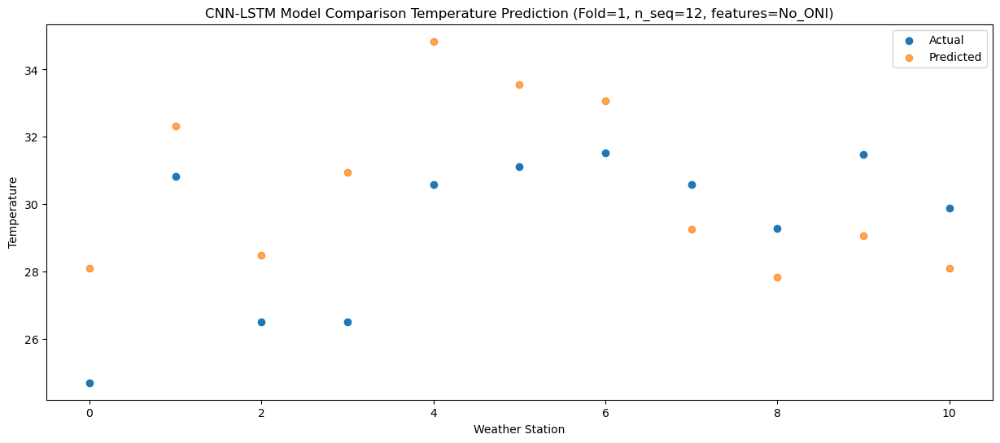

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.80  28.634654
1                 1   31.09  32.874654
2                 2   27.15  29.024654
3                 3   27.47  31.494654
4                 4   31.56  35.384654
5                 5   30.51  34.094654
6                 6   31.78  33.624654
7                 7   31.79  29.794654
8                 8   29.66  28.364654
9                 9   31.32  29.604654
10               10   29.67  28.634654


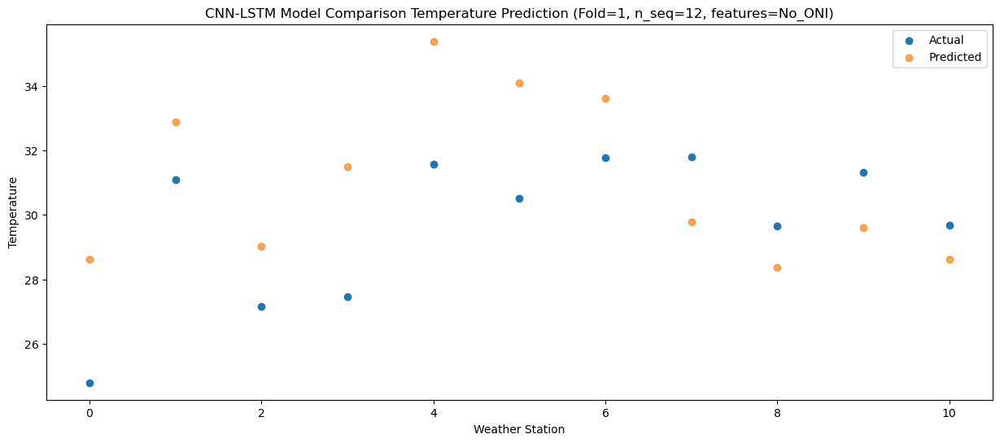

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   22.15  26.296863
1                 1   27.35  30.536863
2                 2   24.13  26.686863
3                 3   24.46  29.156863
4                 4   27.98  33.046863
5                 5   30.15  31.756863
6                 6   28.45  31.286863
7                 7   28.08  27.456863
8                 8   27.15  26.026863
9                 9   29.37  27.266863
10               10   25.97  26.296863


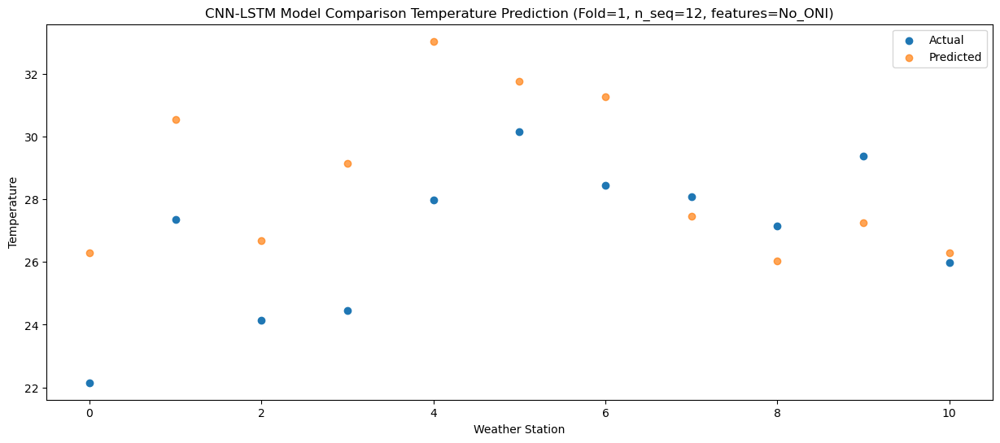

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   18.45  21.179161
1                 1   23.57  25.419161
2                 2   20.35  21.569161
3                 3   21.77  24.039161
4                 4   24.94  27.929161
5                 5   25.83  26.639161
6                 6   24.50  26.169161
7                 7   22.88  22.339161
8                 8   20.90  20.909161
9                 9   21.93  22.149161
10               10   21.55  21.179161


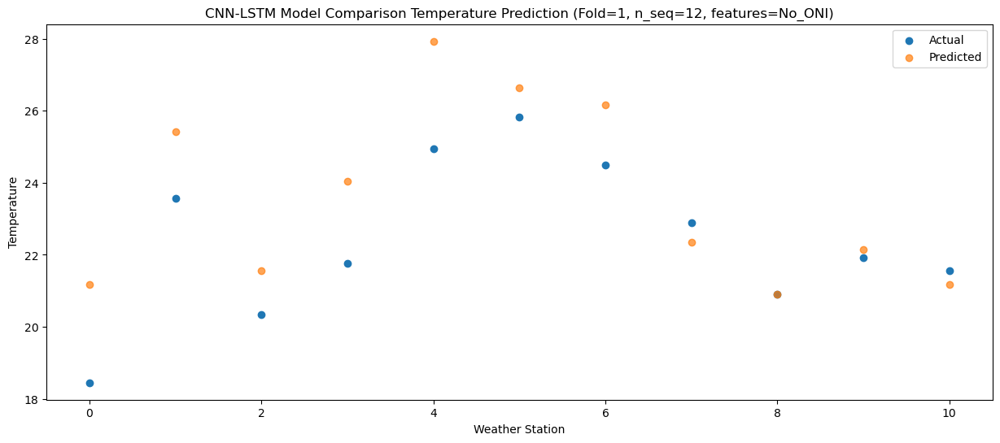

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   10.24   13.61344
1                 1   15.91   17.85344
2                 2   12.61   14.00344
3                 3   14.61   16.47344
4                 4   17.39   20.36344
5                 5   19.36   19.07344
6                 6   16.90   18.60344
7                 7   13.58   14.77344
8                 8   13.15   13.34344
9                 9   15.68   14.58344
10               10   12.23   13.61344


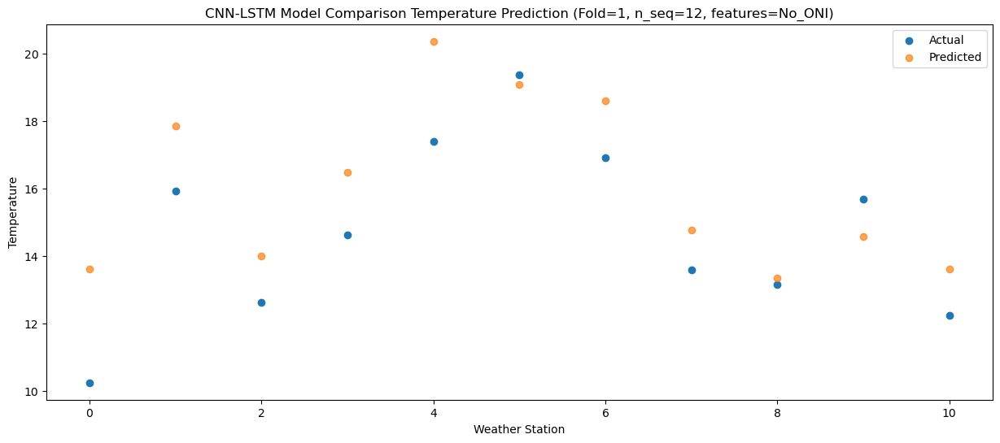

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   12.59  14.688198
1                 1   17.54  18.928198
2                 2   15.21  15.078198
3                 3   17.98  17.548198
4                 4   21.27  21.438198
5                 5   19.62  20.148198
6                 6   18.42  19.678198
7                 7   15.99  15.848198
8                 8   12.34  14.418198
9                 9   14.07  15.658198
10               10   11.46  14.688198


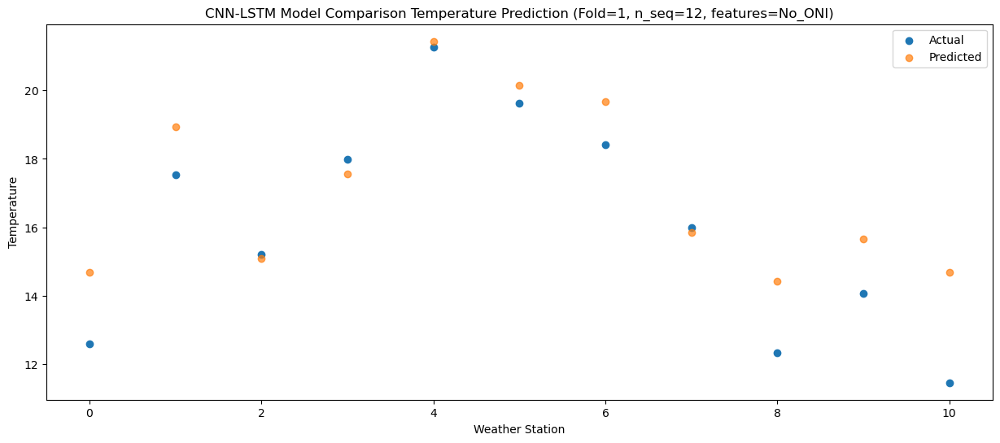

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]
 [24.69 30.82 26.49 26.5  30.59 31.1  31.52 30.57 29.27 31.47 29.89]
 [24.8  31.09 27.15 27.47 31.56 30.51 31.78 31.79 29.66 31.32 29.67]
 [22.15 27.35 24.13 24.46 27.98 30.15 28.45 28.08 27.15 29.37 25.97]
 [18.45 23.57 20.35 21.77 24.94 25.83 24.5  22.88 20.9  21.93 21.55]
 [10.24 15.91 12.61 14.61 17.39 19.36 16.9  13.58 13.15 15.68 12.23]
 [12.59 17.54 15.21 17.98 21.27 19.62 18.42 15.99 12.34 14.07 11.46]]
[[ 6.92959972 11.16959972  7.31959972  9.78959972 13.67959972 12.38959972
  11.91959972  8.08959972  6.65959972  7.89959972  6.92959972]
 [ 3.39212485  7.63212485  3

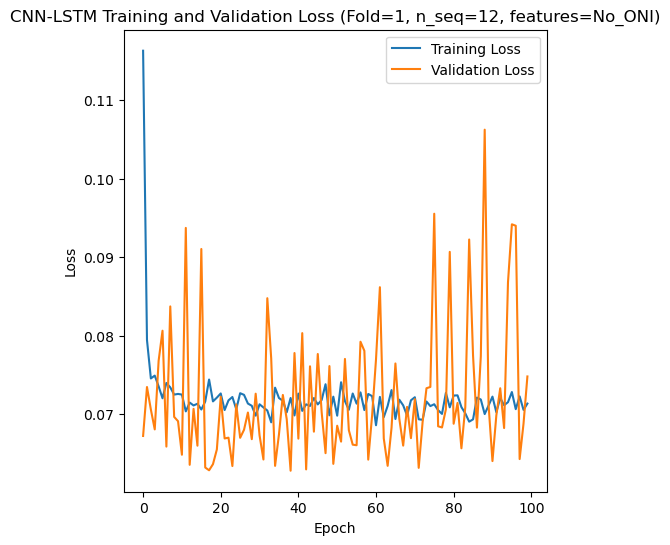

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 40s 251ms/step - loss: 0.1081 - accuracy: 0.6429 - mae: 0.0903 - rmse: 0.1081 - mape: 19.5181 - pearson: 0.7321 - val_loss: 0.0709 - val_accuracy: 0.9000 - val_mae: 0.0552 - val_rmse: 0.0709 - val_mape: 13.9506 - val_pearson: 0.9187
Epoch 2/100
84/84 [==============================] - 18s 213ms/step - loss: 0.0774 - accuracy: 0.6786 - mae: 0.0610 - rmse: 0.0774 - mape: 13.5709 - pearson: 0.7918 - val_loss: 0.0559 - val_accuracy: 0.9000 - val_mae: 0.0410 - val_rmse: 0.0559 - val_mape: 9.0047 - val_pearson: 0.9099
Epoch 3/100
84/84 [==============================] - 19s 226ms/step - loss: 0.0749 - accuracy: 0.7024 - mae: 0.0582 - rmse: 0.0749 - mape: 13.1627 - pearson: 0.7958 

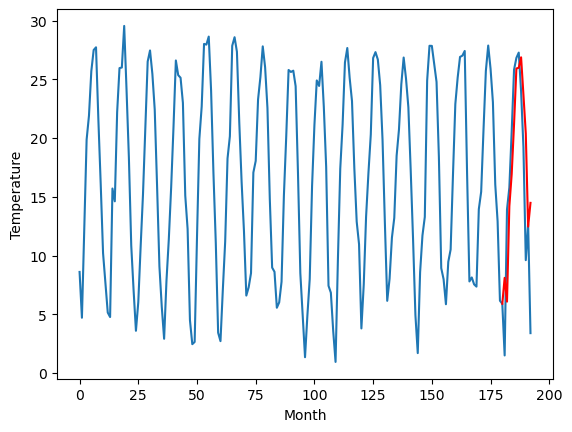

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		8.15		-0.38
4.49		6.12		1.63
14.68		14.24		-0.44
18.44		16.98		-1.46
23.62		21.22		-2.40
30.87		25.97		-4.90
31.56		26.03		-5.53
32.32		26.92		-5.40
30.08		23.73		-6.35
21.82		20.43		-1.39
15.11		12.51		-2.60
12.72		14.53		1.81
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.63, 8.146428987979888, 6.121118710041046, 14.243247196674346, 16.97727124452591, 21.220207855701446, 25.96583859682083, 26.028930776417255, 26.9153655102849, 23.725226693451404, 20.429611497223377, 12.508368306457996, 14.52904205828905]


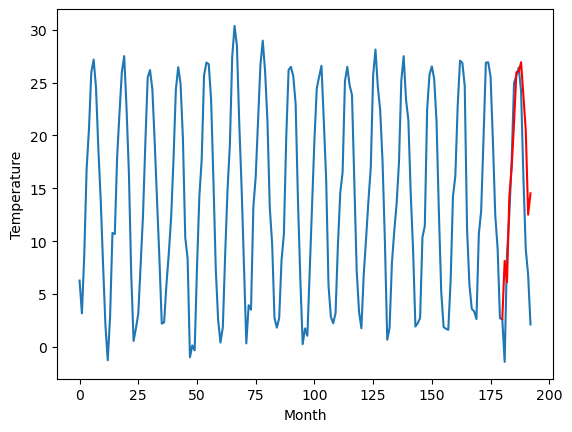

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		5.82		-1.12
9.67		3.79		-5.88
11.48		11.91		0.43
13.29		14.65		1.36
16.87		18.89		2.02
18.09		23.64		5.55
18.88		23.70		4.82
18.93		24.59		5.66
17.65		21.40		3.75
16.51		18.10		1.59
9.66		10.18		0.52
10.56		12.20		1.64
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[16.55, 5.816428987979889, 3.7911187100410464, 11.913247196674348, 14.64727124452591, 18.890207855701448, 23.635838596820832, 23.698930776417257, 24.585365510284902, 21.395226693451406, 18.09961149722338, 10.178368306457998, 12.199042058289052]


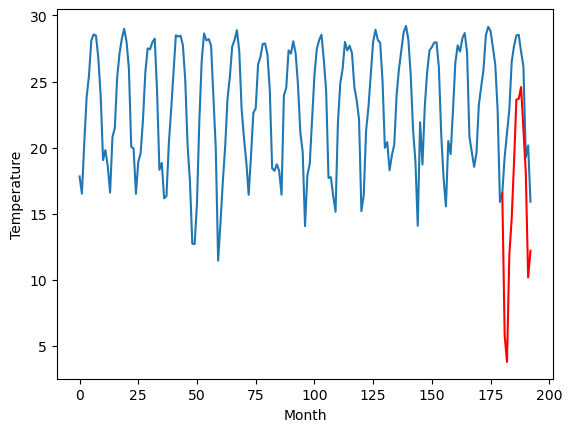

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		17.36		2.62
14.76		15.33		0.57
18.87		23.45		4.58
23.37		26.19		2.82
28.63		30.43		1.80
34.20		35.18		0.98
36.20		35.24		-0.96
37.26		36.13		-1.13
34.09		32.94		-1.15
30.26		29.64		-0.62
22.18		21.72		-0.46
20.26		23.74		3.48
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.83, 17.35642898797989, 15.331118710041046, 23.453247196674347, 26.18727124452591, 30.430207855701447, 35.17583859682083, 35.238930776417256, 36.1253655102849, 32.935226693451405, 29.639611497223378, 21.718368306457997, 23.73904205828905]


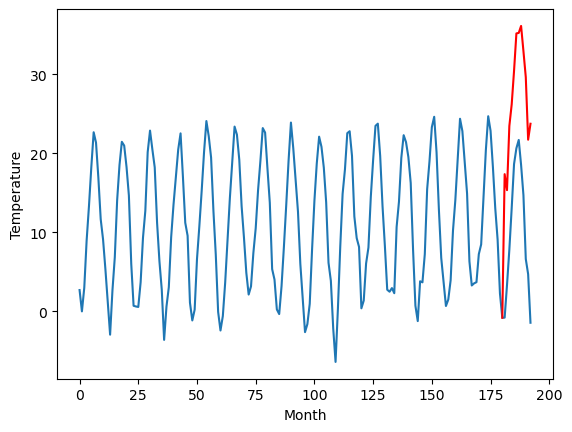

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		2.22		-0.81
2.29		0.19		-2.10
9.62		8.31		-1.31
10.49		11.05		0.56
14.96		15.29		0.33
18.44		20.04		1.60
19.03		20.10		1.07
19.20		20.99		1.79
16.66		17.80		1.14
13.92		14.50		0.58
5.65		6.58		0.93
9.06		8.60		-0.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.52, 2.216428987979889, 0.1911187100410463, 8.313247196674347, 11.04727124452591, 15.290207855701446, 20.03583859682083, 20.098930776417255, 20.9853655102849, 17.795226693451404, 14.499611497223377, 6.578368306457996, 8.59904205828905]


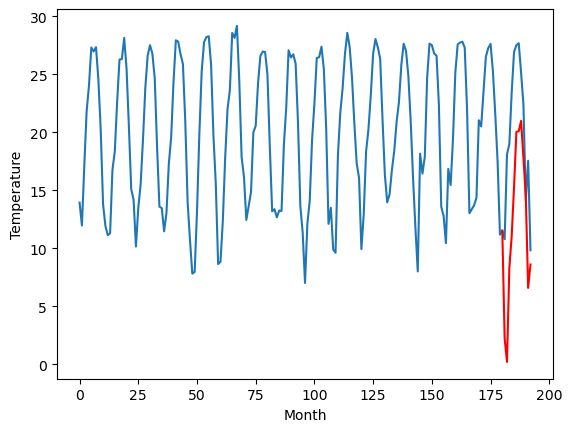

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.48		0.13
11.00		11.45		0.45
19.38		19.57		0.19
21.50		22.31		0.81
25.54		26.55		1.01
30.09		31.30		1.21
30.17		31.36		1.19
31.28		32.25		0.97
28.54		29.06		0.52
25.24		25.76		0.52
17.60		17.84		0.24
20.84		19.86		-0.98
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.47, 13.476428987979888, 11.451118710041046, 19.573247196674345, 22.307271244525907, 26.550207855701444, 31.29583859682083, 31.358930776417253, 32.2453655102849, 29.055226693451402, 25.759611497223375, 17.838368306457994, 19.85904205828905]


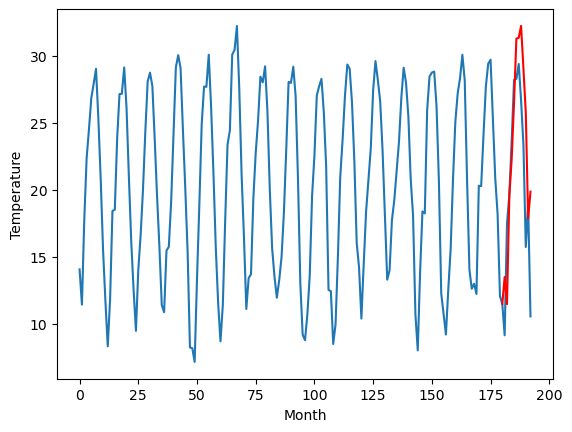

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.59		0.24
10.24		11.56		1.32
20.61		19.68		-0.93
22.31		22.42		0.11
26.39		26.66		0.27
31.95		31.41		-0.54
32.84		31.47		-1.37
33.40		32.36		-1.04
31.13		29.17		-1.96
26.62		25.87		-0.75
18.65		17.95		-0.70
20.94		19.97		-0.97
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 13.58642898797989, 11.561118710041047, 19.683247196674348, 22.41727124452591, 26.660207855701447, 31.405838596820832, 31.468930776417256, 32.3553655102849, 29.1652266934514, 25.869611497223374, 17.948368306457994, 19.969042058289048]


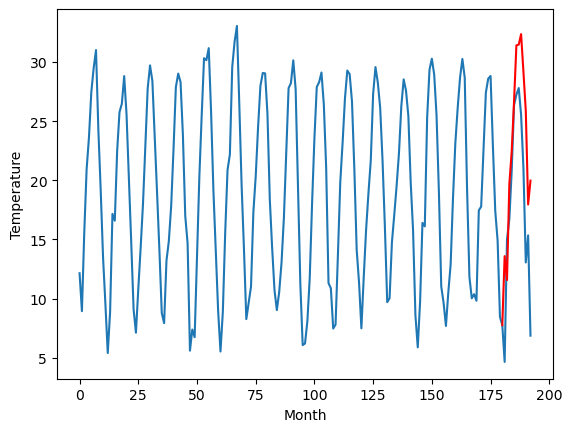

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		11.68		-1.00
15.60		9.65		-5.95
18.70		17.77		-0.93
25.36		20.51		-4.85
30.37		24.75		-5.62
35.36		29.50		-5.86
34.16		29.56		-4.60
33.64		30.45		-3.19
31.46		27.26		-4.20
24.90		23.96		-0.94
19.50		16.04		-3.46
16.15		18.06		1.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.9, 11.67642898797989, 9.651118710041047, 17.773247196674347, 20.50727124452591, 24.750207855701447, 29.495838596820832, 29.558930776417256, 30.4453655102849, 27.255226693451405, 23.959611497223378, 16.038368306457997, 18.05904205828905]


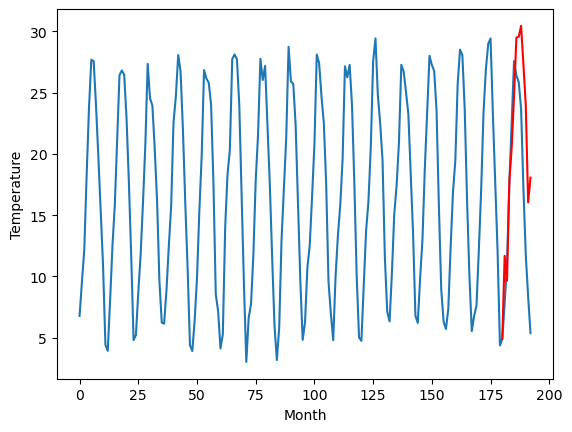

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		6.31		-0.40
5.79		4.28		-1.51
5.39		12.40		7.01
9.25		15.14		5.89
11.47		19.38		7.91
15.71		24.13		8.42
18.69		24.19		5.50
18.29		25.08		6.79
16.51		21.89		5.38
11.53		18.59		7.06
10.27		10.67		0.40
3.76		12.69		8.93
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.14, 6.3064289879798885, 4.281118710041046, 12.403247196674346, 15.137271244525909, 19.380207855701446, 24.12583859682083, 24.188930776417255, 25.0753655102849, 21.885226693451404, 18.589611497223377, 10.668368306457996, 12.68904205828905]


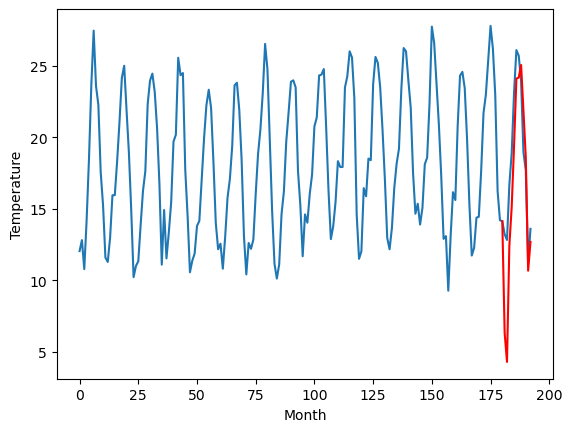

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		11.58		-0.05
12.13		9.55		-2.58
19.01		17.67		-1.34
21.80		20.41		-1.39
25.82		24.65		-1.17
30.11		29.40		-0.71
31.68		29.46		-2.22
31.77		30.35		-1.42
27.66		27.16		-0.50
24.38		23.86		-0.52
15.47		15.94		0.47
17.39		17.96		0.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.55, 11.576428987979888, 9.551118710041045, 17.673247196674346, 20.40727124452591, 24.650207855701446, 29.39583859682083, 29.458930776417255, 30.3453655102849, 27.155226693451404, 23.859611497223376, 15.938368306457996, 17.95904205828905]


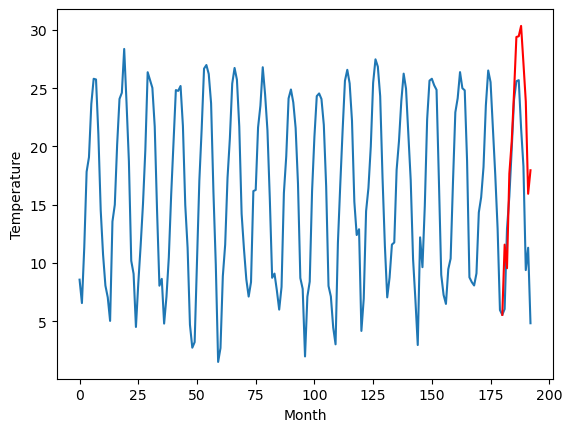

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		8.11		-0.79
10.25		6.08		-4.17
16.46		14.20		-2.26
18.43		16.94		-1.49
23.34		21.18		-2.16
28.75		25.93		-2.82
30.06		25.99		-4.07
30.14		26.88		-3.26
25.65		23.69		-1.96
21.89		20.39		-1.50
11.67		12.47		0.80
13.77		14.49		0.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.19, 8.10642898797989, 6.081118710041046, 14.203247196674347, 16.93727124452591, 21.180207855701447, 25.92583859682083, 25.988930776417256, 26.8753655102849, 23.685226693451405, 20.389611497223378, 12.468368306457997, 14.489042058289051]


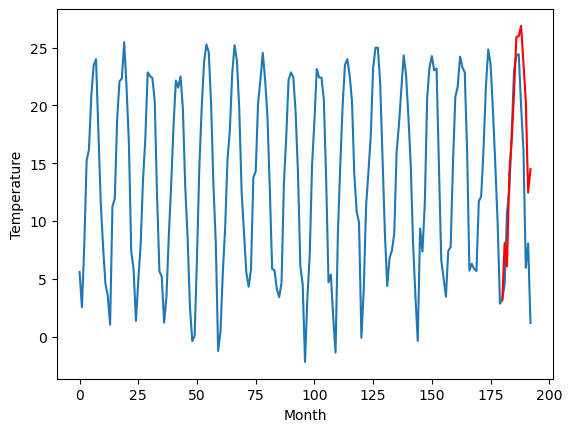

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   8.106429
1                 1    8.53   8.146429
2                 2    6.94   5.816429
3                 3   14.74  17.356429
4                 4    3.03   2.216429
5                 5   13.35  13.476429
6                 6   13.35  13.586429
7                 7   12.68  11.676429
8                 8    6.71   6.306429
9                 9   11.63  11.576429
10               10    8.90   8.106429


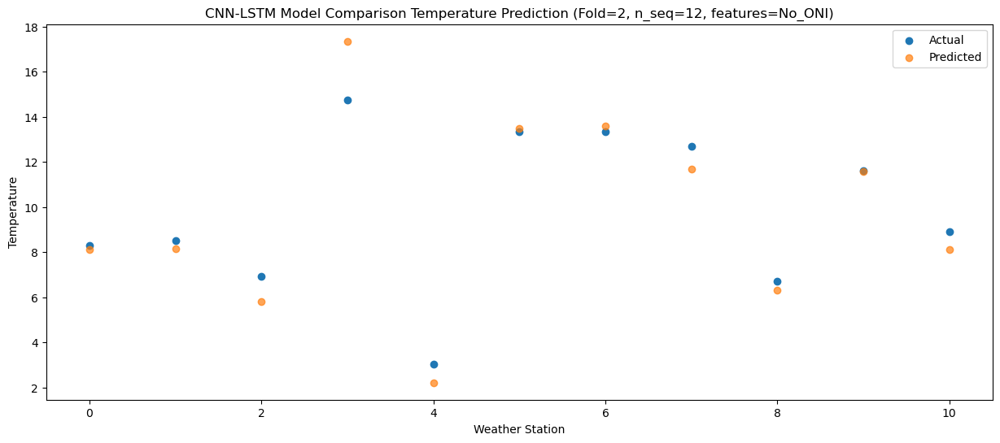

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   6.081119
1                 1    4.49   6.121119
2                 2    9.67   3.791119
3                 3   14.76  15.331119
4                 4    2.29   0.191119
5                 5   11.00  11.451119
6                 6   10.24  11.561119
7                 7   15.60   9.651119
8                 8    5.79   4.281119
9                 9   12.13   9.551119
10               10   10.25   6.081119


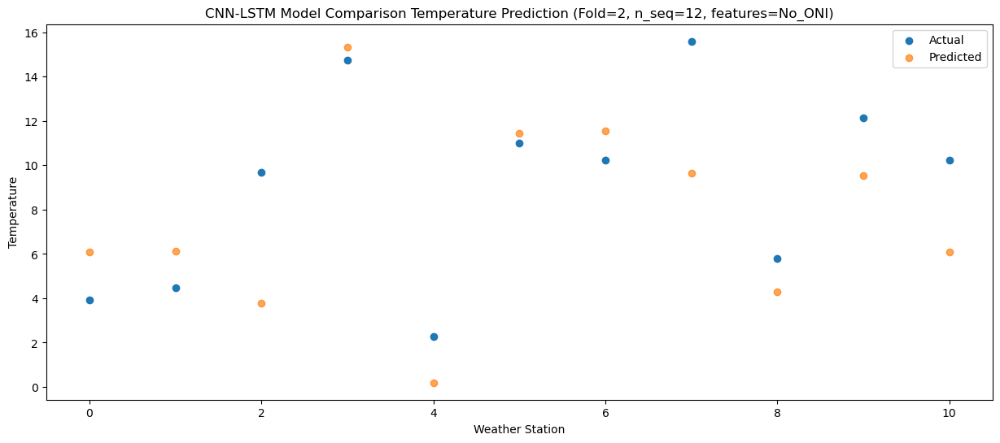

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  14.203247
1                 1   14.68  14.243247
2                 2   11.48  11.913247
3                 3   18.87  23.453247
4                 4    9.62   8.313247
5                 5   19.38  19.573247
6                 6   20.61  19.683247
7                 7   18.70  17.773247
8                 8    5.39  12.403247
9                 9   19.01  17.673247
10               10   16.46  14.203247


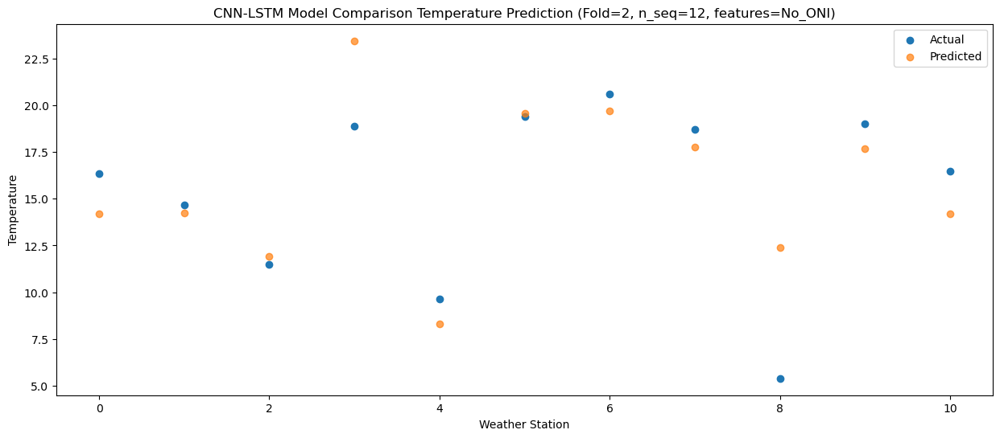

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  16.937271
1                 1   18.44  16.977271
2                 2   13.29  14.647271
3                 3   23.37  26.187271
4                 4   10.49  11.047271
5                 5   21.50  22.307271
6                 6   22.31  22.417271
7                 7   25.36  20.507271
8                 8    9.25  15.137271
9                 9   21.80  20.407271
10               10   18.43  16.937271


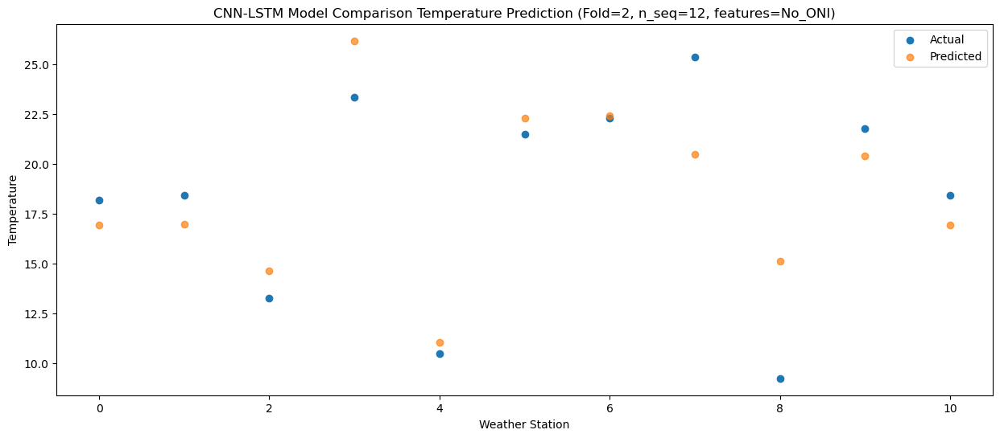

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  21.180208
1                 1   23.62  21.220208
2                 2   16.87  18.890208
3                 3   28.63  30.430208
4                 4   14.96  15.290208
5                 5   25.54  26.550208
6                 6   26.39  26.660208
7                 7   30.37  24.750208
8                 8   11.47  19.380208
9                 9   25.82  24.650208
10               10   23.34  21.180208


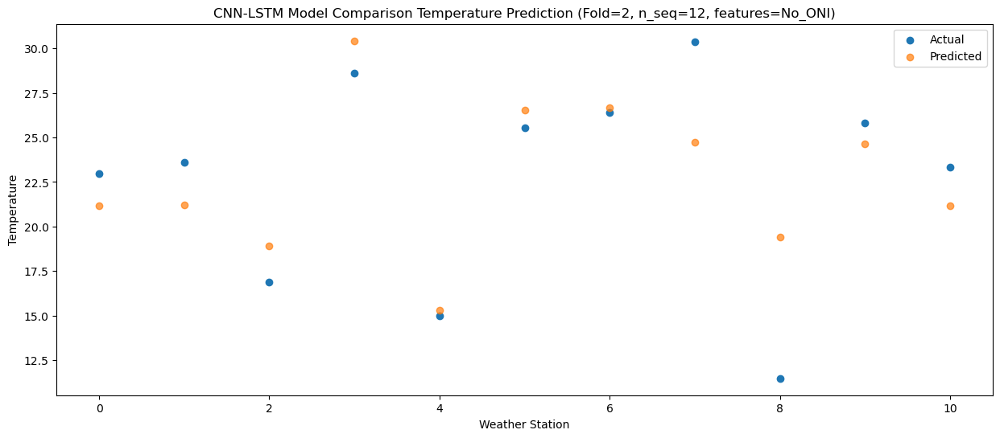

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  25.925839
1                 1   30.87  25.965839
2                 2   18.09  23.635839
3                 3   34.20  35.175839
4                 4   18.44  20.035839
5                 5   30.09  31.295839
6                 6   31.95  31.405839
7                 7   35.36  29.495839
8                 8   15.71  24.125839
9                 9   30.11  29.395839
10               10   28.75  25.925839


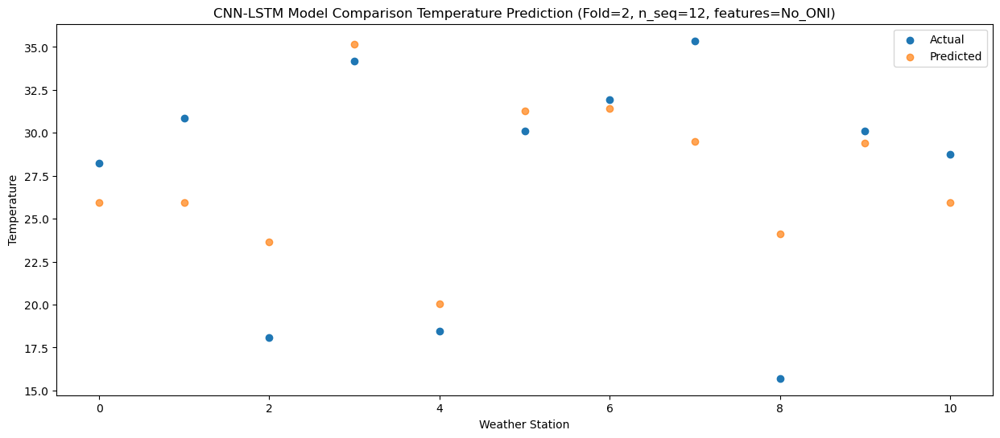

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   29.24  25.988931
1                 1   31.56  26.028931
2                 2   18.88  23.698931
3                 3   36.20  35.238931
4                 4   19.03  20.098931
5                 5   30.17  31.358931
6                 6   32.84  31.468931
7                 7   34.16  29.558931
8                 8   18.69  24.188931
9                 9   31.68  29.458931
10               10   30.06  25.988931


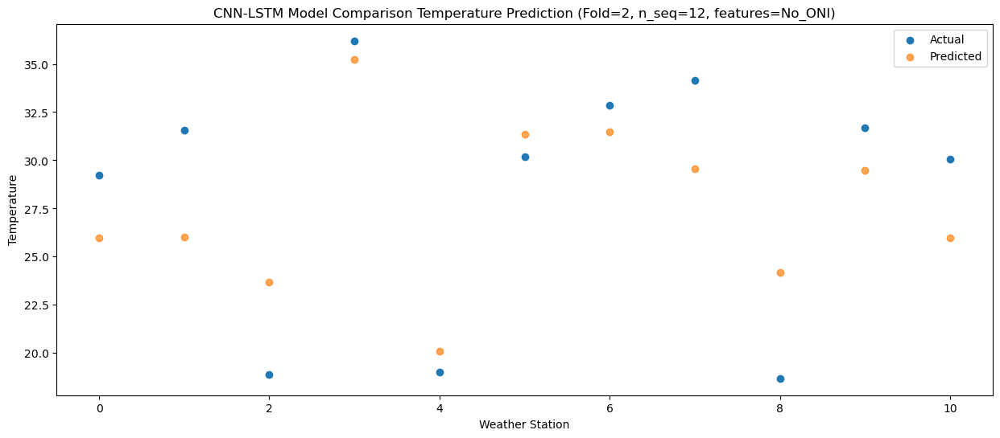

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   29.69  26.875366
1                 1   32.32  26.915366
2                 2   18.93  24.585366
3                 3   37.26  36.125366
4                 4   19.20  20.985366
5                 5   31.28  32.245366
6                 6   33.40  32.355366
7                 7   33.64  30.445366
8                 8   18.29  25.075366
9                 9   31.77  30.345366
10               10   30.14  26.875366


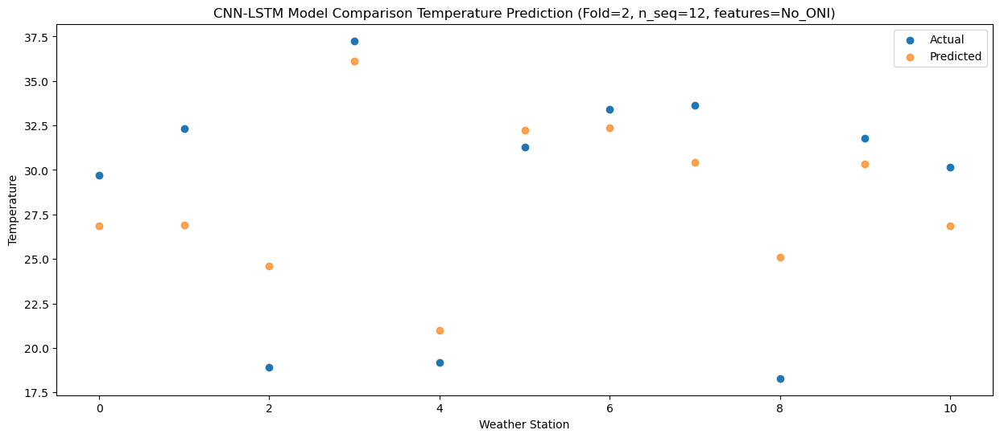

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   26.39  23.685227
1                 1   30.08  23.725227
2                 2   17.65  21.395227
3                 3   34.09  32.935227
4                 4   16.66  17.795227
5                 5   28.54  29.055227
6                 6   31.13  29.165227
7                 7   31.46  27.255227
8                 8   16.51  21.885227
9                 9   27.66  27.155227
10               10   25.65  23.685227


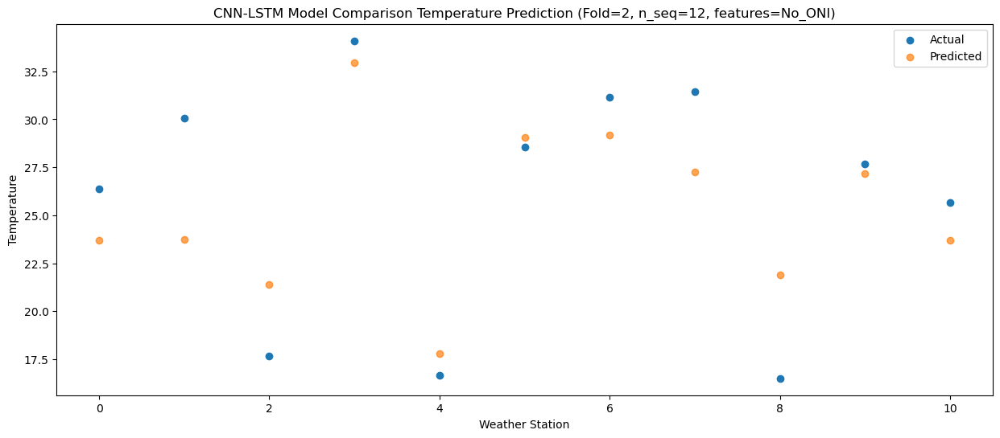

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.64  20.389611
1                 1   21.82  20.429611
2                 2   16.51  18.099611
3                 3   30.26  29.639611
4                 4   13.92  14.499611
5                 5   25.24  25.759611
6                 6   26.62  25.869611
7                 7   24.90  23.959611
8                 8   11.53  18.589611
9                 9   24.38  23.859611
10               10   21.89  20.389611


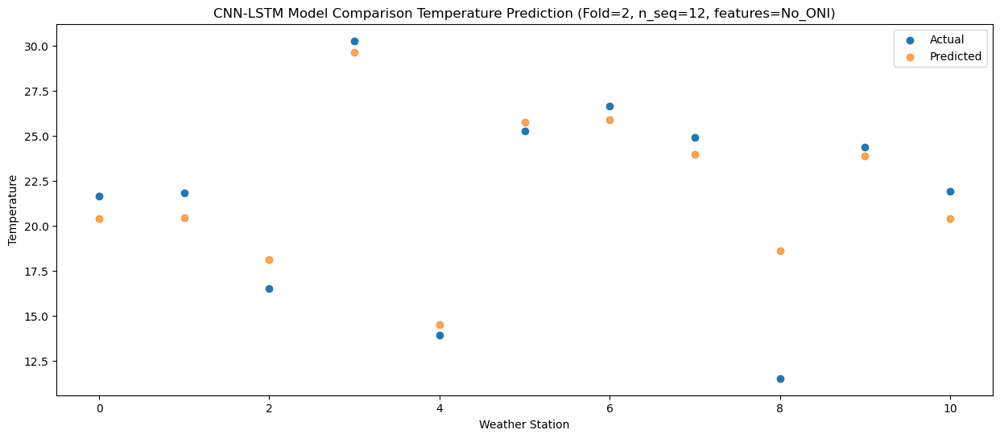

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   12.02  12.468368
1                 1   15.11  12.508368
2                 2    9.66  10.178368
3                 3   22.18  21.718368
4                 4    5.65   6.578368
5                 5   17.60  17.838368
6                 6   18.65  17.948368
7                 7   19.50  16.038368
8                 8   10.27  10.668368
9                 9   15.47  15.938368
10               10   11.67  12.468368


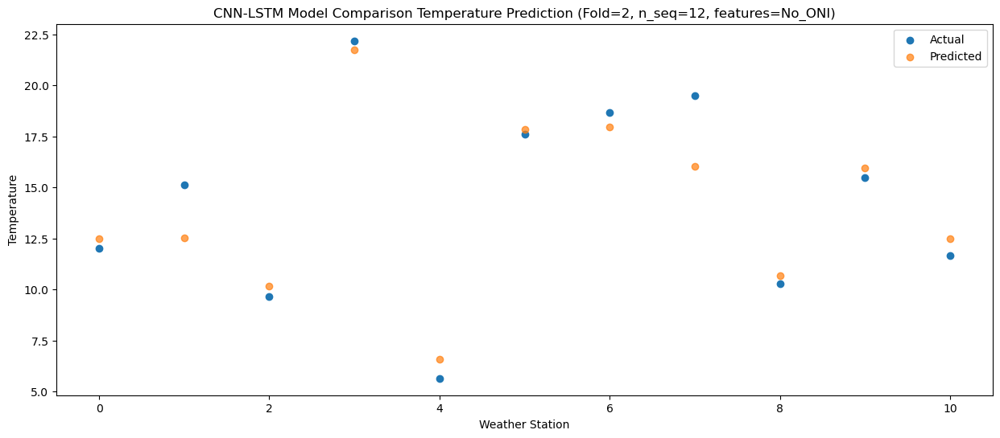

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.11  14.489042
1                 1   12.72  14.529042
2                 2   10.56  12.199042
3                 3   20.26  23.739042
4                 4    9.06   8.599042
5                 5   20.84  19.859042
6                 6   20.94  19.969042
7                 7   16.15  18.059042
8                 8    3.76  12.689042
9                 9   17.39  17.959042
10               10   13.77  14.489042


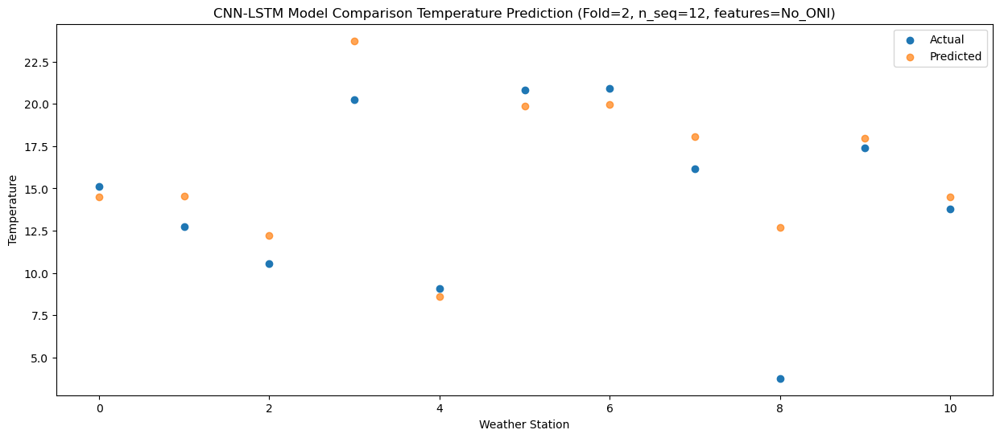

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]
 [29.24 31.56 18.88 36.2  19.03 30.17 32.84 34.16 18.69 31.68 30.06]
 [29.69 32.32 18.93 37.26 19.2  31.28 33.4  33.64 18.29 31.77 30.14]
 [26.39 30.08 17.65 34.09 16.66 28.54 31.13 31.46 16.51 27.66 25.65]
 [21.64 21.82 16.51 30.26 13.92 25.24 26.62 24.9  11.53 24.38 21.89]
 [12.02 15.11  9.66 22.18  5.65 17.6  18.65 19.5  10.27 15.47 11.67]
 [15.11 12.72 10.56 20.26  9.06 20.84 20.94 16.15  3.76 17.39 13.77]]
[[ 8.10642899  8.14642899  5.81642899 17.35642899  2.21642899 13.47642899
  13.58642899 11.67642899  6.30642899 11.57642899  8.10642899]
 [ 6.08111871  6.12111871  3

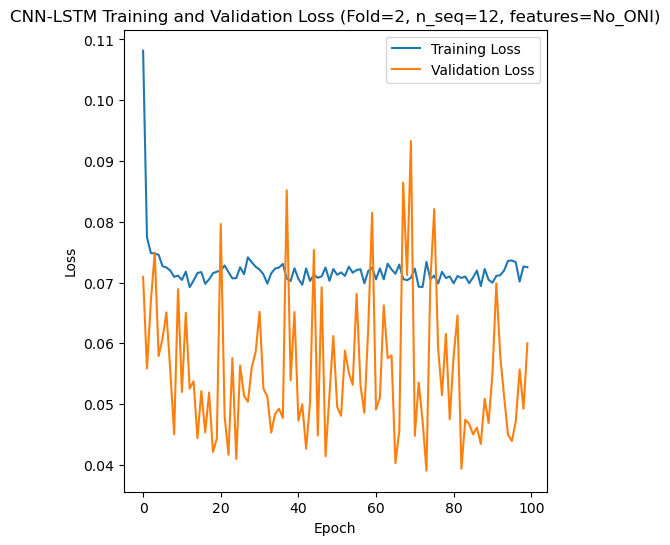

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 45s 299ms/step - loss: 0.1089 - accuracy: 0.7500 - mae: 0.0904 - rmse: 0.1089 - mape: 19.9525 - pearson: 0.7620 - val_loss: 0.1014 - val_accuracy: 0.7000 - val_mae: 0.0807 - val_rmse: 0.1014 - val_mape: 23.0995 - val_pearson: 0.6930
Epoch 2/100
84/84 [==============================] - 19s 222ms/step - loss: 0.0763 - accuracy: 0.7619 - mae: 0.0602 - rmse: 0.0763 - mape: 14.0869 - pearson: 0.8031 - val_loss: 0.0885 - val_accuracy: 0.7000 - val_mae: 0.0681 - val_rmse: 0.0885 - val_mape: 17.4267 - val_pearson: 0.7411
Epoch 3/100
84/84 [==============================] - 19s 228ms/step - loss: 0.0730 - accuracy: 0.7619 - mae: 0.0578 - rmse: 0.0730 - mape: 13.5541 - pearson: 0.8232

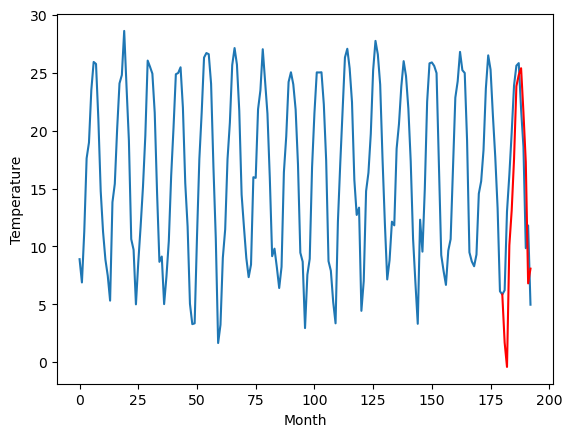

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		7.40		-0.35
4.03		5.30		1.27
16.00		15.79		-0.21
17.86		18.82		0.96
22.08		23.26		1.18
28.79		29.54		0.75
30.10		30.50		0.40
30.67		31.09		0.42
27.94		27.29		-0.65
21.34		22.99		1.65
13.63		12.51		-1.12
14.94		13.78		-1.16
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.2, 7.398541593551636, 5.29700198173523, 15.792094373703003, 18.81509675979614, 23.25568904876709, 29.54085578918457, 30.504012727737425, 31.09090414047241, 27.28624382019043, 22.98981990814209, 12.50928726196289, 13.783763790130614]


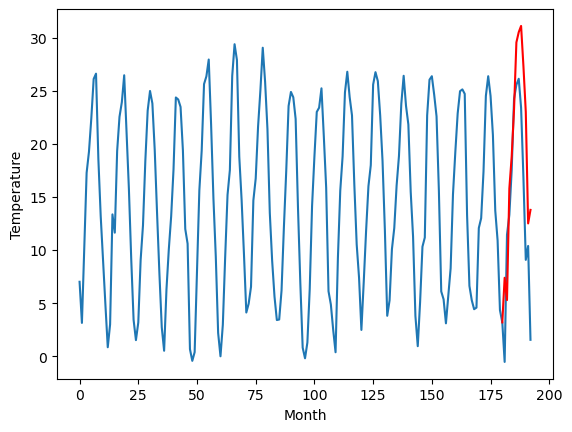

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		5.52		-2.76
10.58		3.42		-7.16
11.73		13.91		2.18
17.46		16.94		-0.52
22.26		21.38		-0.88
27.11		27.66		0.55
30.24		28.62		-1.62
28.04		29.21		1.17
24.73		25.41		0.68
16.07		21.11		5.04
11.73		10.63		-1.10
7.81		11.90		4.09
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[8.48, 5.518541593551635, 3.417001981735229, 13.912094373703003, 16.935096759796142, 21.37568904876709, 27.66085578918457, 28.624012727737426, 29.21090414047241, 25.40624382019043, 21.10981990814209, 10.62928726196289, 11.903763790130615]


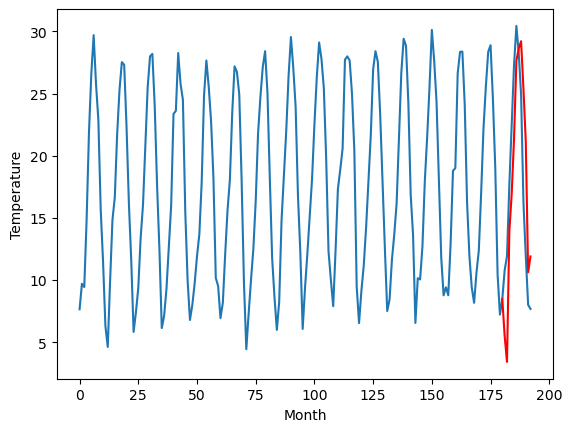

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		6.15		-0.04
4.87		4.05		-0.82
15.08		14.54		-0.54
17.43		17.57		0.14
21.50		22.01		0.51
27.42		28.29		0.87
28.41		29.25		0.84
28.93		29.84		0.91
24.80		26.04		1.24
21.22		21.74		0.52
11.56		11.26		-0.30
13.05		12.53		-0.52
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.55, 6.148541593551636, 4.04700198173523, 14.542094373703003, 17.56509675979614, 22.00568904876709, 28.29085578918457, 29.254012727737425, 29.84090414047241, 26.03624382019043, 21.73981990814209, 11.25928726196289, 12.533763790130614]


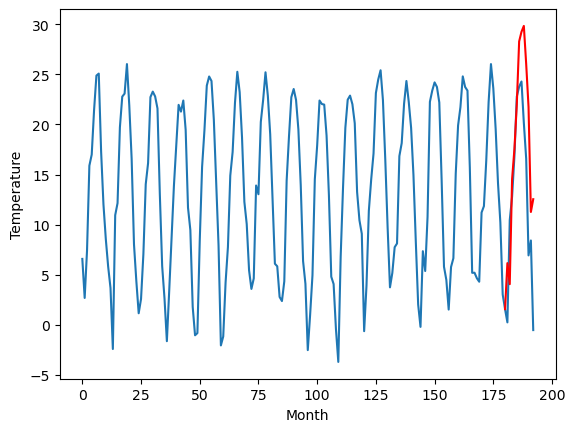

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		5.07		-0.03
1.23		2.97		1.74
14.31		13.46		-0.85
17.60		16.49		-1.11
22.17		20.93		-1.24
29.65		27.21		-2.44
29.65		28.17		-1.48
29.77		28.76		-1.01
26.41		24.96		-1.45
20.99		20.66		-0.33
11.25		10.18		-1.07
10.89		11.45		0.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.08, 5.068541593551636, 2.9670019817352298, 13.462094373703003, 16.485096759796143, 20.92568904876709, 27.21085578918457, 28.174012727737427, 28.760904140472412, 24.95624382019043, 20.65981990814209, 10.179287261962891, 11.453763790130616]


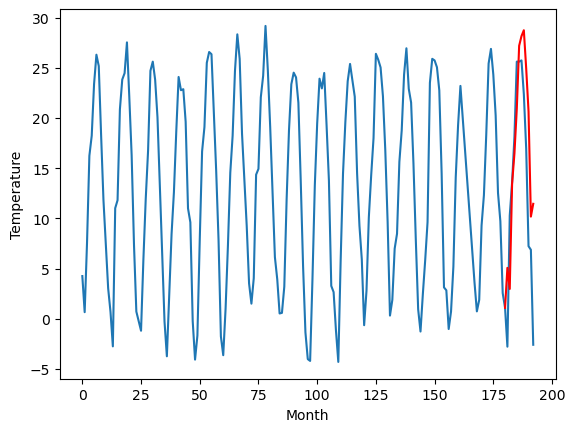

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		2.75		-0.05
0.08		0.65		0.57
11.41		11.14		-0.27
14.86		14.17		-0.69
19.14		18.61		-0.53
25.85		24.89		-0.96
26.23		25.85		-0.38
26.55		26.44		-0.11
23.29		22.64		-0.65
18.71		18.34		-0.37
7.86		7.86		-0.00
8.91		9.13		0.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.21, 2.7485415935516357, 0.6470019817352295, 11.142094373703003, 14.165096759796143, 18.60568904876709, 24.89085578918457, 25.854012727737427, 26.440904140472412, 22.63624382019043, 18.33981990814209, 7.859287261962891, 9.133763790130615]


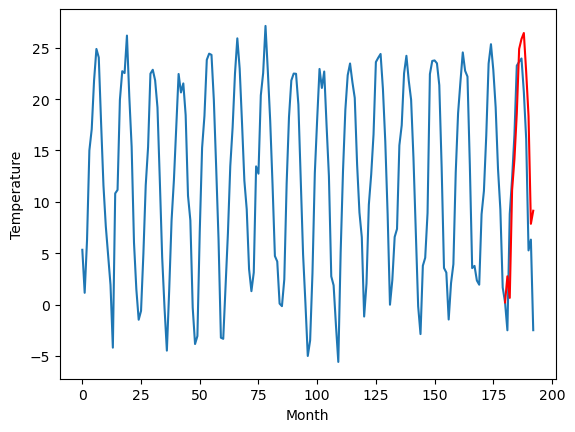

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		3.83		-1.77
5.70		1.73		-3.97
8.67		12.22		3.55
13.45		15.25		1.80
18.50		19.69		1.19
25.89		25.97		0.08
27.73		26.93		-0.80
25.81		27.52		1.71
23.94		23.72		-0.22
15.97		19.42		3.45
13.23		8.94		-4.29
8.47		10.21		1.74
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-8.22, 3.828541593551636, 1.7270019817352296, 12.222094373703003, 15.245096759796143, 19.685689048767088, 25.97085578918457, 26.934012727737425, 27.52090414047241, 23.716243820190428, 19.419819908142088, 8.939287261962889, 10.213763790130614]


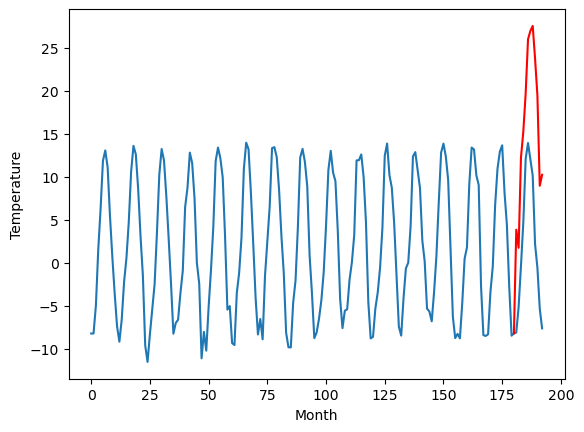

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-9.74		-2.05
-4.84		-11.84		-7.00
-3.24		-1.35		1.89
4.73		1.68		-3.05
9.16		6.12		-3.04
16.80		12.40		-4.40
17.88		13.36		-4.52
16.65		13.95		-2.70
12.68		10.15		-2.53
2.33		5.85		3.52
-0.19		-4.63		-4.44
-7.46		-3.36		4.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.04, -9.741458406448364, -11.84299801826477, -1.3479056262969973, 1.6750967597961424, 6.11568904876709, 12.40085578918457, 13.364012727737427, 13.950904140472412, 10.14624382019043, 5.84981990814209, -4.63071273803711, -3.356236209869385]


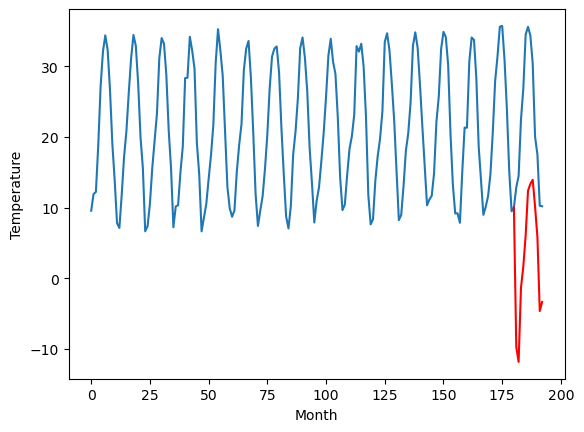

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		8.07		-2.72
11.72		5.97		-5.75
11.50		16.46		4.96
13.69		19.49		5.80
17.98		23.93		5.95
19.68		30.21		10.53
18.86		31.17		12.31
19.41		31.76		12.35
18.86		27.96		9.10
16.10		23.66		7.56
13.28		13.18		-0.10
9.58		14.45		4.87
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.17, 8.068541593551636, 5.96700198173523, 16.462094373703003, 19.485096759796143, 23.92568904876709, 30.21085578918457, 31.174012727737427, 31.760904140472412, 27.95624382019043, 23.65981990814209, 13.179287261962891, 14.453763790130616]


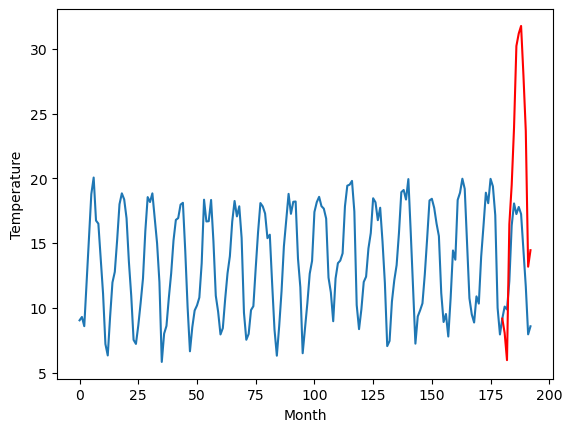

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		7.54		1.52
5.90		5.44		-0.46
10.90		15.93		5.03
15.52		18.96		3.44
20.35		23.40		3.05
26.22		29.68		3.46
28.36		30.64		2.28
28.98		31.23		2.25
25.66		27.43		1.77
21.22		23.13		1.91
12.30		12.65		0.35
10.70		13.92		3.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.94, 7.538541593551635, 5.437001981735229, 15.932094373703002, 18.95509675979614, 23.39568904876709, 29.68085578918457, 30.644012727737426, 31.23090414047241, 27.42624382019043, 23.12981990814209, 12.64928726196289, 13.923763790130614]


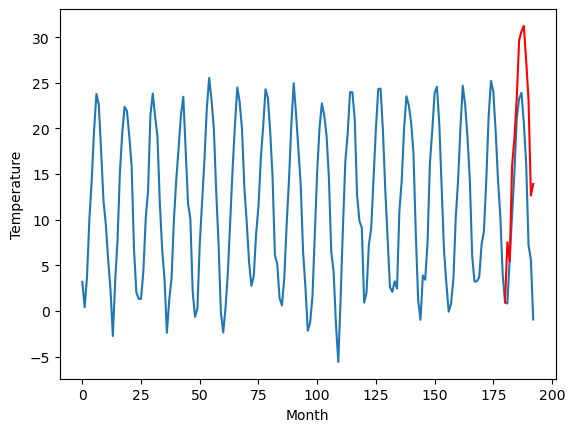

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		1.70		0.06
0.84		-0.40		-1.24
8.03		10.09		2.06
12.90		13.12		0.22
17.16		17.56		0.40
23.33		23.84		0.51
24.97		24.80		-0.17
24.70		25.39		0.69
20.44		21.59		1.15
16.32		17.29		0.97
6.10		6.81		0.71
5.69		8.08		2.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.13, 1.698541593551636, -0.40299801826477033, 10.092094373703002, 13.115096759796142, 17.55568904876709, 23.84085578918457, 24.804012727737426, 25.39090414047241, 21.58624382019043, 17.28981990814209, 6.80928726196289, 8.083763790130615]


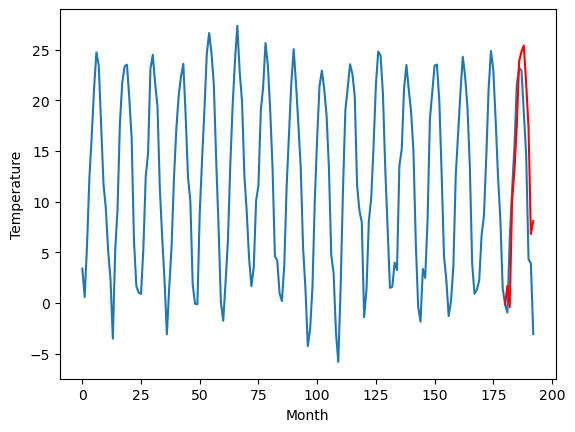

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   1.698542
1                 1    7.75   7.398542
2                 2    8.28   5.518542
3                 3    6.19   6.148542
4                 4    5.10   5.068542
5                 5    2.80   2.748542
6                 6    5.60   3.828542
7                 7   -7.69  -9.741458
8                 8   10.79   8.068542
9                 9    6.02   7.538542
10               10    1.64   1.698542


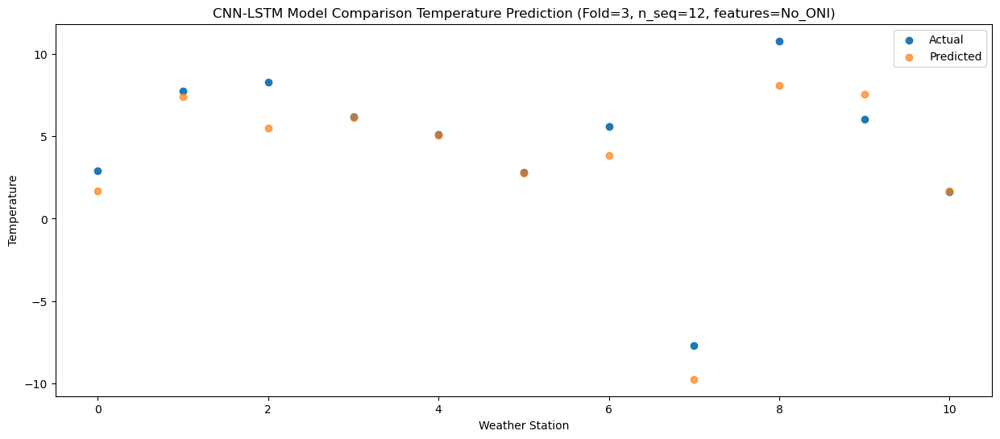

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29  -0.402998
1                 1    4.03   5.297002
2                 2   10.58   3.417002
3                 3    4.87   4.047002
4                 4    1.23   2.967002
5                 5    0.08   0.647002
6                 6    5.70   1.727002
7                 7   -4.84 -11.842998
8                 8   11.72   5.967002
9                 9    5.90   5.437002
10               10    0.84  -0.402998


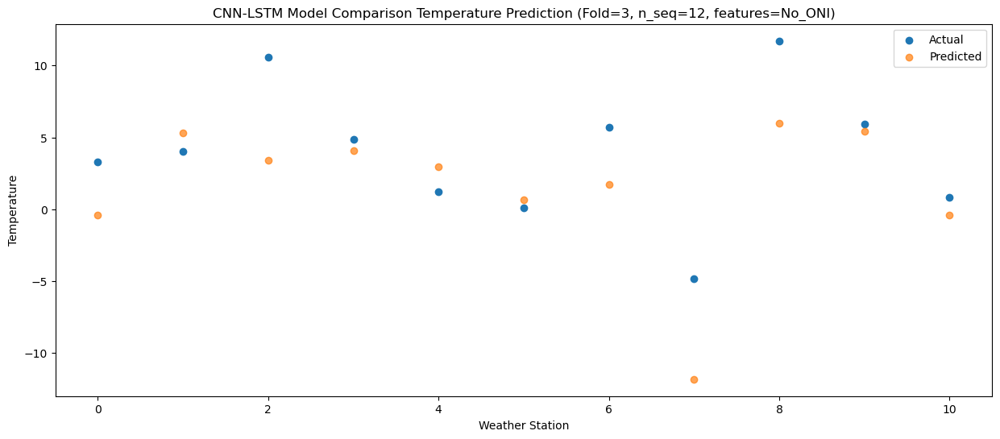

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09  10.092094
1                 1   16.00  15.792094
2                 2   11.73  13.912094
3                 3   15.08  14.542094
4                 4   14.31  13.462094
5                 5   11.41  11.142094
6                 6    8.67  12.222094
7                 7   -3.24  -1.347906
8                 8   11.50  16.462094
9                 9   10.90  15.932094
10               10    8.03  10.092094


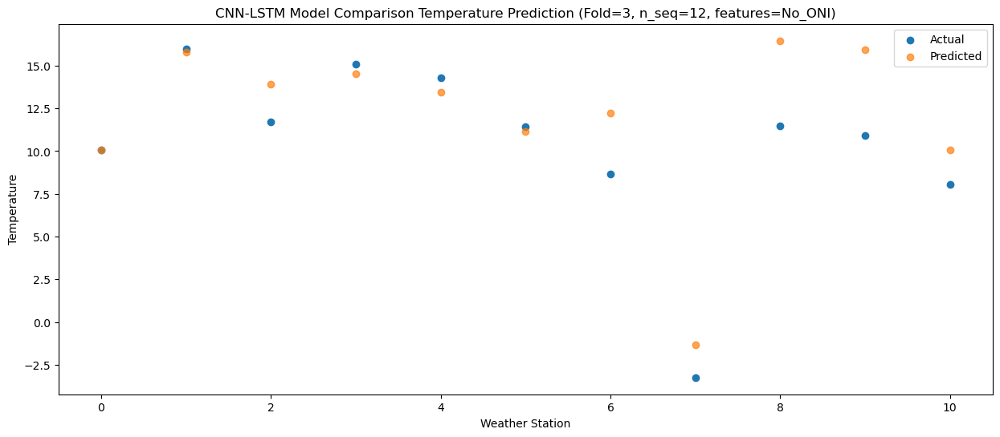

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25  13.115097
1                 1   17.86  18.815097
2                 2   17.46  16.935097
3                 3   17.43  17.565097
4                 4   17.60  16.485097
5                 5   14.86  14.165097
6                 6   13.45  15.245097
7                 7    4.73   1.675097
8                 8   13.69  19.485097
9                 9   15.52  18.955097
10               10   12.90  13.115097


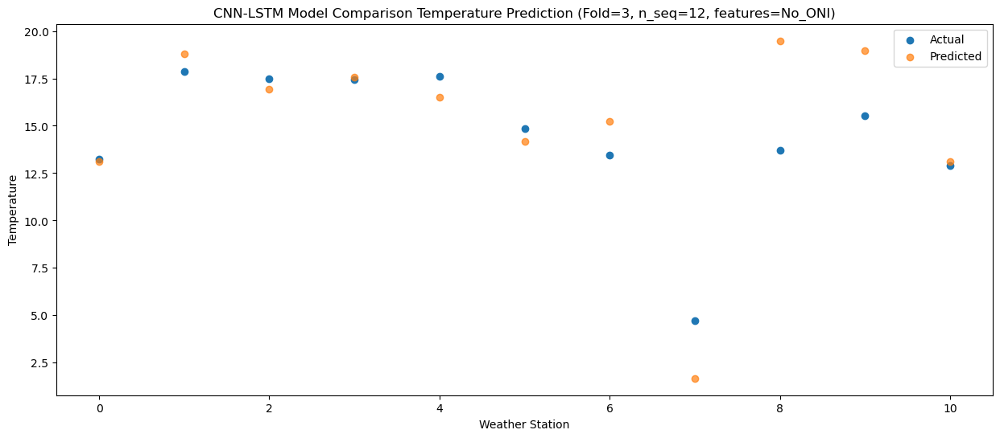

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91  17.555689
1                 1   22.08  23.255689
2                 2   22.26  21.375689
3                 3   21.50  22.005689
4                 4   22.17  20.925689
5                 5   19.14  18.605689
6                 6   18.50  19.685689
7                 7    9.16   6.115689
8                 8   17.98  23.925689
9                 9   20.35  23.395689
10               10   17.16  17.555689


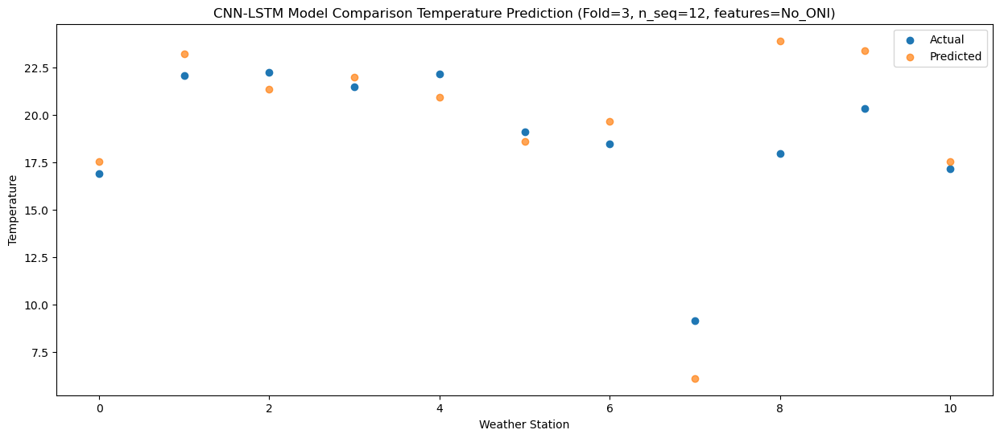

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97  23.840856
1                 1   28.79  29.540856
2                 2   27.11  27.660856
3                 3   27.42  28.290856
4                 4   29.65  27.210856
5                 5   25.85  24.890856
6                 6   25.89  25.970856
7                 7   16.80  12.400856
8                 8   19.68  30.210856
9                 9   26.22  29.680856
10               10   23.33  23.840856


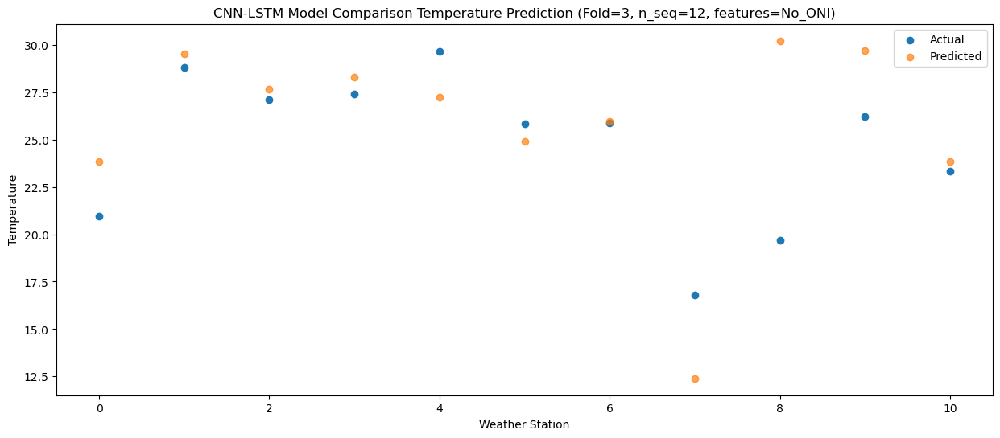

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   22.68  24.804013
1                 1   30.10  30.504013
2                 2   30.24  28.624013
3                 3   28.41  29.254013
4                 4   29.65  28.174013
5                 5   26.23  25.854013
6                 6   27.73  26.934013
7                 7   17.88  13.364013
8                 8   18.86  31.174013
9                 9   28.36  30.644013
10               10   24.97  24.804013


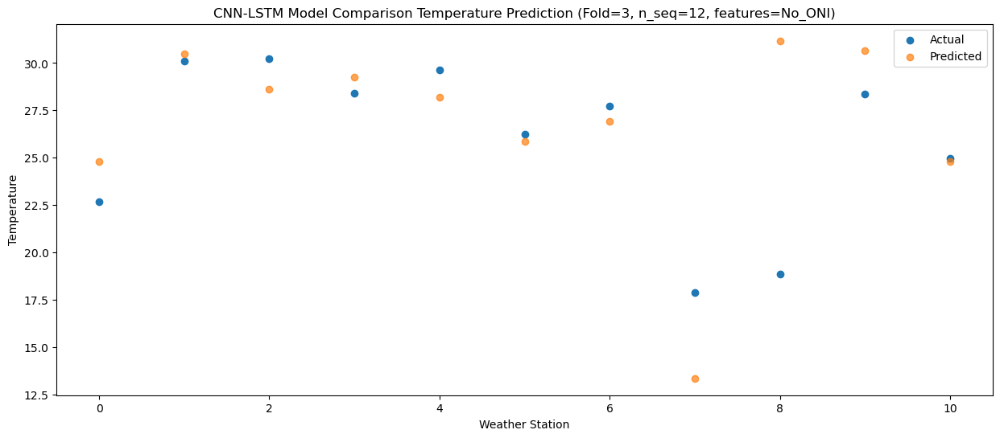

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   22.90  25.390904
1                 1   30.67  31.090904
2                 2   28.04  29.210904
3                 3   28.93  29.840904
4                 4   29.77  28.760904
5                 5   26.55  26.440904
6                 6   25.81  27.520904
7                 7   16.65  13.950904
8                 8   19.41  31.760904
9                 9   28.98  31.230904
10               10   24.70  25.390904


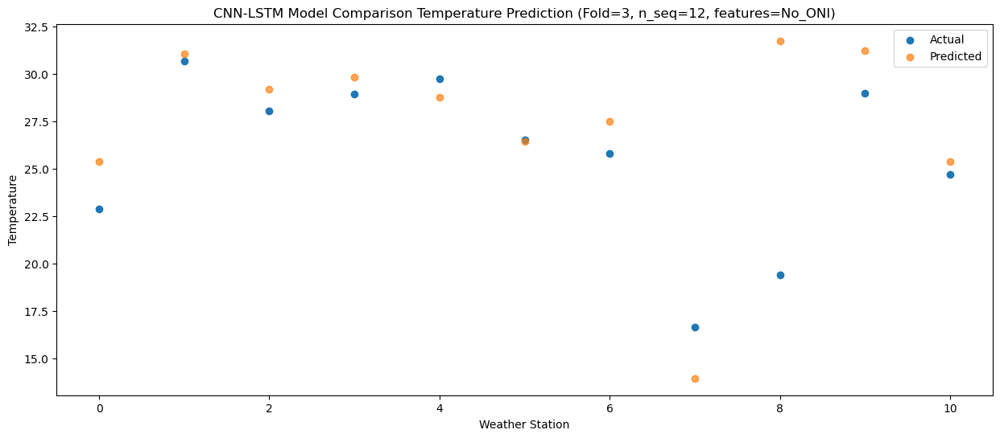

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   18.91  21.586244
1                 1   27.94  27.286244
2                 2   24.73  25.406244
3                 3   24.80  26.036244
4                 4   26.41  24.956244
5                 5   23.29  22.636244
6                 6   23.94  23.716244
7                 7   12.68  10.146244
8                 8   18.86  27.956244
9                 9   25.66  27.426244
10               10   20.44  21.586244


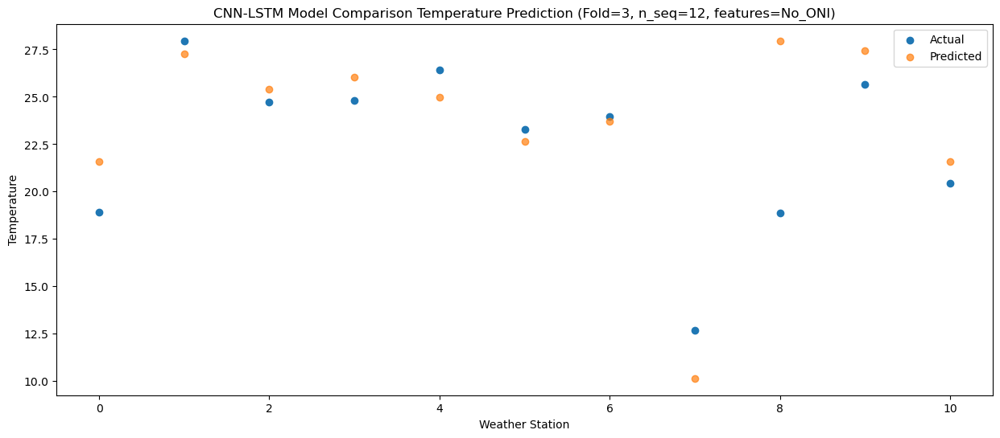

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   15.68   17.28982
1                 1   21.34   22.98982
2                 2   16.07   21.10982
3                 3   21.22   21.73982
4                 4   20.99   20.65982
5                 5   18.71   18.33982
6                 6   15.97   19.41982
7                 7    2.33    5.84982
8                 8   16.10   23.65982
9                 9   21.22   23.12982
10               10   16.32   17.28982


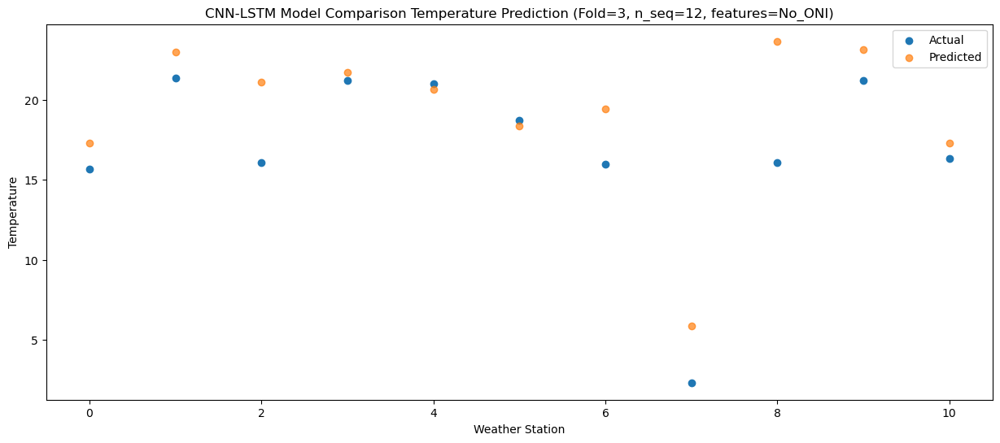

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.92   6.809287
1                 1   13.63  12.509287
2                 2   11.73  10.629287
3                 3   11.56  11.259287
4                 4   11.25  10.179287
5                 5    7.86   7.859287
6                 6   13.23   8.939287
7                 7   -0.19  -4.630713
8                 8   13.28  13.179287
9                 9   12.30  12.649287
10               10    6.10   6.809287


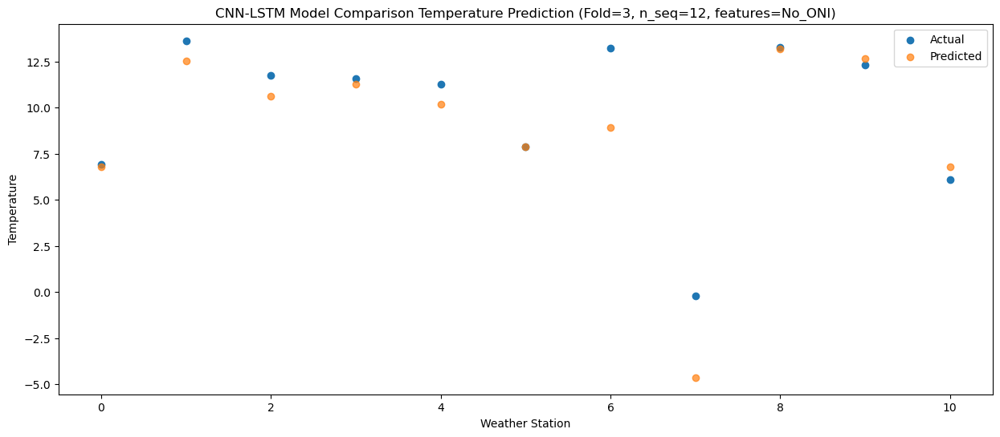

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.88   8.083764
1                 1   14.94  13.783764
2                 2    7.81  11.903764
3                 3   13.05  12.533764
4                 4   10.89  11.453764
5                 5    8.91   9.133764
6                 6    8.47  10.213764
7                 7   -7.46  -3.356236
8                 8    9.58  14.453764
9                 9   10.70  13.923764
10               10    5.69   8.083764


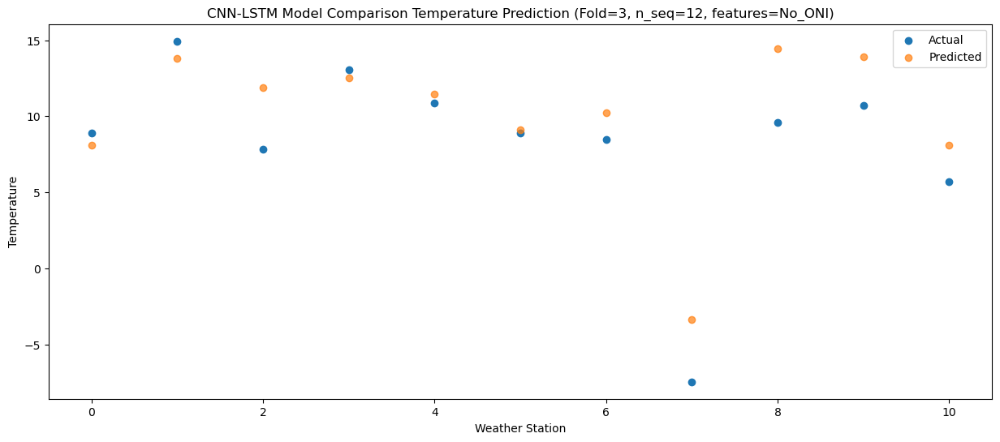

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]
 [22.68 30.1  30.24 28.41 29.65 26.23 27.73 17.88 18.86 28.36 24.97]
 [22.9  30.67 28.04 28.93 29.77 26.55 25.81 16.65 19.41 28.98 24.7 ]
 [18.91 27.94 24.73 24.8  26.41 23.29 23.94 12.68 18.86 25.66 20.44]
 [15.68 21.34 16.07 21.22 20.99 18.71 15.97  2.33 16.1  21.22 16.32]
 [ 6.92 13.63 11.73 11.56 11.25  7.86 13.23 -0.19 13.28 12.3   6.1 ]
 [ 8.88 14.94  7.81 13.05 10.89  8.91  8.47 -7.46  9.58 10.7   5.69]]
[[  1.69854159   7.39854159   5.51854159   6.14854159   5.06854159
    2.74854159   3.82854159  -9.74145841   8.06854159   7.53854159
    1.69854159]
 [ -0.40299802 

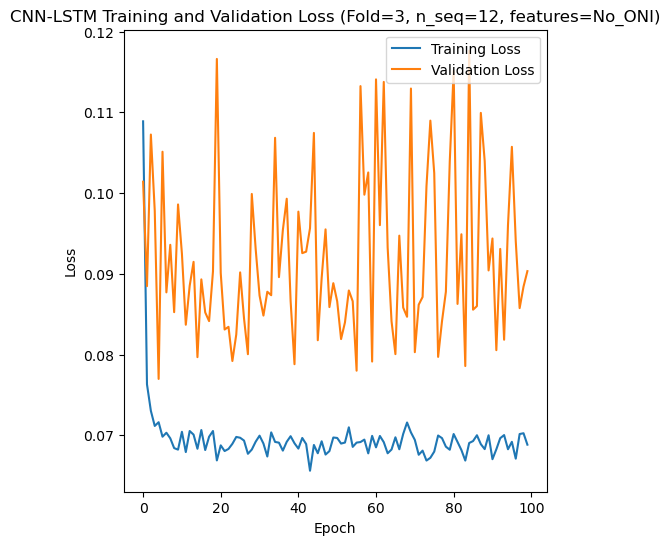

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 45s 303ms/step - loss: 0.1134 - accuracy: 0.5714 - mae: 0.0938 - rmse: 0.1134 - mape: 19.9156 - pearson: 0.7073 - val_loss: 0.1034 - val_accuracy: 0.2000 - val_mae: 0.0803 - val_rmse: 0.1034 - val_mape: 18.5341 - val_pearson: 0.7067
Epoch 2/100
84/84 [==============================] - 19s 231ms/step - loss: 0.0792 - accuracy: 0.6548 - mae: 0.0626 - rmse: 0.0792 - mape: 13.8139 - pearson: 0.7704 - val_loss: 0.0859 - val_accuracy: 0.7000 - val_mae: 0.0692 - val_rmse: 0.0859 - val_mape: 17.1047 - val_pearson: 0.7955
Epoch 3/100
84/84 [==============================] - 20s 237ms/step - loss: 0.0740 - accuracy: 0.7024 - mae: 0.0583 - rmse: 0.0740 - mape: 13.0754 - pearson: 0.7888

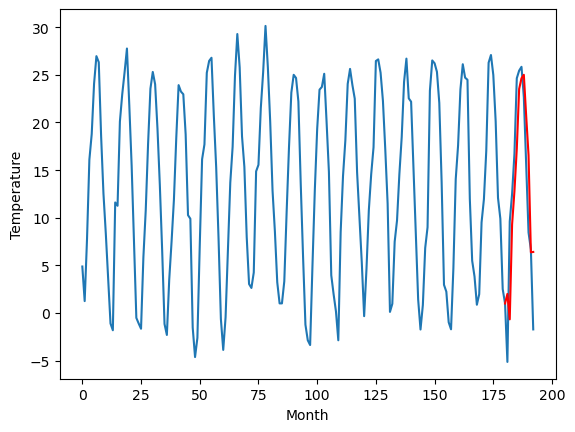

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		3.28		-2.31
9.02		0.62		-8.40
10.62		10.58		-0.04
12.06		14.07		2.01
16.10		18.52		2.42
17.73		24.79		7.06
18.10		25.91		7.81
18.38		26.27		7.89
17.09		21.95		4.86
15.25		17.84		2.59
8.09		7.65		-0.44
9.89		7.69		-2.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.25, 3.282192721366882, 0.6167411947250363, 10.579330458641053, 14.07211567401886, 18.519099488258362, 24.78720118045807, 25.910687580108643, 26.27331514596939, 21.948618605136872, 17.843576624393464, 7.649531557559968, 7.687286041080952]


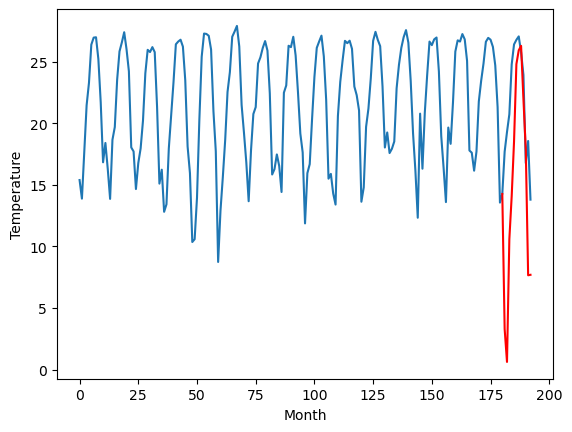

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		13.77		-1.64
13.49		11.11		-2.38
22.82		21.07		-1.75
23.89		24.56		0.67
28.36		29.01		0.65
32.62		35.28		2.66
33.28		36.40		3.12
33.93		36.76		2.83
30.81		32.44		1.63
27.42		28.33		0.91
18.75		18.14		-0.61
22.26		18.18		-4.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.06, 13.772192721366883, 11.106741194725037, 21.069330458641055, 24.562115674018862, 29.009099488258364, 35.27720118045807, 36.400687580108645, 36.76331514596939, 32.438618605136874, 28.333576624393466, 18.13953155755997, 18.177286041080954]


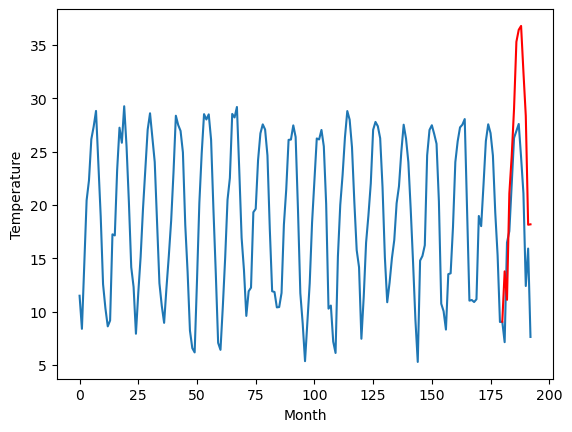

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		9.88		-0.69
7.11		7.22		0.11
18.07		17.18		-0.89
19.76		20.67		0.91
23.92		25.12		1.20
29.60		31.39		1.79
31.19		32.51		1.32
31.56		32.87		1.31
28.77		28.55		-0.22
24.12		24.44		0.32
16.12		14.25		-1.87
18.12		14.29		-3.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.48, 9.882192721366883, 7.216741194725037, 17.179330458641054, 20.672115674018862, 25.119099488258364, 31.38720118045807, 32.510687580108645, 32.87331514596939, 28.548618605136873, 24.443576624393465, 14.249531557559969, 14.287286041080954]


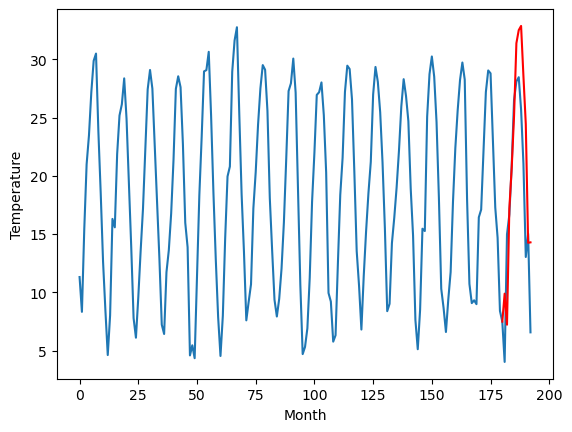

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		9.70		-1.01
6.82		7.04		0.22
17.74		17.00		-0.74
19.92		20.49		0.57
23.45		24.94		1.49
30.30		31.21		0.91
31.79		32.33		0.54
32.16		32.69		0.53
28.73		28.37		-0.36
23.86		24.26		0.40
16.02		14.07		-1.95
17.76		14.11		-3.65
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.33, 9.702192721366883, 7.036741194725037, 16.999330458641055, 20.492115674018862, 24.939099488258364, 31.20720118045807, 32.330687580108645, 32.69331514596939, 28.368618605136874, 24.263576624393465, 14.06953155755997, 14.107286041080954]


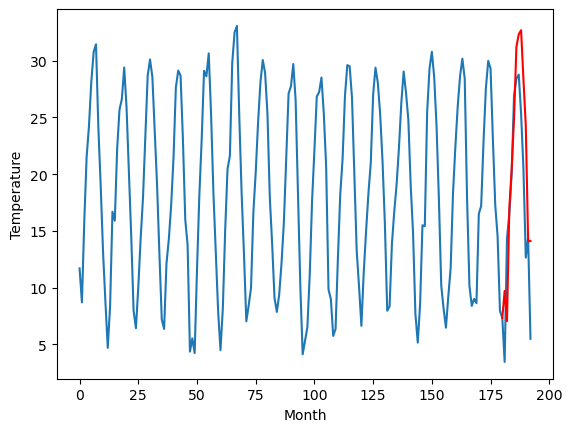

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		10.08		-0.51
9.02		7.42		-1.60
18.27		17.38		-0.89
20.50		20.87		0.37
25.99		25.32		-0.67
30.95		31.59		0.64
30.69		32.71		2.02
31.01		33.07		2.06
30.32		28.75		-1.57
24.62		24.64		0.02
17.68		14.45		-3.23
18.09		14.49		-3.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 10.082192721366882, 7.416741194725036, 17.37933045864105, 20.872115674018858, 25.31909948825836, 31.587201180458067, 32.71068758010864, 33.07331514596939, 28.74861860513687, 24.64357662439346, 14.449531557559965, 14.48728604108095]


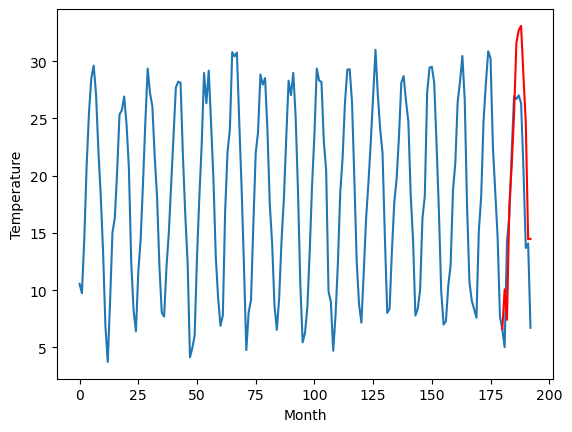

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		8.95		-1.84
11.46		6.29		-5.17
17.86		16.25		-1.61
20.59		19.74		-0.85
24.04		24.19		0.15
28.06		30.46		2.40
29.80		31.58		1.78
29.93		31.94		2.01
25.96		27.62		1.66
22.16		23.51		1.35
14.00		13.32		-0.68
15.91		13.36		-2.55
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.04, 8.952192721366883, 6.286741194725037, 16.249330458641055, 19.742115674018862, 24.189099488258364, 30.45720118045807, 31.580687580108645, 31.943315145969393, 27.618618605136874, 23.513576624393465, 13.31953155755997, 13.357286041080954]


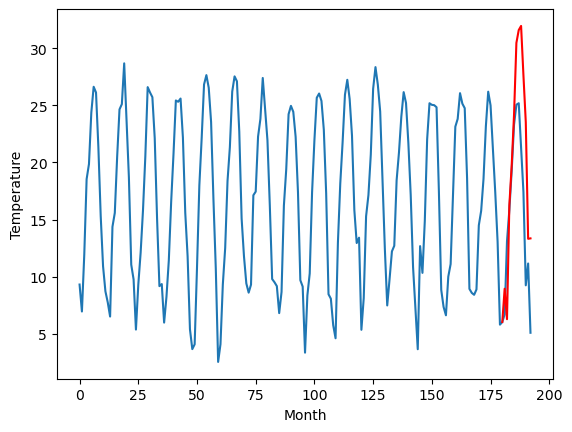

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		7.71		0.06
4.04		5.05		1.01
16.31		15.01		-1.30
18.21		18.50		0.29
22.25		22.95		0.70
28.55		29.22		0.67
29.84		30.34		0.50
30.36		30.70		0.34
27.32		26.38		-0.94
21.55		22.27		0.72
13.61		12.08		-1.53
15.07		12.12		-2.95
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.13, 7.712192721366883, 5.046741194725037, 15.009330458641053, 18.50211567401886, 22.949099488258362, 29.21720118045807, 30.340687580108643, 30.70331514596939, 26.37861860513687, 22.273576624393463, 12.079531557559967, 12.117286041080952]


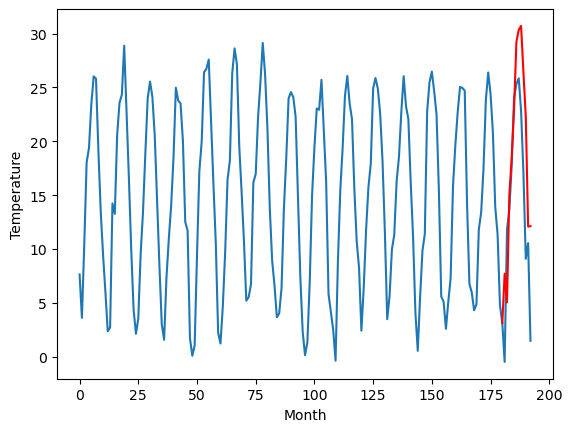

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		6.03		-0.03
2.70		3.37		0.67
14.67		13.33		-1.34
18.32		16.82		-1.50
22.73		21.27		-1.46
29.97		27.54		-2.43
30.54		28.66		-1.88
31.40		29.02		-2.38
27.91		24.70		-3.21
22.56		20.59		-1.97
11.70		10.40		-1.30
12.02		10.44		-1.58
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.29, 6.032192721366882, 3.3667411947250363, 13.329330458641053, 16.82211567401886, 21.269099488258362, 27.53720118045807, 28.660687580108643, 29.02331514596939, 24.698618605136872, 20.593576624393464, 10.399531557559968, 10.437286041080952]


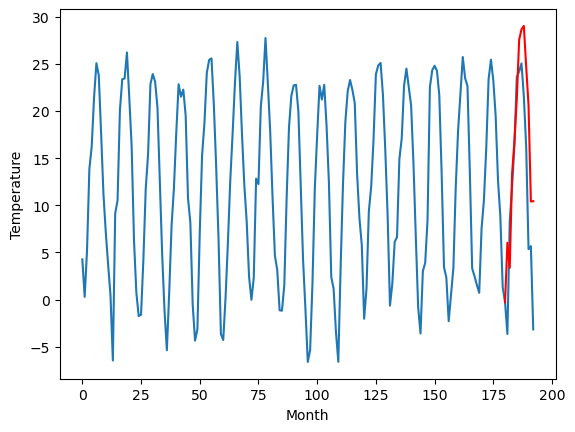

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		2.65		0.42
-2.21		-0.01		2.20
11.65		9.95		-1.70
15.36		13.44		-1.92
20.14		17.89		-2.25
27.53		24.16		-3.37
27.24		25.28		-1.96
27.52		25.64		-1.88
24.41		21.32		-3.09
18.95		17.21		-1.74
8.64		7.02		-1.62
8.39		7.06		-1.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-1.03, 2.652192721366882, -0.013258805274963592, 9.949330458641052, 13.44211567401886, 17.88909948825836, 24.157201180458067, 25.28068758010864, 25.64331514596939, 21.31861860513687, 17.21357662439346, 7.019531557559965, 7.05728604108095]


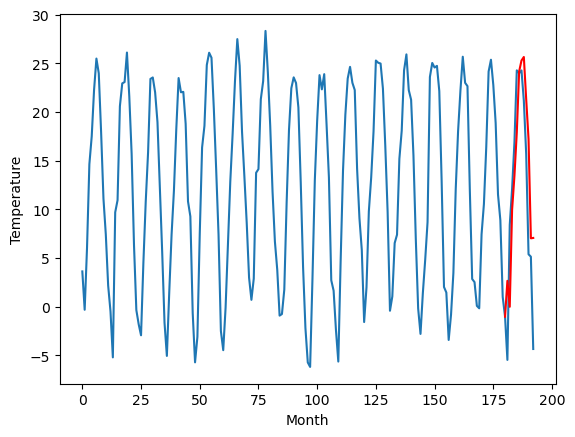

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		2.01		0.31
-0.54		-0.65		-0.11
9.35		9.31		-0.04
13.15		12.80		-0.35
17.68		17.25		-0.43
24.57		23.52		-1.05
24.73		24.64		-0.09
25.93		25.00		-0.93
21.64		20.68		-0.96
18.11		16.57		-1.54
7.71		6.38		-1.33
6.85		6.42		-0.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-2.29, 2.0121927213668824, -0.6532588052749633, 9.309330458641053, 12.80211567401886, 17.249099488258363, 23.51720118045807, 24.640687580108644, 25.003315145969392, 20.678618605136872, 16.573576624393464, 6.379531557559968, 6.417286041080953]


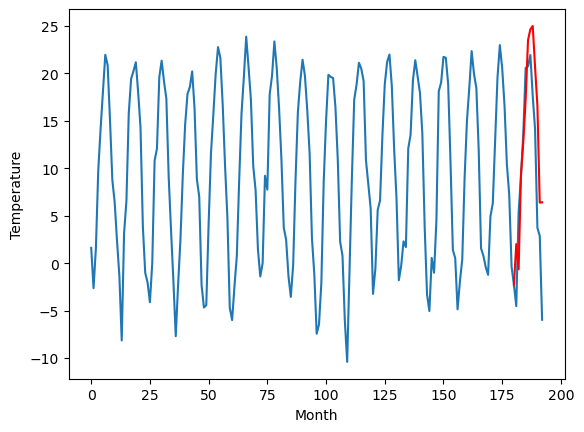

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   2.012193
1                 1    5.59   3.282193
2                 2   15.41  13.772193
3                 3   10.57   9.882193
4                 4   10.71   9.702193
5                 5   10.59  10.082193
6                 6   10.79   8.952193
7                 7    7.65   7.712193
8                 8    6.06   6.032193
9                 9    2.23   2.652193
10               10    1.70   2.012193


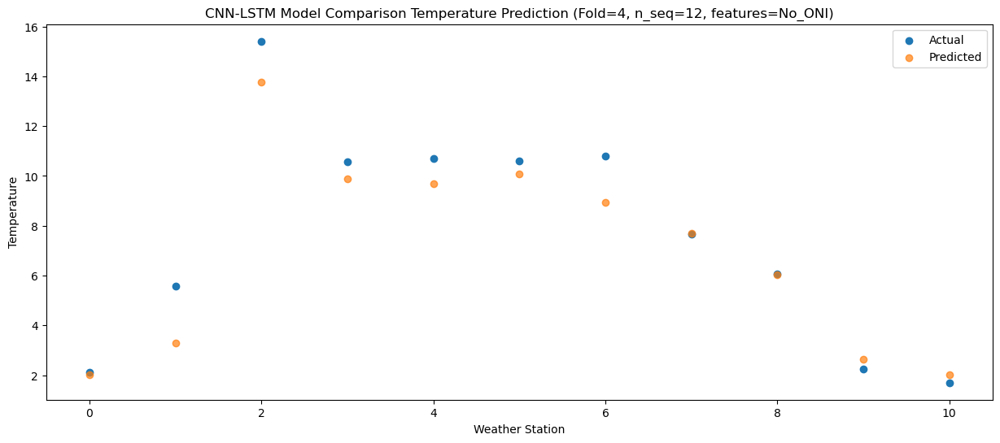

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02  -0.653259
1                 1    9.02   0.616741
2                 2   13.49  11.106741
3                 3    7.11   7.216741
4                 4    6.82   7.036741
5                 5    9.02   7.416741
6                 6   11.46   6.286741
7                 7    4.04   5.046741
8                 8    2.70   3.366741
9                 9   -2.21  -0.013259
10               10   -0.54  -0.653259


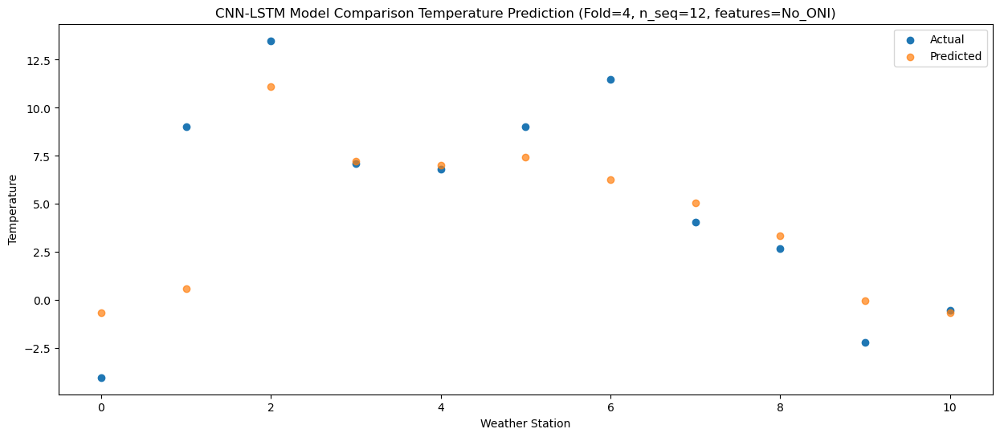

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71    9.30933
1                 1   10.62   10.57933
2                 2   22.82   21.06933
3                 3   18.07   17.17933
4                 4   17.74   16.99933
5                 5   18.27   17.37933
6                 6   17.86   16.24933
7                 7   16.31   15.00933
8                 8   14.67   13.32933
9                 9   11.65    9.94933
10               10    9.35    9.30933


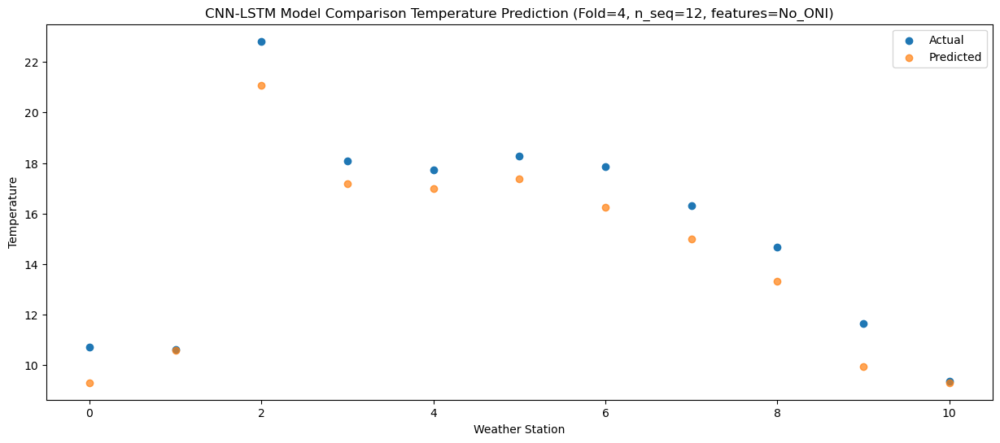

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  12.802116
1                 1   12.06  14.072116
2                 2   23.89  24.562116
3                 3   19.76  20.672116
4                 4   19.92  20.492116
5                 5   20.50  20.872116
6                 6   20.59  19.742116
7                 7   18.21  18.502116
8                 8   18.32  16.822116
9                 9   15.36  13.442116
10               10   13.15  12.802116


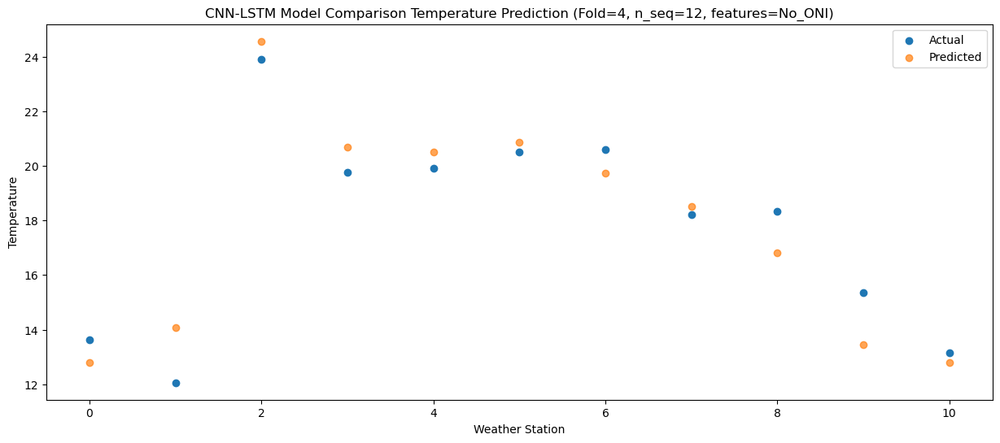

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  17.249099
1                 1   16.10  18.519099
2                 2   28.36  29.009099
3                 3   23.92  25.119099
4                 4   23.45  24.939099
5                 5   25.99  25.319099
6                 6   24.04  24.189099
7                 7   22.25  22.949099
8                 8   22.73  21.269099
9                 9   20.14  17.889099
10               10   17.68  17.249099


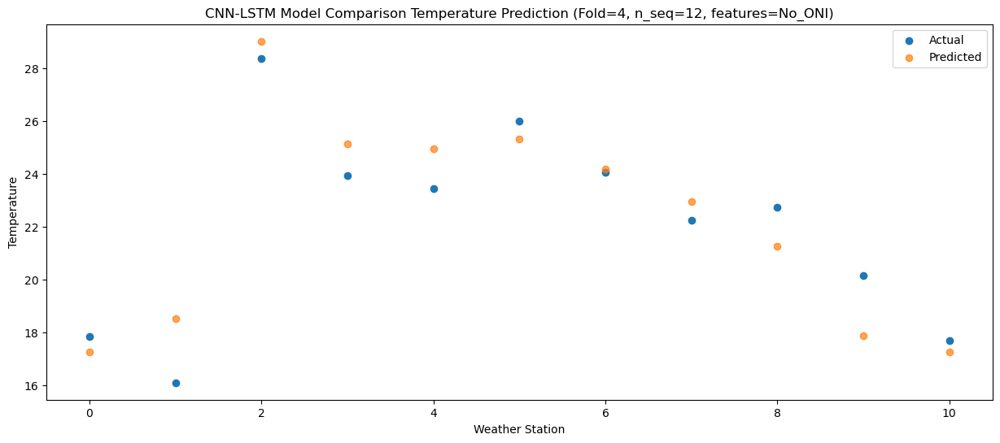

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74  23.517201
1                 1   17.73  24.787201
2                 2   32.62  35.277201
3                 3   29.60  31.387201
4                 4   30.30  31.207201
5                 5   30.95  31.587201
6                 6   28.06  30.457201
7                 7   28.55  29.217201
8                 8   29.97  27.537201
9                 9   27.53  24.157201
10               10   24.57  23.517201


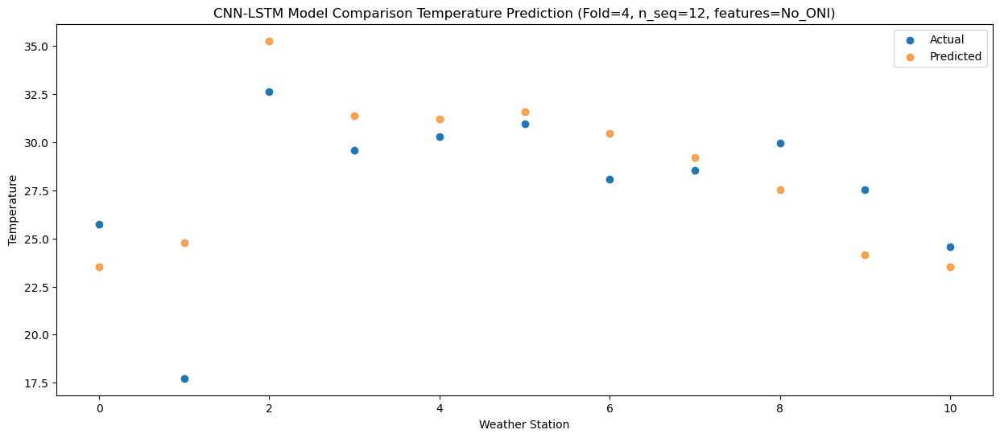

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   26.54  24.640688
1                 1   18.10  25.910688
2                 2   33.28  36.400688
3                 3   31.19  32.510688
4                 4   31.79  32.330688
5                 5   30.69  32.710688
6                 6   29.80  31.580688
7                 7   29.84  30.340688
8                 8   30.54  28.660688
9                 9   27.24  25.280688
10               10   24.73  24.640688


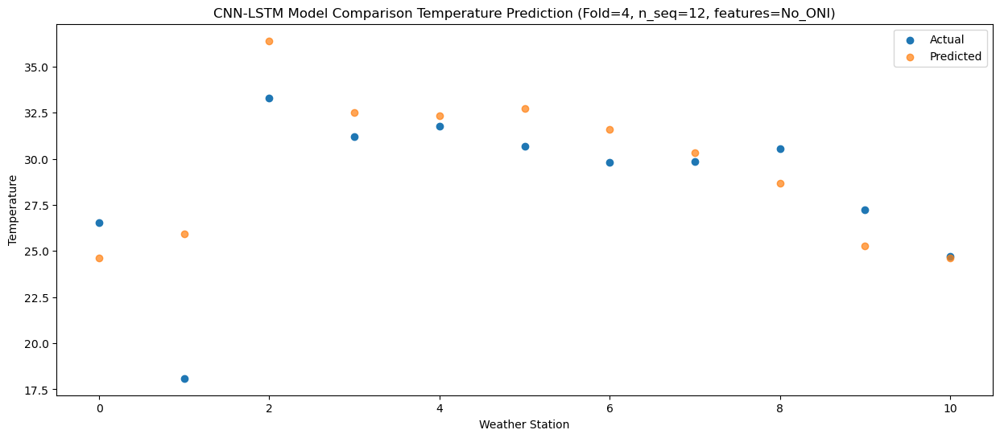

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   26.94  25.003315
1                 1   18.38  26.273315
2                 2   33.93  36.763315
3                 3   31.56  32.873315
4                 4   32.16  32.693315
5                 5   31.01  33.073315
6                 6   29.93  31.943315
7                 7   30.36  30.703315
8                 8   31.40  29.023315
9                 9   27.52  25.643315
10               10   25.93  25.003315


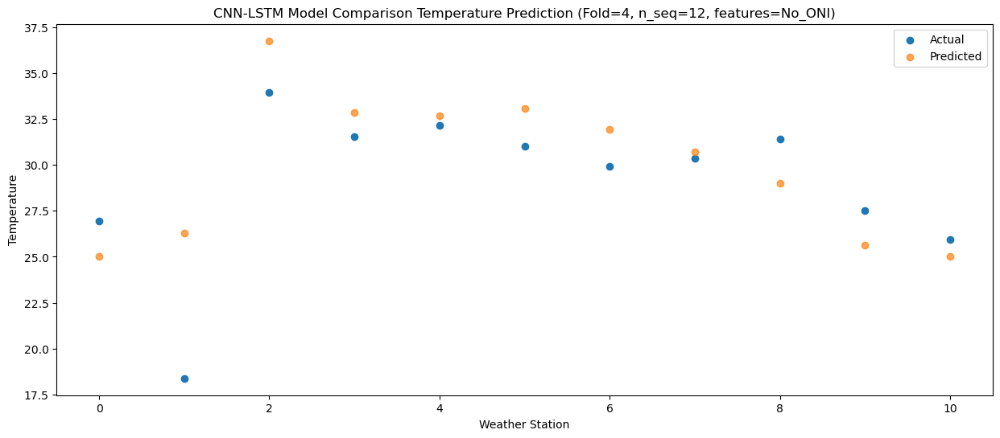

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   23.75  20.678619
1                 1   17.09  21.948619
2                 2   30.81  32.438619
3                 3   28.77  28.548619
4                 4   28.73  28.368619
5                 5   30.32  28.748619
6                 6   25.96  27.618619
7                 7   27.32  26.378619
8                 8   27.91  24.698619
9                 9   24.41  21.318619
10               10   21.64  20.678619


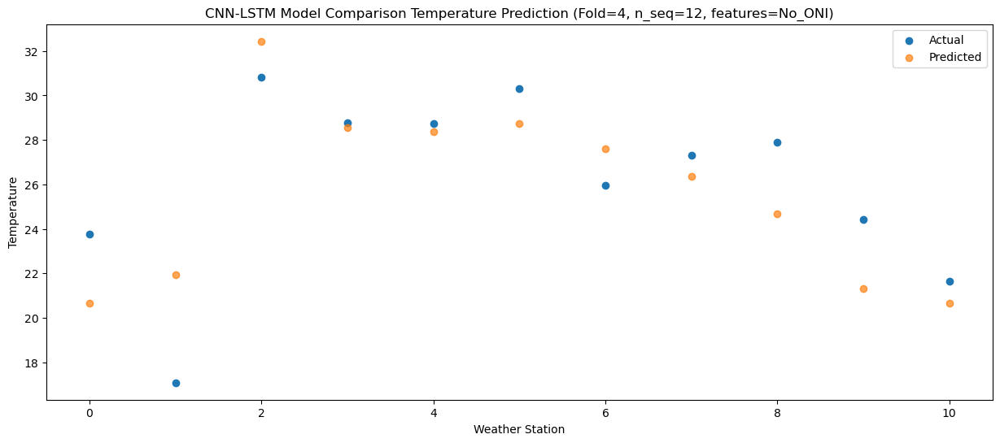

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.62  16.573577
1                 1   15.25  17.843577
2                 2   27.42  28.333577
3                 3   24.12  24.443577
4                 4   23.86  24.263577
5                 5   24.62  24.643577
6                 6   22.16  23.513577
7                 7   21.55  22.273577
8                 8   22.56  20.593577
9                 9   18.95  17.213577
10               10   18.11  16.573577


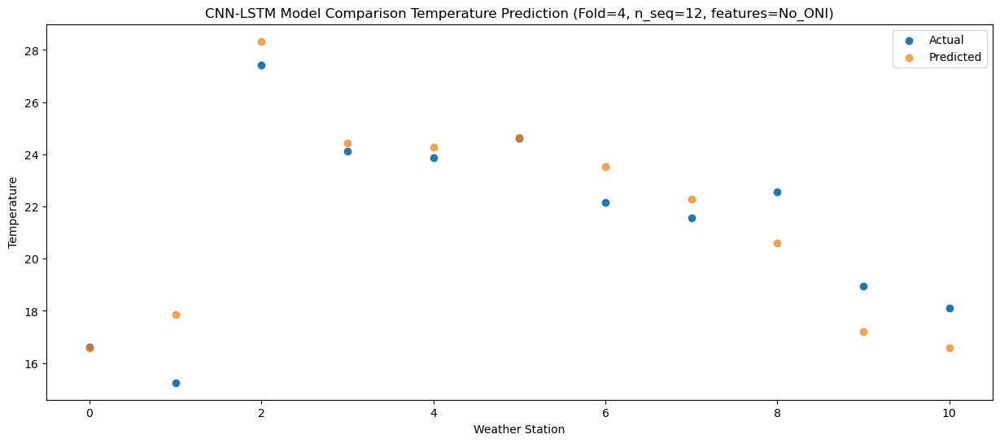

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    9.56   6.379532
1                 1    8.09   7.649532
2                 2   18.75  18.139532
3                 3   16.12  14.249532
4                 4   16.02  14.069532
5                 5   17.68  14.449532
6                 6   14.00  13.319532
7                 7   13.61  12.079532
8                 8   11.70  10.399532
9                 9    8.64   7.019532
10               10    7.71   6.379532


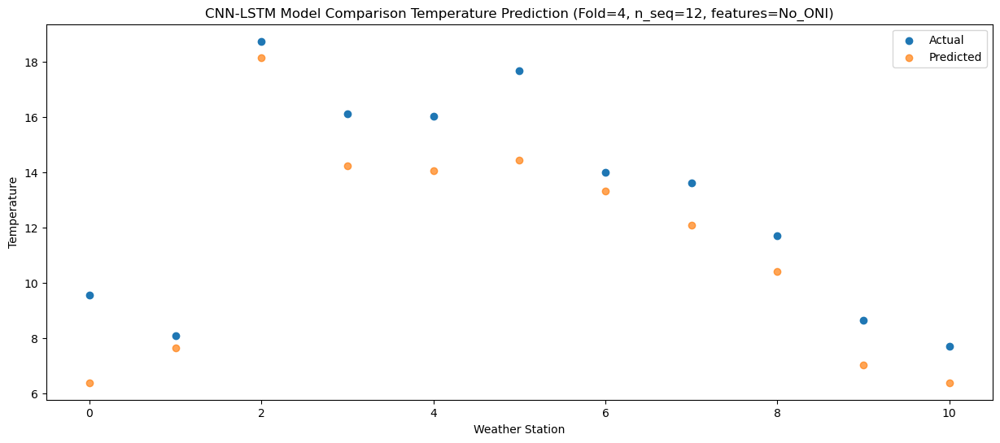

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.77   6.417286
1                 1    9.89   7.687286
2                 2   22.26  18.177286
3                 3   18.12  14.287286
4                 4   17.76  14.107286
5                 5   18.09  14.487286
6                 6   15.91  13.357286
7                 7   15.07  12.117286
8                 8   12.02  10.437286
9                 9    8.39   7.057286
10               10    6.85   6.417286


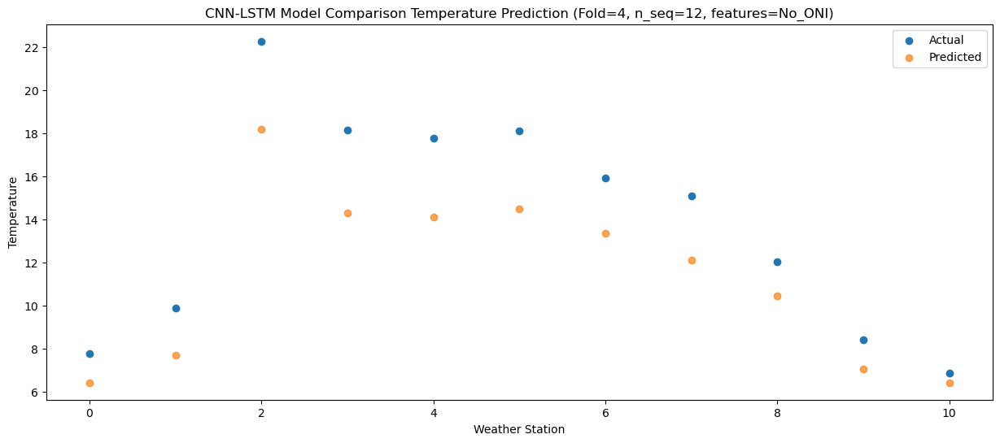

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]
 [26.54 18.1  33.28 31.19 31.79 30.69 29.8  29.84 30.54 27.24 24.73]
 [26.94 18.38 33.93 31.56 32.16 31.01 29.93 30.36 31.4  27.52 25.93]
 [23.75 17.09 30.81 28.77 28.73 30.32 25.96 27.32 27.91 24.41 21.64]
 [16.62 15.25 27.42 24.12 23.86 24.62 22.16 21.55 22.56 18.95 18.11]
 [ 9.56  8.09 18.75 16.12 16.02 17.68 14.   13.61 11.7   8.64  7.71]
 [ 7.77  9.89 22.26 18.12 17.76 18.09 15.91 15.07 12.02  8.39  6.85]]
[[ 2.01219272e+00  3.28219272e+00  1.37721927e+01  9.88219272e+00
   9.70219272e+00  1.00821927e+01  8.95219272e+00  7.71219272e+00
   6.03219272e+00  2.65219272e+00

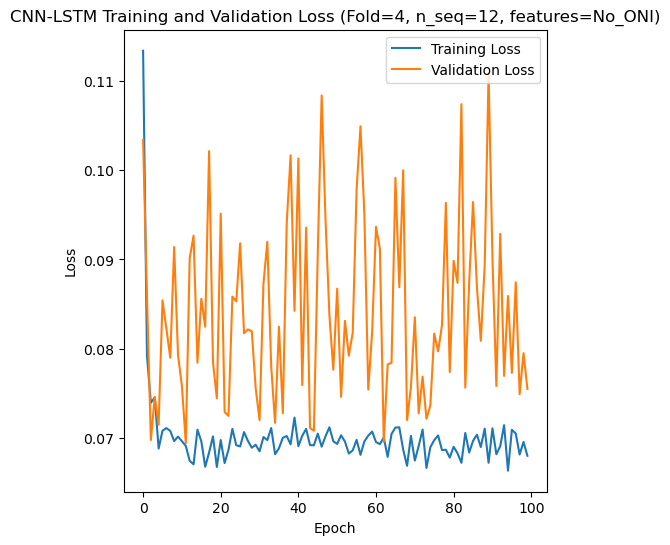

[[2.467723638109376], [2.122641334892074], [2.982334797780669], [3.094346790096348], [2.244581516548533]]
[[array(2.46772364)], [array(2.12264133)], [array(2.9823348)], [array(3.09434679)], [array(2.24458152)]]
[[1.9017671561060532], [1.6980285884756035], [2.1857838100420706], [2.051191092259956], [1.6580349445997764]]
[[0.12172118205030613], [0.09818683015992408], [0.15570916721332212], [0.4314009560385864], [0.11718242350332192]]
[[0.9015793793035135], [0.9196808793042556], [0.8807275930914678], [0.8800908215831769], [0.9354985004903184]]
[[array(0.09678558)], [array(0.09818683)], [array(0.15570917)], [array(0.03412937)], [array(0.08625459)]]
[[array(0.9462706)], [array(0.93925148)], [array(0.8814149)], [array(0.90606226)], [array(0.94526159)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 24.44 24.55 20.97 16.95  8.19 11.57
 12.87 12.78 17.84 19.24 23.26 26.74 27.96 28.3  26.17 23.54 18.03 17.79
 15.34 16.2  22.18 23.82 27.8  31.94 33.7  33.98 30.41 26.53 18.17 20.35
  9.    7.43 15.34 17.13

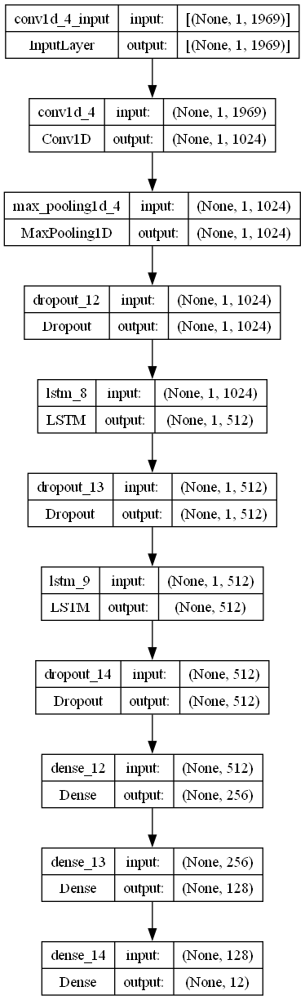

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 1024
    lr = 0.44426829565229875
    optimizer = SGD(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 512
    dropout_rate = 0.15483552452863591

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_CV_S12_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)